# Inspection of variables after 2-prong topology selection

**_must run with dfs created with the 2-PFP cut_**

This notebook inspects the selection after the 2-PFP requirement, where the decrease in efficiency grows significant


- inspect cut variable distributions, compare data vs. MC
- optimize PID cuts in favor of purity over efficiency
- evalutes reconstruction resolution of kinematic variables to measure

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib as mpl
from os import path
import sys
import uproot
from tqdm import tqdm

# local imports
sys.path.append('../../')
from variable_configs import VariableConfig
from analysis_village.numucc1p0pi.selection_definitions import *
from pyanalib.split_df_helpers import *
from pyanalib.stat_helpers import *
from makedf.constants import *

plt.style.use("presentation.mplstyle")
cmap = mpl.cm.viridis
norm = mpl.colors.Normalize(vmin=0.0, vmax=1.0)
from matplotlib.colors import LogNorm

In [3]:
def match_trkdf_to_slcdf(trkdf, slcdf):
    # trkdf: df to match
    # slcdf: df to match to
    matched_trkdf = trkdf.reset_index(level=[3]).loc[slcdf.index].reset_index().set_index(trkdf.index.names)
    return matched_trkdf


In [4]:
def mag3d(df1, df2):
    return np.sqrt((df1.x - df2.x)**2 + (df1.y - df2.y)**2 + (df1.z - df2.z)**2)

In [ ]:
save_fig = True
save_fig_dir = "/exp/sbnd/data/users/munjung/plots/numucc1p0pi/2prong_variables"

# Load dfs

In [6]:
file_dir = "/exp/sbnd/data/users/munjung/xsec/NuINT2025"
## -- MC 
mc_file = path.join(file_dir, "MC_bnb_cosmics_2prong_haddedfiles.df")
mc_split_df = pd.read_hdf(mc_file, key="split")
mc_n_split = get_n_split(mc_file)
print("mc_n_split: %d" %(mc_n_split))
print_keys(mc_file)

## -- Data
# data_file = path.join(file_dir, "Data_dev-2prong.df")
# data_file = path.join(file_dir, "Data_dev_sel_v5_newcal-2prong.df")
# data_file = path.join(file_dir, "Data_dev_sel_v5_newcal-2prong_50ms.df")
data_file = path.join(file_dir, "Data_dev_sel_v5_newcal-2prong_35ms_fast.df")
data_split_df = pd.read_hdf(data_file, key="split")
data_n_split = get_n_split(data_file)
print("data_n_split: %d" %(data_n_split))
print_keys(data_file)

## -- Intime Data
intime_file = "/exp/sbnd/data/users/munjung/xsec/2025B/Data_intime-2prong.df"
intime_split_df = pd.read_hdf(intime_file, key="split")
intime_n_split = get_n_split(intime_file)
print("intime_n_split: %d" %(intime_n_split))
print_keys(intime_file)

mc_n_split: 2
Keys: ['/evt_0', '/evt_1', '/hdr_0', '/hdr_1', '/split']
data_n_split: 1
Keys: ['/bnbpot_0', '/evt_0', '/hdr_0', '/split']
intime_n_split: 1
Keys: ['/bnbpot_0', '/evt_0', '/hdr_0', '/split']


In [7]:
# concat dfs 
n_max_concat = 5

mc_keys2load = ['hdr', 'evt'] 
mc_dfs = load_dfs(mc_file, mc_keys2load, n_max_concat=n_max_concat)
mc_hdr_df = mc_dfs['hdr']
mc_evt_df = mc_dfs['evt']

data_keys2load = ['evt', 'hdr']
data_dfs = load_dfs(data_file, data_keys2load, n_max_concat=n_max_concat)
data_evt_df = data_dfs['evt']
data_hdr_df = data_dfs['hdr']

intime_keys2load = ['hdr', 'evt']
intime_dfs = load_dfs(intime_file, intime_keys2load, n_max_concat=n_max_concat)
intime_hdr_df = intime_dfs['hdr']
intime_evt_df = intime_dfs['evt']

In [8]:
## total pot - scale to data POT

# BNB data
data_tot_pot = data_hdr_df['pot'].sum()
print("data_tot_pot: %.3e" %(data_tot_pot))
pot_str = "5.98 $\\times 10^{18}$"
data_evt_df["pot_weight"] = np.ones(len(data_evt_df))
data_gates = data_hdr_df.nbnbinfo.sum()
print("data tot gates : %.3e" %(data_gates))

# BNB MC
mc_tot_pot = mc_hdr_df['pot'].sum()
print("mc_tot_pot: %.3e" %(mc_tot_pot))
mc_pot_scale = data_tot_pot / mc_tot_pot
print("mc_pot_scale: %.3e" %(mc_pot_scale))
mc_evt_df["pot_weight"] = mc_pot_scale * np.ones(len(mc_evt_df))

# Intime Data
# intime_gates = intime_hdr.noffbeambnb.sum()
intime_gates = intime_hdr_df[intime_hdr_df['first_in_subrun'] == 1]['noffbeambnb'].sum()
print("intime cosmics data gates: {:.2e}".format(intime_gates))
f = 0.073
scale_intime_to_lightdata = (1-f)*data_gates/intime_gates
print("goal scale: {:.2f}".format(scale_intime_to_lightdata))
intime_evt_df["gates_weight"] = scale_intime_to_lightdata * np.ones(len(intime_evt_df))

data_tot_pot: 5.977e+18
data tot gates : 1.257e+06
mc_tot_pot: 5.856e+20
mc_pot_scale: 1.021e-02
intime cosmics data gates: 1.36e+08
goal scale: 0.01


In [9]:
9.55e5/2.34e6
1.26e6/5e5

2.52

# Plotter

In [10]:
nu_cosmics_labels = ["Cosmic", r"Out-FV $\nu$", r"FV $\nu$"]
# nu_cosmics_colors = ["#ED5564", "#FFCE54", "#A0D568"]
nu_cosmics_colors = ["gray", "C0", "C1"]

topology_labels = ["Cosmic", r"Out-FV $\nu$", r"FV other $\nu$", r"FV $\nu_{\mu}$ NC",  
                  r"FV $\nu_{\mu}$ CC Other", r"FV $\nu_{\mu}$ CC Np0$\pi$", r"FV $\nu_{\mu}$ CC 1p0$\pi$"]
topology_colors = ["gray", "sienna", "crimson", "darkgreen", 
                  "coral", "darkslateblue", "mediumslateblue"]

genie_labels = ["Cosmic", r"Out-FV $\nu$", r"FV $\nu$ Other", r"FV $\nu_{\mu}$ NC",
                r"FV $\nu_{\mu}$ CC Other", r"FV $\nu_{\mu}$ CC DIS",
                r"FV $\nu_{\mu}$ CC RES", r"FV $\nu_{\mu}$ CC MEC",
                r"FV $\nu_{\mu}$ CC QE"]
genie_colors = ["gray", "sienna", "crimson", "darkgreen",
                "#BFB17C", "#D88A3B", "#2c7c94",
                "#390C1E", "#9b5580"]

In [11]:
def hist_plot(type,
              evtdf, vardf, 
              vardf_data, var_intime,
              bins,
              plot_labels=["", "", ""],
              ratio = True,
              vline = None,
              approval="internal",
              save_fig=False, save_name=None): 

    assert len(evtdf) == len(vardf)

    tot_mc_count = len(evtdf)
    tot_data_count = len(vardf_data)

    if type == "nu_cosmics":
        labels = nu_cosmics_labels
        colors = nu_cosmics_colors

        cut_cosmic = IsCosmic(evtdf)
        cut_nu_outfv = IsNuOutFV(evtdf)
        cut_nu_infv = IsNuInFV(evtdf)
        cuts = [cut_cosmic, cut_nu_outfv, cut_nu_infv]

    elif type == "topology":
        labels = topology_labels
        colors = topology_colors

        cut_cosmic = IsCosmic(evtdf)
        cut_nu_outfv = IsNuOutFV(evtdf)
        cut_nu_infv_nu_other = IsNuInFV_NuOther(evtdf)
        cut_nu_infv_numu_nc = IsNuInFV_NumuNC(evtdf)
        cut_nu_infv_numu_cc_other = IsNuInFV_NumuCC_Other(evtdf)
        cut_nu_infv_numu_cc_np0pi = IsNuInFV_NumuCC_Np0pi(evtdf)
        cut_nu_infv_numu_cc_1p0pi = IsNuInFV_NumuCC_1p0pi(evtdf)
        cuts = [cut_cosmic, cut_nu_outfv, cut_nu_infv_nu_other, cut_nu_infv_numu_nc, 
                cut_nu_infv_numu_cc_other, cut_nu_infv_numu_cc_np0pi, cut_nu_infv_numu_cc_1p0pi]

    elif type == "genie":
        labels = genie_labels
        colors = genie_colors

        cut_cosmic = IsCosmic(evtdf)
        cut_nu_outfv = IsNuOutFV(evtdf)
        cut_nu_infv_nu_other = IsNuInFV_NuOther(evtdf)
        cut_nu_infv_numu_nc = IsNuInFV_NumuNC(evtdf)
        print("numu NC", cut_nu_infv_numu_nc.sum())
        # cut_nu_infv_numu_coh = IsNuInFV_NumuCC_COH(evtdf)
        cut_nu_infv_numu_othermode = IsNuInFV_NumuCC_OtherMode(evtdf)
        cut_nu_infv_numu_cc_dis = IsNuInFV_NumuCC_DIS(evtdf)
        cut_nu_infv_numu_cc_res = IsNuInFV_NumuCC_RES(evtdf)
        cut_nu_infv_numu_cc_me = IsNuInFV_NumuCC_MEC(evtdf)
        cut_nu_infv_numu_cc_qe = IsNuInFV_NumuCC_QE(evtdf)
        cuts = [cut_cosmic, cut_nu_outfv, cut_nu_infv_nu_other, cut_nu_infv_numu_nc, 
                cut_nu_infv_numu_othermode, cut_nu_infv_numu_cc_dis, cut_nu_infv_numu_cc_res, 
                cut_nu_infv_numu_cc_me, cut_nu_infv_numu_cc_qe]
        

    else:
        raise ValueError("Invalid type: %s, please choose between [nu_cosmics, topolgy, or genie]" % type)

    # --- Plot template
    if ratio:
        fig, axs = plt.subplots(2, 1, figsize=(8.5, 8), 
                               sharex=True, gridspec_kw={'height_ratios': [4, 1]})
        fig.subplots_adjust(hspace=0.05)
        ax = axs[0]
        ax_r = axs[1]
    else:
        fig, ax = plt.subplots()

    bin_centers = 0.5 * (bins[:-1] + bins[1:])

    # --- Data
    total_data, bins = np.histogram(vardf_data, bins=bins)
    data_err = np.sqrt(total_data)
    ax.errorbar(bin_centers, total_data, yerr=data_err, 
                fmt='o', color='black')  # error bars

    # --- MC
    # collect all MC + intime
    var_categ = [var_intime] + [vardf[i] for i in cuts]
    scale_mc = evtdf.pot_weight.unique()[0]
    # TODO:
    scale_intime = scale_intime_to_lightdata
    weights_categ = [scale_intime*np.ones_like(var_intime)] + [scale_mc*np.ones_like(vardf[i]) for i in cuts] 
    colors = ["silver"] + colors
    labels = ["Cosmic\n(In-time)"] + labels

    mc_stack, _, _ = ax.hist(var_categ,
                                bins=bins,
                                weights=weights_categ,
                                stacked=True,
                                color=colors,
                                label=labels,
                                edgecolor='none',
                                linewidth=0,
                                density=False,
                                histtype='stepfilled')


    # ---- MC stat err
    each_mc_hist_data = []
    each_mc_hist_err2 = []  # sum of squared weights for error

    for data, w in zip(var_categ, weights_categ):
        hist_vals, _ = np.histogram(data, bins=bins, weights=w)
        hist_err2, _ = np.histogram(data, bins=bins, weights=np.square(w))
        each_mc_hist_data.append(hist_vals)
        each_mc_hist_err2.append(hist_err2)

    total_mc = np.sum(each_mc_hist_data, axis=0)
    total_mc_err2 = np.sum(each_mc_hist_err2, axis=0)
    mc_stat_err = np.sqrt(total_mc_err2)

    ax.bar(
       bin_centers,
        2 * mc_stat_err,
        width=np.diff(bins),
        bottom=total_mc - mc_stat_err,
        facecolor='none',             # transparent fill
        edgecolor='dimgray',            # outline color of the hatching
        hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
        linewidth=0.0,
        label='MC Stat. Unc.'
    )


    ax.set_xlim(bins[0], bins[-1])
    if ratio == False: # only plot xlabel if we're not plotting the ratio panel
        ax_r.set_xlabel(plot_labels[0])
    ax.set_ylabel(plot_labels[1])
    ax.set_title(plot_labels[2])

    if ratio:
        # MC stat err
        mc_stat_err_ratio = mc_stat_err / total_mc
        mc_content_ratio = total_mc / total_mc
        mc_stat_err_ratio = np.nan_to_num(mc_stat_err_ratio, nan=0.)
        mc_content_ratio = np.nan_to_num(mc_content_ratio, nan=-999.)
        ax_r.bar(
            bin_centers,
            2*mc_stat_err_ratio,
            width=np.diff(bins),
            bottom=mc_content_ratio - mc_stat_err_ratio,
            facecolor='none',             # transparent fill
            edgecolor='dimgray',          # outline color of the hatching
            hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
            linewidth=0.0,
            label='MC Stat. Unc.'
        )

        # data/MC ratio err
        data_eylow, data_eyhigh = return_data_stat_err(total_data)

        data_ratio = total_data / total_mc
        data_ratio_eylow = data_eylow / total_mc
        data_ratio_eyhigh = data_eyhigh / total_mc
        data_ratio = np.nan_to_num(data_ratio, nan=-999.)
        data_ratio_eylow = np.nan_to_num(data_ratio_eylow, nan=0.)
        data_ratio_eyhigh = np.nan_to_num(data_ratio_eyhigh, nan=0.)
        
        #data_ratio_errors = data_ratio_eylow + data_ratio_eyhigh
        #ax_ratio.errorbar(bin_centers, data_ratio, yerr=data_ratio_errors,
        #                 fmt='o', color='black', label='Data',
        #                 markersize=5, capsize=3, linewidth=1.5)

        ax_r.errorbar(bin_centers, data_ratio,
                  yerr=np.vstack((data_ratio_eylow, data_ratio_eyhigh)),
                  fmt='o', color='black')
                #   , label='Data')
                #   markersize=5, capsize=3, linewidth=1.5)
        
        # if highest value is greater than 2.0, set ylim to 2.0
        ax_r.axhline(1.0, color='red', linestyle='--', linewidth=1)
        
        ax_r.grid(True)
        ax_r.minorticks_on()
        ax_r.grid(which='minor', linestyle=':', linewidth=0.5, color='gray', alpha=0.5)

        ax_r.set_xlabel(plot_labels[0])
        ax_r.set_ylabel("Data/MC")

        if np.max(data_ratio + data_ratio_eyhigh) > 2.0:
            ax_r.set_ylim(0., 2.0)

    # --- Legend
    accum_sum = [np.sum(data) for data in mc_stack]
    accum_sum = [0.] + accum_sum
    total_sum = accum_sum[-1]
    individual_sums = [accum_sum[i + 1] - accum_sum[i] for i in range(len(accum_sum) - 1)]
    fractions = [(count / total_sum) * 100 for count in individual_sums]
    legend_labels = [f"{label} ({frac:.1f}%)" for label, frac in zip(labels[::-1], fractions[::-1])]
    legend_labels += ["Data ({})".format(tot_data_count), "MC Stat. Unc."]
    leg = ax.legend(legend_labels, 
                    loc='upper left', 
                    fontsize=10, 
                    frameon=False, 
                    ncol=3, 
                    bbox_to_anchor=(0.015, 0.985))
    leg_height = leg.get_bbox_to_anchor().height
    max_data_with_err = np.max(total_data + data_eyhigh)
    # ax.set_ylim(0., 1.05 * max_data_with_err + leg_height)
    ax.set_ylim(0., 1.4 * max_data_with_err)

    if vline is not None:
        # Draw a vertical line from y=0 up to the max value of the histogram
        for v in vline:
            ymax = ax.get_ylim()[1]
            ax.vlines(x=v, ymin=0, ymax=ymax*0.75, color='red', linestyle='--')

    # --- approval textbox
    # decide if the distribution is tilted to the right or left
    n_firsthalf = np.sum(total_data[:len(bins)//2])
    n_secondhalf = np.sum(total_data[len(bins)//2:])
    if n_firsthalf > n_secondhalf:
        textloc_x = 0.95
        textloc_ha = 'right'
    else:
        textloc_x = 0.05
        textloc_ha = 'left'

    if approval == "internal":
        ax.text(textloc_x, 0.65, "SBND Internal", transform=ax.transAxes, 
                fontsize=14, color='rosybrown',
                ha=textloc_ha, va='top')

    elif approval == "preliminary":
        ax.text(textloc_x, 0.65, "SBND Preliminary", transform=ax.transAxes, 
                fontsize=14, color='gray',
                ha=textloc_ha, va='top')


    if save_fig:
        plt.savefig(save_name, bbox_inches='tight', dpi=300)
    plt.show()

    # bolder figure lines?
    # ax.tick_params(width=2, length=10)
    # for spine in ax.spines.values():
    #     spine.set_linewidth(2)
    
    ret_dict = {"cuts": cuts}
    return ret_dict

In [12]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib.offsetbox import AnchoredText
from matplotlib.offsetbox import AnchoredOffsetbox, DrawingArea, HPacker, VPacker, TextArea
from matplotlib.legend import Legend

In [13]:
def hist_plot_genie_sb(type,
              evtdf, vardf, 
              vardf_data, var_intime,
              bins,
              plot_labels=["", "", ""], legendloc="right",
              ratio = True,
              vline = None,
              approval="internal",
              save_fig=False, save_name=None): 

    assert len(evtdf) == len(vardf)

    tot_mc_count = len(evtdf)
    tot_data_count = len(vardf_data)

    # repeat later numu labels twice
    labels = genie_labels[:4] 
    for i in range(4, len(genie_labels)):
        labels += [genie_labels[i]] * 2
    colors = genie_colors[:4]
    for i in range(4, len(genie_colors)):
        colors += [genie_colors[i]] * 2
# 
    cut_cosmic = IsCosmic(evtdf)
    cut_nu_outfv = IsNuOutFV(evtdf)
    cut_nu_infv_nu_other = IsNuInFV_NuOther(evtdf)
    cut_nu_infv_numu_nc = IsNuInFV_NumuNC(evtdf)
    print("numu NC", cut_nu_infv_numu_nc.sum())
    # cut_nu_infv_numu_coh = IsNuInFV_NumuCC_COH(evtdf)
    # break down numu modes into signal and background
    cut_nu_infv_numu_othermode_s = IsNuInFV_NumuCC_OtherMode(evtdf) & IsNuInFV_NumuCC_1p0pi(evtdf)
    cut_nu_infv_numu_othermode_b = IsNuInFV_NumuCC_OtherMode(evtdf) & ~IsNuInFV_NumuCC_1p0pi(evtdf)
    cut_nu_infv_numu_cc_dis_s = IsNuInFV_NumuCC_DIS(evtdf) & IsNuInFV_NumuCC_1p0pi(evtdf)
    cut_nu_infv_numu_cc_dis_b = IsNuInFV_NumuCC_DIS(evtdf) & ~IsNuInFV_NumuCC_1p0pi(evtdf)
    cut_nu_infv_numu_cc_res_s = IsNuInFV_NumuCC_RES(evtdf) & IsNuInFV_NumuCC_1p0pi(evtdf)
    cut_nu_infv_numu_cc_res_b = IsNuInFV_NumuCC_RES(evtdf) & ~IsNuInFV_NumuCC_1p0pi(evtdf)
    cut_nu_infv_numu_cc_mec_s = IsNuInFV_NumuCC_MEC(evtdf) & IsNuInFV_NumuCC_1p0pi(evtdf)
    cut_nu_infv_numu_cc_mec_b = IsNuInFV_NumuCC_MEC(evtdf) & ~IsNuInFV_NumuCC_1p0pi(evtdf)
    cut_nu_infv_numu_cc_qe_s = IsNuInFV_NumuCC_QE(evtdf) & IsNuInFV_NumuCC_1p0pi(evtdf)
    cut_nu_infv_numu_cc_qe_b = IsNuInFV_NumuCC_QE(evtdf) & ~IsNuInFV_NumuCC_1p0pi(evtdf)
    cuts = [cut_cosmic, cut_nu_outfv, cut_nu_infv_nu_other, cut_nu_infv_numu_nc, 
            cut_nu_infv_numu_othermode_b, cut_nu_infv_numu_othermode_s,
            cut_nu_infv_numu_cc_dis_b, cut_nu_infv_numu_cc_dis_s,
            cut_nu_infv_numu_cc_res_b, cut_nu_infv_numu_cc_res_s,
            cut_nu_infv_numu_cc_mec_b, cut_nu_infv_numu_cc_mec_s,
            cut_nu_infv_numu_cc_qe_b, cut_nu_infv_numu_cc_qe_s]
        

    # --- Plot template
    if ratio:
        fig, axs = plt.subplots(2, 1, figsize=(8.5, 8), 
                               sharex=True, gridspec_kw={'height_ratios': [4, 1]})
        fig.subplots_adjust(hspace=0.05)
        ax = axs[0]
        ax_r = axs[1]
    else:
        fig, ax = plt.subplots()

    bin_centers = 0.5 * (bins[:-1] + bins[1:])

    # --- Data
    total_data, bins = np.histogram(vardf_data, bins=bins)
    data_err = np.sqrt(total_data)
    ax.errorbar(bin_centers, total_data, yerr=data_err, 
                fmt='o', color='black')  # error bars

    # --- MC
    # collect all MC + intime
    var_categ = [var_intime] + [vardf[i] for i in cuts]
    scale_mc = evtdf.pot_weight.unique()[0]
    # TODO:
    scale_intime = scale_intime_to_lightdata
    weights_categ = [scale_intime*np.ones_like(var_intime)] + [scale_mc*np.ones_like(vardf[i]) for i in cuts] 
    colors = ["silver"] + colors
    labels = ["Cosmic\n(In-time)"] + labels
    hatches = [None] * len(labels)
    for i in range(5, len(labels), 2):
        hatches[i] = '////'
    # hatches = ['*'] * len(colors)

    mc_stack, _, _ = ax.hist(var_categ,
                                bins=bins,
                                weights=weights_categ,
                                stacked=True,
                                color=colors,
                                label=labels,
                                edgecolor='none',
                                linewidth=0,
                                density=False,
                                histtype='stepfilled')

    # Switch to stacked bar plots using ax.bar for hatches
    bottom = np.zeros(len(bins) - 1)
    for i, (data, w, color, label, hatch) in enumerate(zip(var_categ, weights_categ, colors, labels, hatches)):
        hist_vals, _ = np.histogram(data, bins=bins, weights=w)
        ax.bar(
            bin_centers,
            hist_vals,
            width=np.diff(bins),
            bottom=bottom,
            color='none',
            hatch=hatch,
            edgecolor='white',
            linewidth=0.0,
            align='center'
        )
        bottom += hist_vals


    # ---- MC stat err
    each_mc_hist_data = []
    each_mc_hist_err2 = []  # sum of squared weights for error

    for data, w in zip(var_categ, weights_categ):
        hist_vals, _ = np.histogram(data, bins=bins, weights=w)
        hist_err2, _ = np.histogram(data, bins=bins, weights=np.square(w))
        each_mc_hist_data.append(hist_vals)
        each_mc_hist_err2.append(hist_err2)

    total_mc = np.sum(each_mc_hist_data, axis=0)
    total_mc_err2 = np.sum(each_mc_hist_err2, axis=0)
    mc_stat_err = np.sqrt(total_mc_err2)

    ax.bar(
       bin_centers,
        2 * mc_stat_err,
        width=np.diff(bins),
        bottom=total_mc - mc_stat_err,
        facecolor='none',             # transparent fill
        edgecolor='dimgray',            # outline color of the hatching
        hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
        linewidth=0.0,
        label='MC Stat. Unc.'
    )


    ax.set_xlim(bins[0], bins[-1])
    if ratio == False: # only plot xlabel if we're not plotting the ratio panel
        ax_r.set_xlabel(plot_labels[0])
    ax.set_ylabel(plot_labels[1])
    ax.set_title(plot_labels[2])

    if ratio:
        # MC stat err
        mc_stat_err_ratio = mc_stat_err / total_mc
        mc_content_ratio = total_mc / total_mc
        mc_stat_err_ratio = np.nan_to_num(mc_stat_err_ratio, nan=0.)
        mc_content_ratio = np.nan_to_num(mc_content_ratio, nan=-999.)
        ax_r.bar(
            bin_centers,
            2*mc_stat_err_ratio,
            width=np.diff(bins),
            bottom=mc_content_ratio - mc_stat_err_ratio,
            facecolor='none',             # transparent fill
            edgecolor='dimgray',          # outline color of the hatching
            hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
            linewidth=0.0,
            label='MC Stat. Unc.'
        )

        # data/MC ratio err
        data_eylow, data_eyhigh = return_data_stat_err(total_data)

        data_ratio = total_data / total_mc
        data_ratio_eylow = data_eylow / total_mc
        data_ratio_eyhigh = data_eyhigh / total_mc
        data_ratio = np.nan_to_num(data_ratio, nan=-999.)
        data_ratio_eylow = np.nan_to_num(data_ratio_eylow, nan=0.)
        data_ratio_eyhigh = np.nan_to_num(data_ratio_eyhigh, nan=0.)
        
        #data_ratio_errors = data_ratio_eylow + data_ratio_eyhigh
        #ax_ratio.errorbar(bin_centers, data_ratio, yerr=data_ratio_errors,
        #                 fmt='o', color='black', label='Data',
        #                 markersize=5, capsize=3, linewidth=1.5)

        ax_r.errorbar(bin_centers, data_ratio,
                  yerr=np.vstack((data_ratio_eylow, data_ratio_eyhigh)),
                  fmt='o', color='black')
                #   , label='Data')
                #   markersize=5, capsize=3, linewidth=1.5)
        
        # if highest value is greater than 2.0, set ylim to 2.0
        ax_r.axhline(1.0, color='red', linestyle='--', linewidth=1)
        
        ax_r.grid(True)
        ax_r.minorticks_on()
        ax_r.grid(which='minor', linestyle=':', linewidth=0.5, color='gray', alpha=0.5)

        ax_r.set_xlabel(plot_labels[0])
        ax_r.set_ylabel("Data/MC")

        if np.max(data_ratio + data_ratio_eyhigh) > 2.0:
            ax_r.set_ylim(0., 2.0)


    # --- Legend
    # dummy plot for legend
    accum_sum = [np.sum(data) for data in mc_stack]
    accum_sum = [0.] + accum_sum
    total_sum = accum_sum[-1]
    individual_sums = [accum_sum[i + 1] - accum_sum[i] for i in range(len(accum_sum) - 1)]
    fractions = [(count / total_sum) * 100 for count in individual_sums]
    legend_labels = []
    for lidx in range(5):
        legend_labels.append("{}\n({:0.1f}%/{:0.1f}%)".format(genie_labels[::-1][lidx], fractions[::-1][lidx*2], fractions[::-1][lidx*2+1]))
    for label, frac in zip(genie_labels[::-1][5:], fractions[::-1][10:]):
        legend_labels.append("{}\n({:0.1f}%)".format(label, frac))
    legend_labels += ["Cosmic (In-time)\n({:0.1f}%)".format(fractions[0])]
    legend_labels += ["Data\n({})".format(tot_data_count), "MC Stat. Unc."]

    # Set up legend handles with matching colors
    genie_colors_reversed = genie_colors[::-1]
    genie_labels_reversed = genie_labels[::-1]

    # Handles for the first 5 (with two fractions)
    handles = []
    for lidx in range(5):
        handles.append(Patch(facecolor=genie_colors_reversed[lidx], edgecolor='none'))
    # Handles for the rest of the genie categories (single fraction)
    for cidx in range(5, len(genie_labels_reversed)):
        handles.append(Patch(facecolor=genie_colors_reversed[cidx], edgecolor='none'))
    # Cosmic (In-time) color: assumed to be the last color in genie_colors
    handles.append(Patch(facecolor="silver", edgecolor='none'))
    # Data: black marker
    handles.append(Line2D([0], [0], marker='o', color='black', linestyle='None', markersize=7, label='Data'))
    # MC Stat. Unc.: hatched box, gray edge, no fill
    handles.append(Patch(facecolor='none', edgecolor='dimgray', hatch='xxxx', linewidth=0, label='MC Stat. Unc.'))

    leg = ax.legend(handles, legend_labels, 
                    loc='upper left', 
                    fontsize=10, 
                    frameon=False, 
                    ncol=4, 
                    bbox_to_anchor=(0.015, 0.995))
    leg_height = leg.get_bbox_to_anchor().height
    max_data_with_err = np.max(total_data + data_eyhigh)
    ax.set_ylim(0., 1.4 * max_data_with_err)

    if vline is not None:
        for v in vline:
            ymax = ax.get_ylim()[1]
            ax.vlines(x=v, ymin=0, ymax=ymax*0.7, color='red', linestyle='--')

    # --- "SBND Preliminary" textbox
    # decide if the distribution is tilted to the right or left
    n_firsthalf = np.sum(total_data[:len(bins)//2])
    n_secondhalf = np.sum(total_data[len(bins)//2:])
    if n_firsthalf > n_secondhalf:
        textloc_x = 0.95
        ha = 'right'
    else:
        textloc_x = 0.05
        ha = 'left'

    if approval == "internal":
        ax.text(textloc_x, 0.65, "SBND Internal", transform=ax.transAxes, 
                fontsize=14, color='rosybrown',
                ha=ha, va='top')

    elif approval == "preliminary":
        ax.text(textloc_x, 0.65, "SBND Preliminary", transform=ax.transAxes, 
                fontsize=14, color='gray',
                ha=ha, va='top')

    # separate legend box with S / B hatches
    example_signal = Patch(facecolor="black", edgecolor='white', label='Signal')
    example_background = Patch(facecolor="black", edgecolor='white', hatch='////', linewidth=0, label='Background')
    if legendloc == "left":
        box_ax = ax.inset_axes([0.15, 0.5, 0.13, 0.13], transform=ax.transAxes)
    elif legendloc == "right":
        box_ax = ax.inset_axes([0.7, 0.5, 0.13, 0.13], transform=ax.transAxes)
    box_ax.axis('off')
    mini_legend = Legend(
        box_ax,
        handles=[example_signal, example_background],
        labels=['Signal', 'Background'],
        loc='center',
        fontsize=10,
        frameon=False,
        borderpad=0.7,
        handlelength=2,
        handleheight=1.5,
        ncol=2,
        fancybox=True,
        framealpha=1.0
    )
    box_ax.add_artist(mini_legend)

    if save_fig:
        plt.savefig(save_name, bbox_inches='tight', dpi=300)
    plt.show()

    # bolder figure lines?
    # ax.tick_params(width=2, length=10)
    # for spine in ax.spines.values():
    #     spine.set_linewidth(2)
    
    ret_dict = {"cuts": cuts}
    return ret_dict

In [14]:
def bar_plot(type,
             evtdf,
             plot_labels=["", "", ""], 
             save_fig=False, save_name=None): #, scale, stage):

    if type == "nu_cosmics":
        ncateg = 3
        labels = nu_cosmics_labels
        colors = nu_cosmics_colors

        cut_cosmic = IsCosmic(evtdf)
        cut_nu_outfv = IsNuOutFV(evtdf)
        cut_nu_intfv = IsNu(evtdf) & InFV(evtdf.slc.truth.position)
        cuts = [cut_cosmic, cut_nu_outfv, cut_nu_intfv]

    elif type == "topology":
        ncateg = 7
        labels = topology_labels
        colors = topology_colors

        cut_cosmic = IsCosmic(evtdf)
        cut_nu_outfv = IsNuOutFV(evtdf)
        cut_nu_infv_nu_other = IsNuInFV_NuOther(evtdf)
        cut_nu_infv_numu_nc = IsNuInFV_NumuNC(evtdf)
        cut_nu_infv_numu_cc_other = IsNuInFV_NumuCC_Other(evtdf)
        cut_nu_infv_numu_cc_np0pi = IsNuInFV_NumuCC_Np0pi(evtdf)
        cut_nu_infv_numu_cc_1p0pi = IsNuInFV_NumuCC_1p0pi(evtdf)

        cuts = [cut_cosmic, cut_nu_outfv, cut_nu_infv_nu_other, cut_nu_infv_numu_nc, 
                cut_nu_infv_numu_cc_other, cut_nu_infv_numu_cc_np0pi, cut_nu_infv_numu_cc_1p0pi]

    elif type == "genie":
        ncateg = 9
        labels = genie_labels
        colors = genie_colors

        cut_cosmic = IsCosmic(evtdf)
        cut_nu_outfv = IsNuOutFV(evtdf)
        cut_nu_infv_nu_other = IsNuInFV_NuOther(evtdf)
        cut_nu_infv_numu_nc = IsNuInFV_NumuNC(evtdf)
        # cut_nu_infv_numu_coh = IsNuInFV_NumuCC_COH(evtdf)
        cut_nu_infv_numu_othermode = IsNuInFV_NumuCC_OtherMode(evtdf)
        cut_nu_infv_numu_cc_dis = IsNuInFV_NumuCC_DIS(evtdf)
        cut_nu_infv_numu_cc_res = IsNuInFV_NumuCC_RES(evtdf)
        cut_nu_infv_numu_cc_me = IsNuInFV_NumuCC_MEC(evtdf)
        cut_nu_infv_numu_cc_qe = IsNuInFV_NumuCC_QE(evtdf)
        cuts = [cut_cosmic, cut_nu_outfv, cut_nu_infv_nu_other, cut_nu_infv_numu_nc, 
                cut_nu_infv_numu_othermode, cut_nu_infv_numu_cc_dis, cut_nu_infv_numu_cc_res, 
                cut_nu_infv_numu_cc_me, cut_nu_infv_numu_cc_qe]

    else:
        raise ValueError("Invalid type: %s, please choose between [nu_cosmics, topolgy, or genie]" % type)


    fig, ax = plt.subplots(figsize = (6, ncateg*0.6))

    scale = evtdf.pot_weight.unique()[0]
    size = [scale*len(evtdf[i]) for i in cuts]
    # size = []

    # # make sure that the categories don't overlap
    # for i in range(len(cuts)):
    #     for j in range(i+1, len(cuts)):
    #         if (cuts[i] & cuts[j]).sum() > 0:
    #             print("Categories overlap:", labels[i], labels[j])
    # # and check if the categories cover all events
    # if not np.array(size).sum() == len(evtdf):
    #     print("Categories do not cover all events")
    #     print("Total events:", len(evtdf))
    #     print("Sum of categories:", np.array(size).sum())

    bars = plt.barh(labels, size, align='center', color = colors)
    tot_count = np.array(size).sum()
    
    perc_list = []
    for bar in bars:
        width = bar.get_width()
        label_y_pos = bar.get_y() + bar.get_height() / 2
        perc = 100*(width+0.)/(tot_count+0.)
        ax.text(width+1, label_y_pos, s= ("%0.2f"%(100*(width+0.)/(tot_count+0.)) + "%"), va='center')
        perc_list.append(perc)

    plt.xlabel(plot_labels[0])
    plt.xlim(0, 1.12 * np.max(size))

    if save_fig:
        plt.savefig(save_name, bbox_inches="tight")

    ret_dict = {"cuts": cuts,
                "perc_list": perc_list}
    return ret_dict

In [15]:
plot_labels_bar = ["Events (POT={})".format(pot_str), "", ""]
plot_labels_hist = ["", "Events (POT={})".format(pot_str), ""]

# Collect Through Selection for Summary Plots

In [16]:
df_dict = {} # for efficiency plot
df_dict_data = {} # for efficiency plot
df_dict_intime = {} # for efficiency plot
perc_dict_topo = {} # for topo break-down plot
perc_dict_genie = {} # for genie break-down plot

# Selection

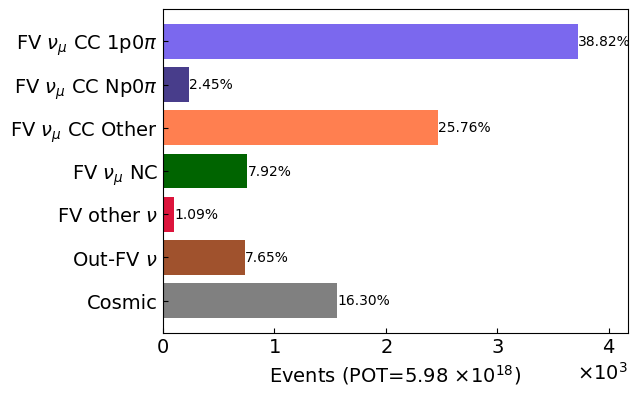

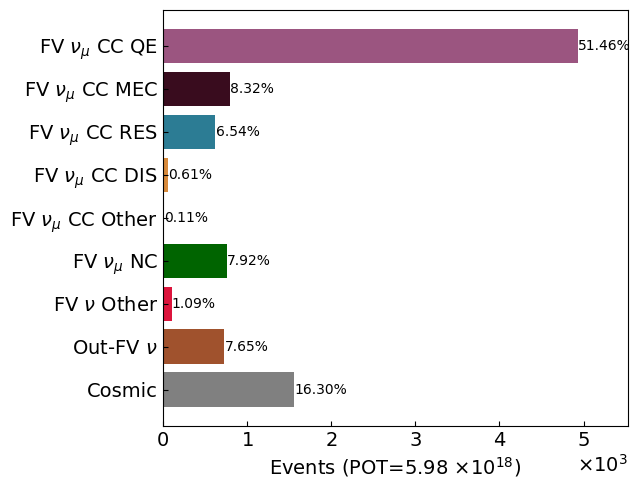

In [17]:
stage_key = "2prong"

bar_type = "topology"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_topo = bar_plot(type=bar_type, evtdf=mc_evt_df, 
                        plot_labels=plot_labels_bar,
                        save_fig=save_fig, save_name=save_name)

bar_type = "genie"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_genie = bar_plot(type=bar_type, evtdf=mc_evt_df, 
                        plot_labels=plot_labels_bar,
                        save_fig=save_fig, save_name=save_name)

df_dict[stage_key] = mc_evt_df
df_dict_data[stage_key] = data_evt_df
df_dict_intime[stage_key] = intime_evt_df
perc_dict_topo[stage_key] = ret_topo["perc_list"]
perc_dict_genie[stage_key] = ret_genie["perc_list"]


In [18]:
## slice vertex in FV
mc_evt_df = mc_evt_df[InFV(mc_evt_df.slc.vertex)]

In [19]:
stage_key = "2prong"
df_dict[stage_key] = mc_evt_df

In [20]:
mc_track1 = mc_evt_df.t1
mc_track2 = mc_evt_df.t2
data_track1 = data_evt_df.t1
data_track2 = data_evt_df.t2
intime_track1 = intime_evt_df.t1
intime_track2 = intime_evt_df.t2

In [21]:
trk_indexnames = list(mc_track1.index.names) + [("pfp", "tindex", "", "", "", "", "")]
mc_trk_df_2prong = pd.concat([mc_track1.reset_index().set_index(trk_indexnames),
                              mc_track2.reset_index().set_index(trk_indexnames)])
data_trk_df_2prong = pd.concat([data_track1.reset_index().set_index(trk_indexnames),
                              data_track2.reset_index().set_index(trk_indexnames)])
intime_trk_df_2prong = pd.concat([intime_track1.reset_index().set_index(trk_indexnames),
                              intime_track2.reset_index().set_index(trk_indexnames)])

mc_trk_df_2prong["pot_weight"] = np.ones(len(mc_trk_df_2prong))*mc_pot_scale
data_trk_df_2prong["pot_weight"] = np.ones(len(data_trk_df_2prong))*mc_pot_scale
intime_trk_df_2prong["pot_weight"] = np.ones(len(intime_trk_df_2prong))*mc_pot_scale

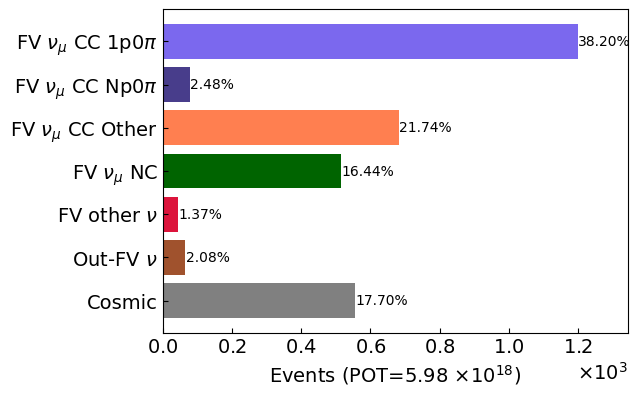

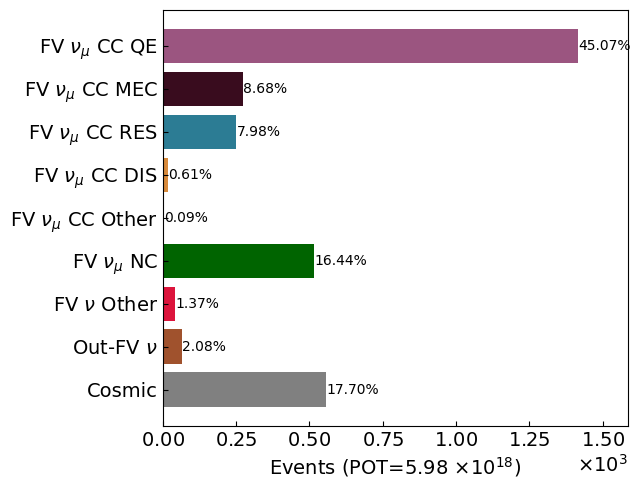

In [22]:
stage_key = "2prong-contained"
mc_mask = InFV(mc_track1.pfp.trk.end) & InFV(mc_track2.pfp.trk.end)
mc_evt_df_2prong = mc_evt_df[mc_mask]
data_mask = InFV(data_track1.pfp.trk.end) & InFV(data_track2.pfp.trk.end)
data_evt_df_2prong = data_evt_df[data_mask]
intime_mask = InFV(intime_track1.pfp.trk.end) & InFV(intime_track2.pfp.trk.end)
intime_evt_df_2prong = intime_evt_df[intime_mask]

bar_type = "topology"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_topo = bar_plot(type=bar_type, evtdf=mc_evt_df_2prong, 
                        plot_labels=plot_labels_bar,
                        save_fig=save_fig, save_name=save_name)

bar_type = "genie"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_genie = bar_plot(type=bar_type, evtdf=mc_evt_df_2prong, 
                        plot_labels=plot_labels_bar,
                        save_fig=save_fig, save_name=save_name)

df_dict[stage_key] = mc_evt_df_2prong
df_dict_data[stage_key] = data_evt_df_2prong
df_dict_intime[stage_key] = intime_evt_df_2prong
perc_dict_topo[stage_key] = ret_topo["perc_list"]
perc_dict_genie[stage_key] = ret_genie["perc_list"]


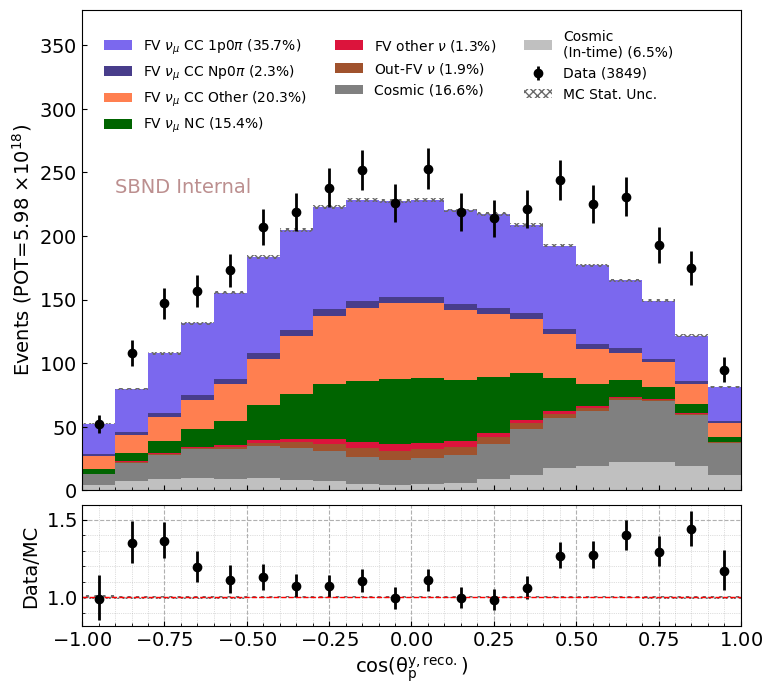

In [23]:
evtdf = mc_evt_df_2prong
vardf = mc_evt_df_2prong.t1.pfp.trk.dir.y
vardf_data = data_evt_df_2prong.t1.pfp.trk.dir.y
vardf_intime = intime_evt_df_2prong.t1.pfp.trk.dir.y
bins = np.linspace(-1,1,21)
eps = 1e-8
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_p^{y, reco.})}$",
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/p_dir_y_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

/tmp/ipykernel_44133/4071213569.py:137: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_44133/4071213569.py:138: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_44133/4071213569.py:156: RuntimeWarning: invalid value encountered in divide
  data_ratio = total_data / total_mc
/tmp/ipykernel_44133/4071213569.py:157: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_44133/4071213569.py:158: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/munjung/xsec/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_base.py:2982: RuntimeWarning: overflow encountered in scalar subtract
  delta = (x1t - x0t) * margin


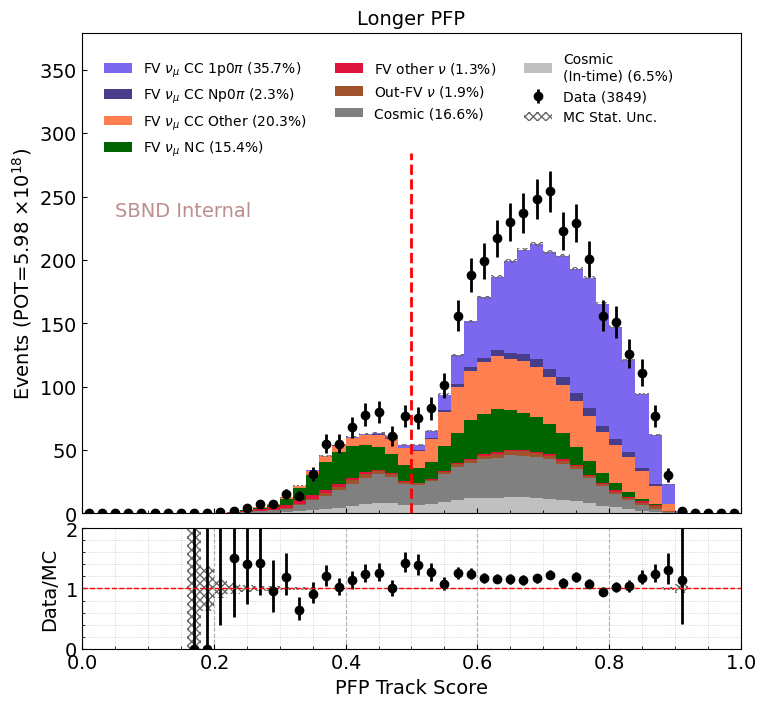

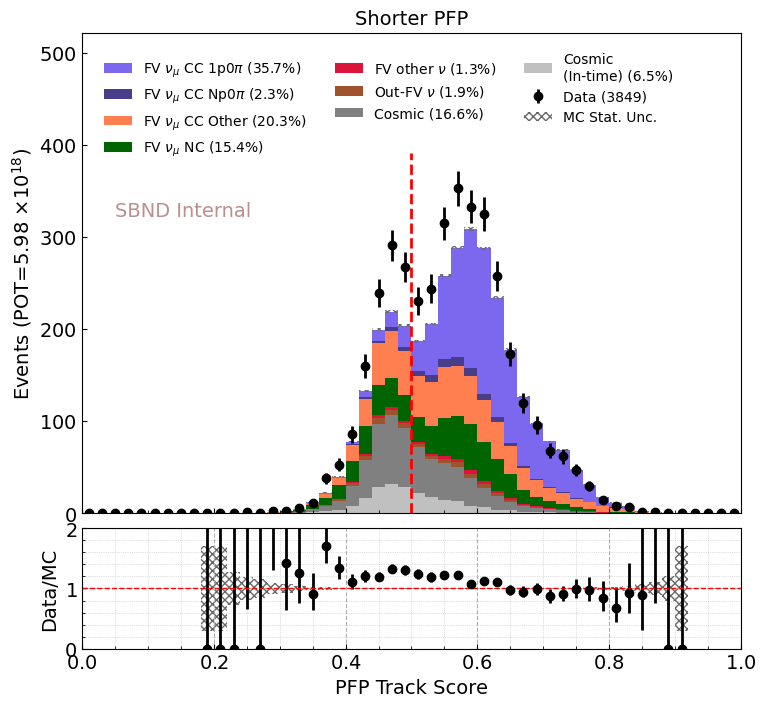

In [24]:
# ==== PID scores for tracks in 2-prong slices ====
plot_type = "topology"
bins = np.linspace(0, 1, 51)
vline = [0.5]

evtdf = mc_evt_df_2prong
vardf = mc_evt_df_2prong.t1.pfp.trackScore
vardf_data = data_evt_df_2prong.t1.pfp.trackScore
vardf_intime = intime_evt_df_2prong.t1.pfp.trackScore
plot_labels = ["PFP Track Score", 
               "Events (POT={})".format(pot_str), "Longer PFP"]

save_name = save_fig_dir + "/pfp_trackscore_{}_t1.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)


evtdf = mc_evt_df_2prong
vardf = mc_evt_df_2prong.t2.pfp.trackScore
vardf_data = data_evt_df_2prong.t2.pfp.trackScore
vardf_intime = intime_evt_df_2prong.t2.pfp.trackScore
plot_labels = ["PFP Track Score", 
               "Events (POT={})".format(pot_str), "Shorter PFP"]

save_name = save_fig_dir + "/pfp_trackscore_{}_t2.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)


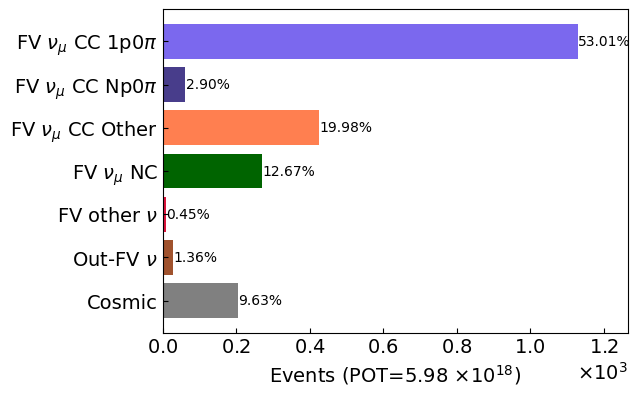

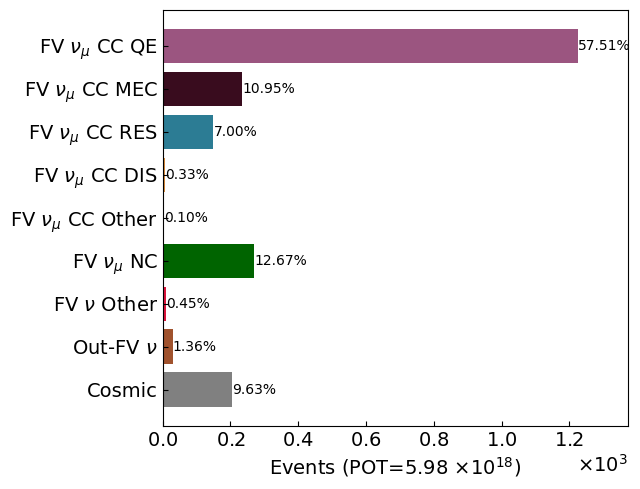

In [25]:
# both track have trackscore > 0.5
stage_key = "2prong-trackscore"
trackscore_th = 0.5
mc_mask = mc_mask & (mc_track1.pfp.trackScore > trackscore_th) & (mc_track2.pfp.trackScore > trackscore_th)
mc_evt_df_2prong = mc_evt_df[mc_mask]
data_mask = data_mask & (data_track1.pfp.trackScore > trackscore_th) & (data_track2.pfp.trackScore > trackscore_th)
data_evt_df_2prong = data_evt_df[data_mask]
intime_mask = intime_mask & (intime_track1.pfp.trackScore > trackscore_th) & (intime_track2.pfp.trackScore > trackscore_th)
intime_evt_df_2prong = intime_evt_df[intime_mask]

bar_type = "topology"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_topo = bar_plot(type=bar_type, evtdf=mc_evt_df_2prong, 
                        plot_labels=plot_labels_bar,
                        save_fig=save_fig, save_name=save_name)

bar_type = "genie"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_genie = bar_plot(type=bar_type, evtdf=mc_evt_df_2prong, 
                        plot_labels=plot_labels_bar,
                        save_fig=save_fig, save_name=save_name)

df_dict[stage_key] = mc_evt_df_2prong
df_dict_data[stage_key] = data_evt_df_2prong
df_dict_intime[stage_key] = intime_evt_df_2prong
perc_dict_topo[stage_key] = ret_topo["perc_list"]
perc_dict_genie[stage_key] = ret_genie["perc_list"]

mc_trk_df_2prong = mc_trk_df_2prong.reset_index(level=[3]).loc[mc_evt_df_2prong.index].reset_index().set_index(trk_indexnames)
data_trk_df_2prong = data_trk_df_2prong.reset_index(level=[3]).loc[data_evt_df_2prong.index].reset_index().set_index(trk_indexnames)
intime_trk_df_2prong = intime_trk_df_2prong.reset_index(level=[3]).loc[intime_evt_df_2prong.index].reset_index().set_index(trk_indexnames)

In [26]:
eps = 1e-8

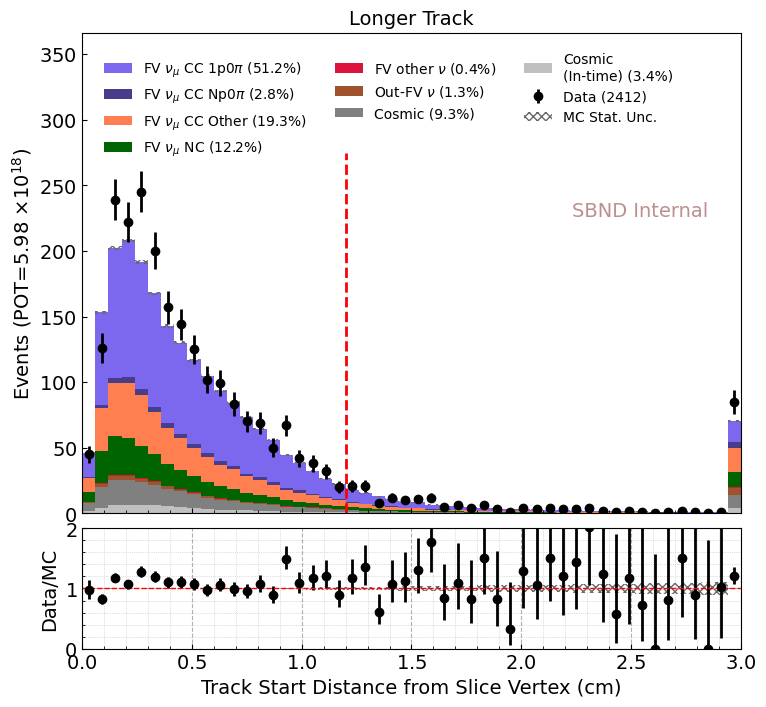

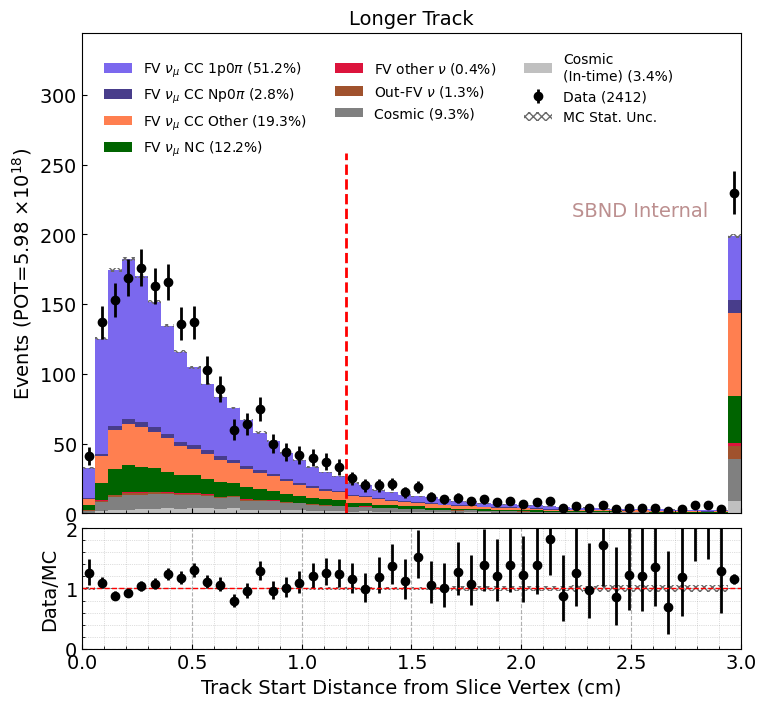

In [27]:
# ==== PID scores for tracks in 2-prong slices ====

plot_type = "topology"
bins = np.linspace(0, 3, 51)
vline = [1.2]

evtdf = mc_evt_df_2prong
vardf = mag3d(mc_evt_df_2prong.t1.pfp.trk.start, mc_evt_df_2prong.slc.vertex)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = mag3d(data_evt_df_2prong.t1.pfp.trk.start, data_evt_df_2prong.slc.vertex)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = mag3d(intime_evt_df_2prong.t1.pfp.trk.start, intime_evt_df_2prong.slc.vertex)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Track Start Distance from Slice Vertex (cm)", 
               "Events (POT={})".format(pot_str), "Longer Track"]

save_name = save_fig_dir + "/start_vertex_dist_{}_t1.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)


evtdf = mc_evt_df_2prong
vardf = mag3d(mc_evt_df_2prong.t2.pfp.trk.start, mc_evt_df_2prong.slc.vertex)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = mag3d(data_evt_df_2prong.t2.pfp.trk.start, data_evt_df_2prong.slc.vertex)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = mag3d(intime_evt_df_2prong.t2.pfp.trk.start, intime_evt_df_2prong.slc.vertex)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Track Start Distance from Slice Vertex (cm)", 
               "Events (POT={})".format(pot_str), "Longer Track"]

save_name = save_fig_dir + "/start_vertex_dist_{}_t2.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

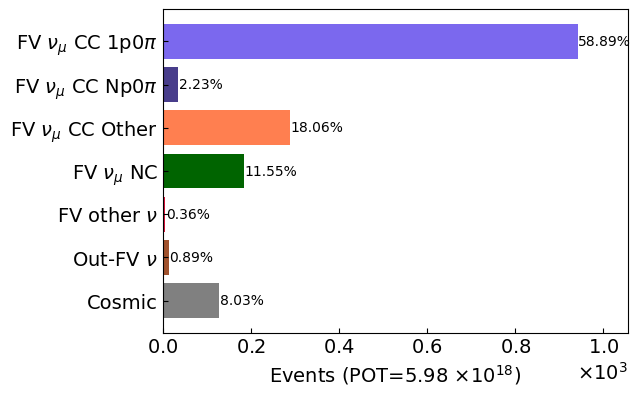

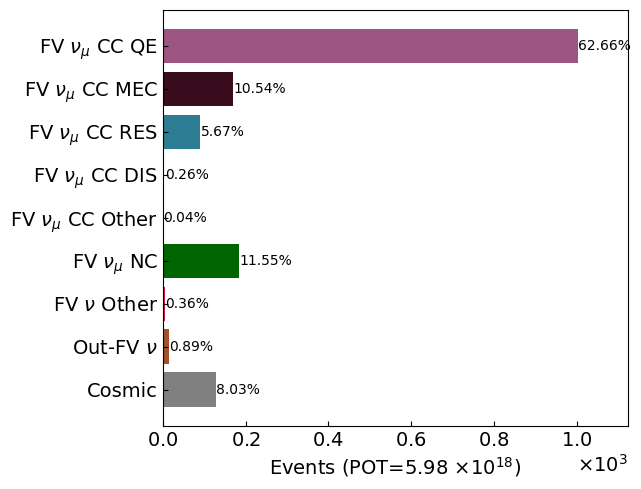

In [28]:
# both start (position - vertex) < 1 cm
stage_key = "2prong-start_vertex_dist"
dist_th = 1.2
mc_mask = mc_mask & (mag3d(mc_track1.pfp.trk.start, mc_evt_df.slc.vertex) < dist_th) & (mag3d(mc_track2.pfp.trk.start, mc_evt_df.slc.vertex) < dist_th)
mc_evt_df_2prong = mc_evt_df[mc_mask]
data_mask = data_mask & (mag3d(data_track1.pfp.trk.start, data_evt_df.slc.vertex) < dist_th) & (mag3d(data_track2.pfp.trk.start, data_evt_df.slc.vertex) < dist_th)
data_evt_df_2prong = data_evt_df[data_mask]
intime_mask = intime_mask & (mag3d(intime_track1.pfp.trk.start, intime_evt_df.slc.vertex) < dist_th) & (mag3d(intime_track2.pfp.trk.start, intime_evt_df.slc.vertex) < dist_th)
intime_evt_df_2prong = intime_evt_df[intime_mask]

bar_type = "topology"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_topo = bar_plot(type=bar_type, evtdf=mc_evt_df_2prong,
                        plot_labels=plot_labels_bar,
                        save_fig=save_fig, save_name=save_name)

bar_type = "genie"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_genie = bar_plot(type=bar_type, evtdf=mc_evt_df_2prong, 
                        plot_labels=plot_labels_bar,
                        save_fig=save_fig, save_name=save_name)

df_dict[stage_key] = mc_evt_df_2prong
df_dict_data[stage_key] = data_evt_df_2prong
df_dict_intime[stage_key] = intime_evt_df_2prong
perc_dict_topo[stage_key] = ret_topo["perc_list"]
perc_dict_genie[stage_key] = ret_genie["perc_list"]


# tracks that belong to the slices that paseed the above cuts
# mc_track dfs have the same index levels as slc dfs
mc_track1 = mc_track1.loc[mc_evt_df_2prong.index]
mc_track2 = mc_track2.loc[mc_evt_df_2prong.index]
data_track1 = data_track1.loc[data_evt_df_2prong.index]
data_track2 = data_track2.loc[data_evt_df_2prong.index]
intime_track1 = intime_track1.loc[intime_evt_df_2prong.index]
intime_track2 = intime_track2.loc[intime_evt_df_2prong.index]

# PID
- cut on track length & chi2 scores
- (MCS fwd P - MCS bwd P)
- quality cut on (range P - MCS P)
- TODO: number of daughter particles?

In [29]:
# compbine longer & shorter tracks into one df
trk_indexnames = list(mc_track1.index.names) + [("pfp", "tindex", "", "", "", "", "")]
mc_trk_df_2prong = pd.concat([mc_track1.reset_index().set_index(trk_indexnames),
                              mc_track2.reset_index().set_index(trk_indexnames)])
data_trk_df_2prong = pd.concat([data_track1.reset_index().set_index(trk_indexnames),
                              data_track2.reset_index().set_index(trk_indexnames)])
intime_trk_df_2prong = pd.concat([intime_track1.reset_index().set_index(trk_indexnames),
                              intime_track2.reset_index().set_index(trk_indexnames)])

## Selection

In [30]:
def avg_chi2(df, var_name, new=False):
    planes = ['I0', 'I1', 'I2']
    chi2_vals = []
    if new:
        var_name = var_name + "_new"
    for plane in planes:
        chi2 = df['pfp']['trk']['chi2pid'][plane][var_name]
        chi2_vals.append(chi2)
    chi2_df = pd.concat(chi2_vals, axis=1)
    # fill 0 with nan
    chi2_df = chi2_df.replace(0, np.nan)
    avg = chi2_df.mean(axis=1, skipna=True)
    return avg

### data vs. MC

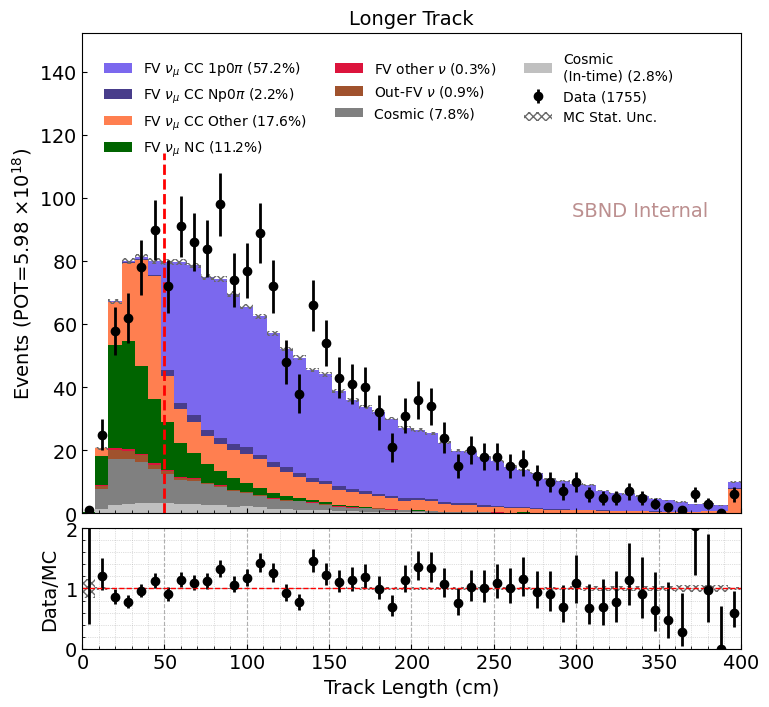

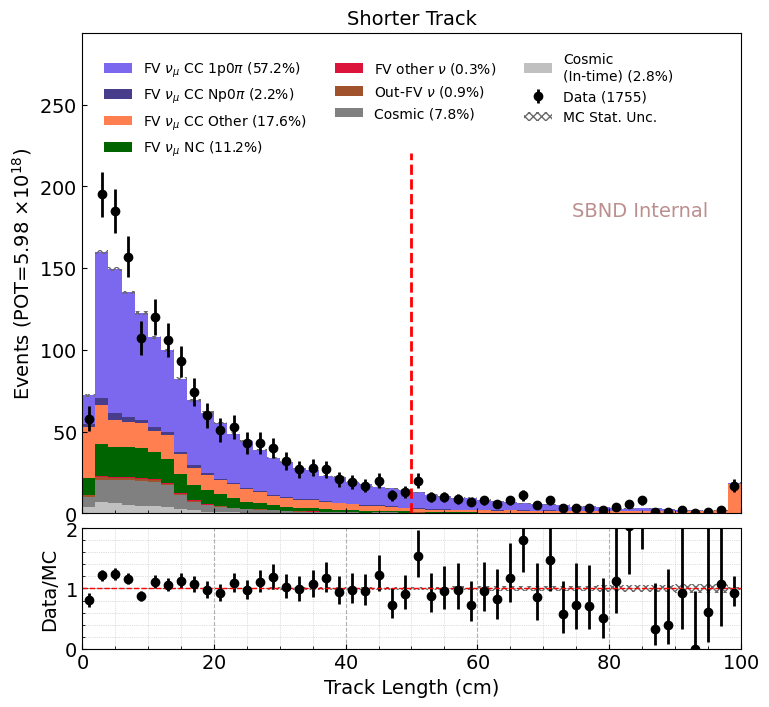

In [31]:
plot_type = "topology"
bins = np.linspace(0., 400, 51)
vline = [50]
evtdf = mc_evt_df_2prong

vardf = mc_evt_df_2prong.t1.pfp.trk.len
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = data_evt_df_2prong.t1.pfp.trk.len
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = intime_evt_df_2prong.t1.pfp.trk.len
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Track Length (cm)", 
               "Events (POT={})".format(pot_str), "Longer Track"]

save_name = save_fig_dir + "/length_{}_t1.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)


bins = np.linspace(0., 100, 51)
vardf = mc_evt_df_2prong.t2.pfp.trk.len
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = data_evt_df_2prong.t2.pfp.trk.len
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = intime_evt_df_2prong.t2.pfp.trk.len
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Track Length (cm)", 
               "Events (POT={})".format(pot_str), "Shorter Track"]

save_name = save_fig_dir + "/length_{}_t2.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

In [32]:
def hist_plot_pdg_breakdown(
              trkdf, vardf, 
              vardf_data, 
              bins,
              plot_labels=["", "", ""],
              ratio = True,
              vline = None,
              save_fig=False, save_name=None): 

    assert len(trkdf) == len(vardf)

    tot_mc_count = len(trkdf)
    tot_data_count = len(vardf_data)

    labels = ["Muon", "Pion", "Proton", "Electron", "Photon", "Other"]
    colors = ["blue", "green", "red", "purple", "orange", "gray"]

    cut_muon = (np.abs(trkdf.pfp.trk.truth.p.pdg) == 13)
    cut_pion = (np.abs(trkdf.pfp.trk.truth.p.pdg) == 211)
    cut_proton = (np.abs(trkdf.pfp.trk.truth.p.pdg) == 2212)
    cut_electron = (np.abs(trkdf.pfp.trk.truth.p.pdg) == 11)
    cut_photon = (np.abs(trkdf.pfp.trk.truth.p.pdg) == 22)
    cut_other = ~cut_muon & ~cut_pion & ~cut_proton & ~cut_electron & ~cut_photon

    cuts = [cut_muon, cut_pion, cut_proton, cut_electron, cut_photon, cut_other]

    # --- Plot template
    if ratio:
        fig, axs = plt.subplots(2, 1, figsize=(8.5, 8), 
                               sharex=True, gridspec_kw={'height_ratios': [4, 1]})
        fig.subplots_adjust(hspace=0.05)
        ax = axs[0]
        ax_r = axs[1]
    else:
        fig, ax = plt.subplots()

    bin_centers = 0.5 * (bins[:-1] + bins[1:])

    # --- Data
    total_data, bins = np.histogram(vardf_data, bins=bins)
    data_err = np.sqrt(total_data)
    ax.errorbar(bin_centers, total_data, yerr=data_err, 
                fmt='o', color='black')  # error bars

    # --- MC
    # collect all MC + intime
    var_categ = [vardf[i] for i in cuts]
    scale_mc = trkdf.pot_weight.unique()[0]
    # TODO:
    weights_categ = [scale_mc*np.ones_like(vardf[i]) for i in cuts] 
    colors = colors
    labels = labels

    mc_stack, _, _ = ax.hist(var_categ,
                                bins=bins,
                                weights=weights_categ,
                                stacked=True,
                                color=colors,
                                label=labels,
                                edgecolor='none',
                                linewidth=0,
                                density=False,
                                histtype='stepfilled')


    # ---- MC stat err
    each_mc_hist_data = []
    each_mc_hist_err2 = []  # sum of squared weights for error

    for data, w in zip(var_categ, weights_categ):
        hist_vals, _ = np.histogram(data, bins=bins, weights=w)
        hist_err2, _ = np.histogram(data, bins=bins, weights=np.square(w))
        each_mc_hist_data.append(hist_vals)
        each_mc_hist_err2.append(hist_err2)

    total_mc = np.sum(each_mc_hist_data, axis=0)
    total_mc_err2 = np.sum(each_mc_hist_err2, axis=0)
    mc_stat_err = np.sqrt(total_mc_err2)

    ax.bar(
       bin_centers,
        2 * mc_stat_err,
        width=np.diff(bins),
        bottom=total_mc - mc_stat_err,
        facecolor='none',             # transparent fill
        edgecolor='dimgray',            # outline color of the hatching
        hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
        linewidth=0.0,
        label='MC Stat. Unc. ({})'.format(tot_mc_count)
    )


    ax.set_xlim(bins[0], bins[-1])
    if ratio == False: # only plot xlabel if we're not plotting the ratio panel
        ax_r.set_xlabel(plot_labels[0])
    ax.set_ylabel(plot_labels[1])
    ax.set_title(plot_labels[2])

    if ratio:
        # MC stat err
        mc_stat_err_ratio = mc_stat_err / total_mc
        mc_content_ratio = total_mc / total_mc
        mc_stat_err_ratio = np.nan_to_num(mc_stat_err_ratio, nan=0.)
        mc_content_ratio = np.nan_to_num(mc_content_ratio, nan=-999.)
        ax_r.bar(
            bin_centers,
            2*mc_stat_err_ratio,
            width=np.diff(bins),
            bottom=mc_content_ratio - mc_stat_err_ratio,
            facecolor='none',             # transparent fill
            edgecolor='dimgray',          # outline color of the hatching
            hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
            linewidth=0.0,
            label='MC Stat. Unc.'
        )

        # data/MC ratio err
        data_eylow, data_eyhigh = return_data_stat_err(total_data)

        data_ratio = total_data / total_mc
        data_ratio_eylow = data_eylow / total_mc
        data_ratio_eyhigh = data_eyhigh / total_mc
        data_ratio = np.nan_to_num(data_ratio, nan=-999.)
        data_ratio_eylow = np.nan_to_num(data_ratio_eylow, nan=0.)
        data_ratio_eyhigh = np.nan_to_num(data_ratio_eyhigh, nan=0.)
        
        #data_ratio_errors = data_ratio_eylow + data_ratio_eyhigh
        #ax_ratio.errorbar(bin_centers, data_ratio, yerr=data_ratio_errors,
        #                 fmt='o', color='black', label='Data',
        #                 markersize=5, capsize=3, linewidth=1.5)

        ax_r.errorbar(bin_centers, data_ratio,
                  yerr=np.vstack((data_ratio_eylow, data_ratio_eyhigh)),
                  fmt='o', color='black')
                #   , label='Data')
                #   markersize=5, capsize=3, linewidth=1.5)
        
        # if highest value is greater than 2.0, set ylim to 2.0
        ax_r.axhline(1.0, color='red', linestyle='--', linewidth=1)
        
        ax_r.grid(True)
        ax_r.minorticks_on()
        ax_r.grid(which='minor', linestyle=':', linewidth=0.5, color='gray', alpha=0.5)

        ax_r.set_xlabel(plot_labels[0])
        ax_r.set_ylabel("Data/MC")

        if np.max(data_ratio + data_ratio_eyhigh) > 2.0:
            ax_r.set_ylim(0., 2.0)

    # --- Legend
    accum_sum = [np.sum(data) for data in mc_stack]
    accum_sum = [0.] + accum_sum
    total_sum = accum_sum[-1]
    individual_sums = [accum_sum[i + 1] - accum_sum[i] for i in range(len(accum_sum) - 1)]
    fractions = [(count / total_sum) * 100 for count in individual_sums]
    legend_labels = [f"{label} ({frac:.1f}%)" for label, frac in zip(labels[::-1], fractions[::-1])]
    legend_labels += ["Data ({})".format(tot_data_count), "MC Stat. Unc. ({})".format(tot_mc_count)]
    leg = ax.legend(legend_labels, 
                    loc='upper left', 
                    fontsize=10, 
                    frameon=False, 
                    ncol=3, 
                    bbox_to_anchor=(0.015, 0.985))
    leg_height = leg.get_bbox_to_anchor().height
    max_data_with_err = np.max(total_data + data_eyhigh)
    # ax.set_ylim(0., 1.05 * max_data_with_err + leg_height)
    ax.set_ylim(0., 1.4 * max_data_with_err)

    if vline is not None:
        # Draw a vertical line from y=0 up to the max value of the histogram
        for v in vline:
            ymax = ax.get_ylim()[1]
            ax.vlines(x=v, ymin=0, ymax=ymax*0.75, color='red', linestyle='--')

    # --- "SBND Preliminary" textbox
    # decide if the distribution is tilted to the right or left
    n_firsthalf = np.sum(total_data[:len(bins)//2])
    n_secondhalf = np.sum(total_data[len(bins)//2:])
    if n_firsthalf > n_secondhalf:
        textloc_x = 0.95
        textloc_ha = 'right'
    else:
        textloc_x = 0.05
        textloc_ha = 'left'

    ax.text(textloc_x, 0.65, "SBND Internal", 
            transform=ax.transAxes, 
            fontsize=12, 
            # fontweight='bold', 
            color='rosybrown',
            ha=textloc_ha, 
            va='top')


    if save_fig:
        plt.savefig(save_name, bbox_inches='tight', dpi=300)
    plt.show()

    # bolder figure lines?
    # ax.tick_params(width=2, length=10)
    # for spine in ax.spines.values():
    #     spine.set_linewidth(2)
    
    ret_dict = {"cuts": cuts}
    return ret_dict

In [33]:
mc_trk_df_2prong["pot_weight"] = mc_pot_scale * np.ones(len(mc_trk_df_2prong))

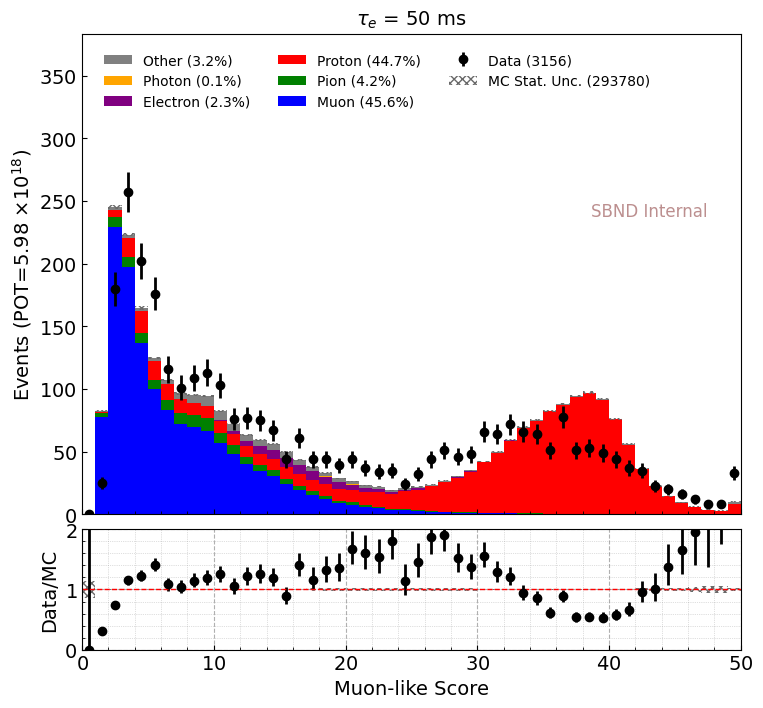

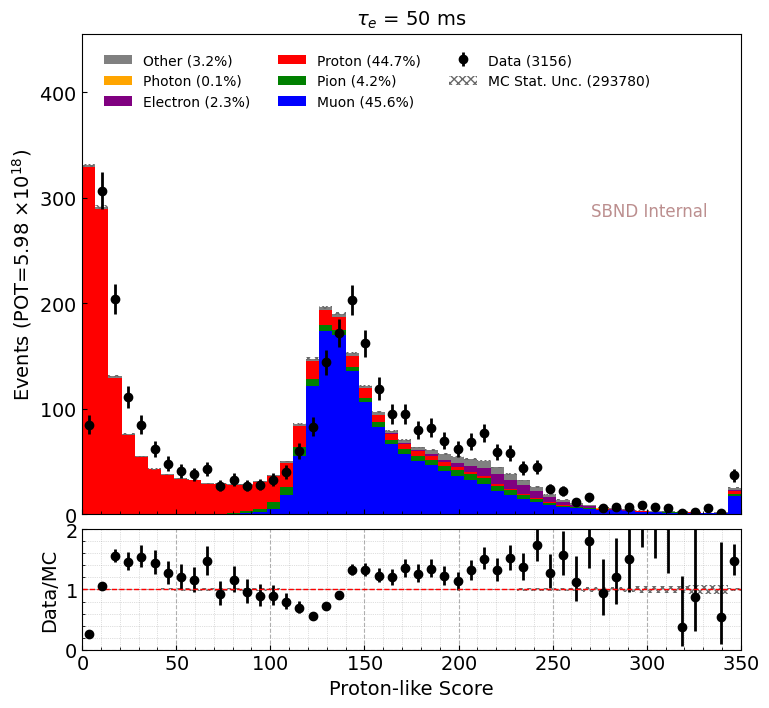

In [34]:
bins = np.linspace(0, 50, 51)
vline = []

trkdf = pd.concat([mc_trk_df_2prong, intime_trk_df_2prong])
trkdf = trkdf[trkdf.pfp.trk.len > 5]
vardf = avg_chi2(trkdf, "chi2_muon")
# vardf = trkdf.pfp.trk.chi2pid.I2.chi2_muon
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
trkdf_data = data_trk_df_2prong[data_trk_df_2prong.pfp.trk.len > 5]
vardf_data = avg_chi2(trkdf_data, "chi2_muon", new=True)
# vardf_data = data_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_muon
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
plot_labels = ["Muon-like Score", 
               "Events (POT={})".format(pot_str), r"$\tau_e$ = 50 ms"]

save_name = save_fig_dir + "/chi2muon_{}_pdg.png".format(plot_type)
ret_hist_topo = hist_plot_pdg_breakdown(
                          trkdf, vardf, 
                          vardf_data,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)
  

bins = np.linspace(0, 350, 51)
vline = []
vardf = avg_chi2(trkdf, "chi2_proton")
# vardf = trkdf.pfp.trk.chi2pid.I2.chi2_proton
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(trkdf_data, "chi2_proton")
# vardf_data = data_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_proton
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
plot_labels = ["Proton-like Score", 
               "Events (POT={})".format(pot_str), r"$\tau_e$ = 50 ms"]

save_name = save_fig_dir + "/chi2proton_{}_pdg.png".format(plot_type)
ret_hist_topo = hist_plot_pdg_breakdown(
                          trkdf, vardf, 
                          vardf_data,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)
  

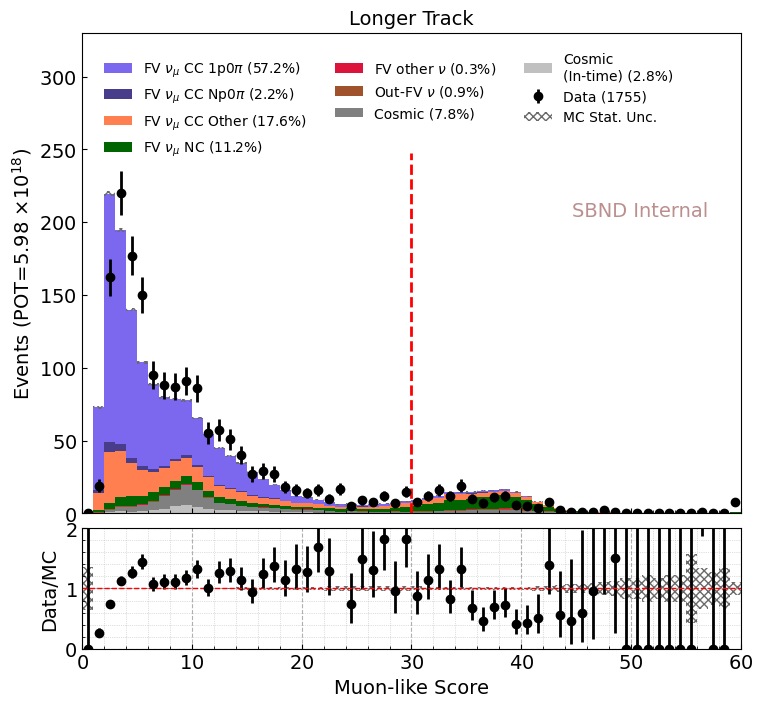

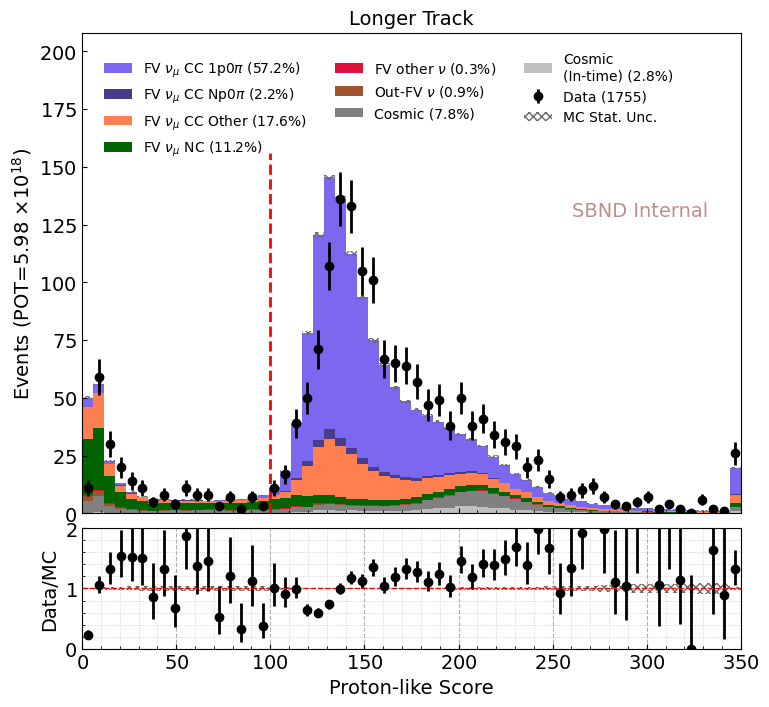

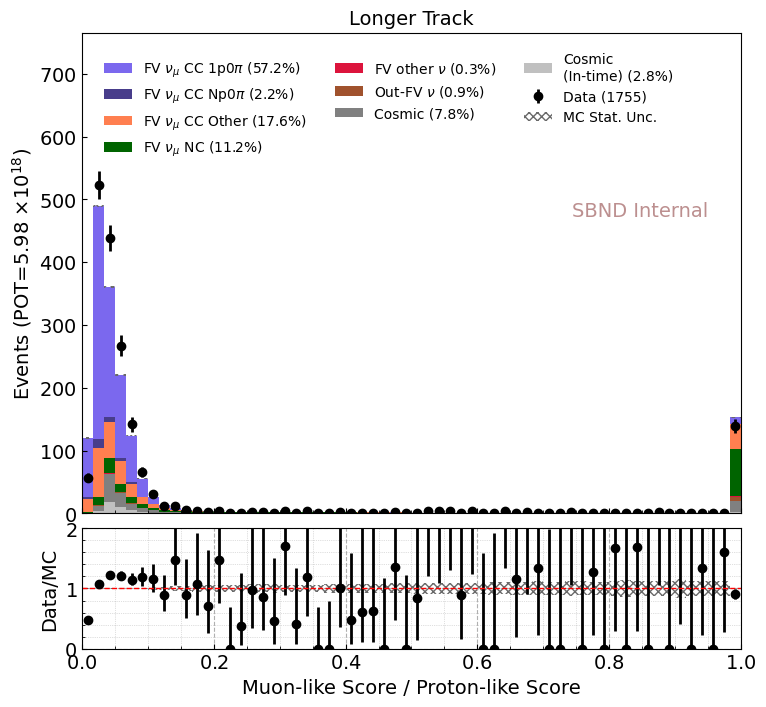

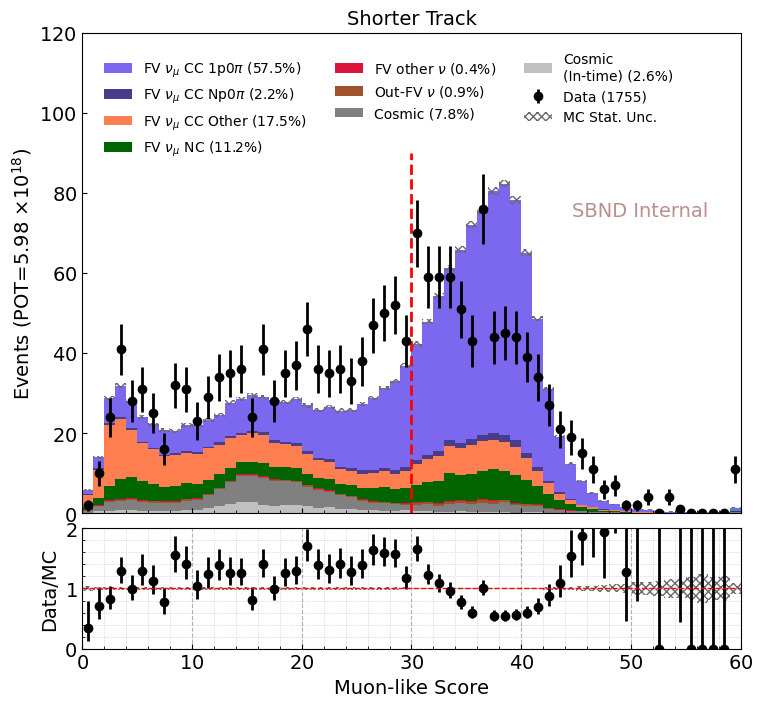

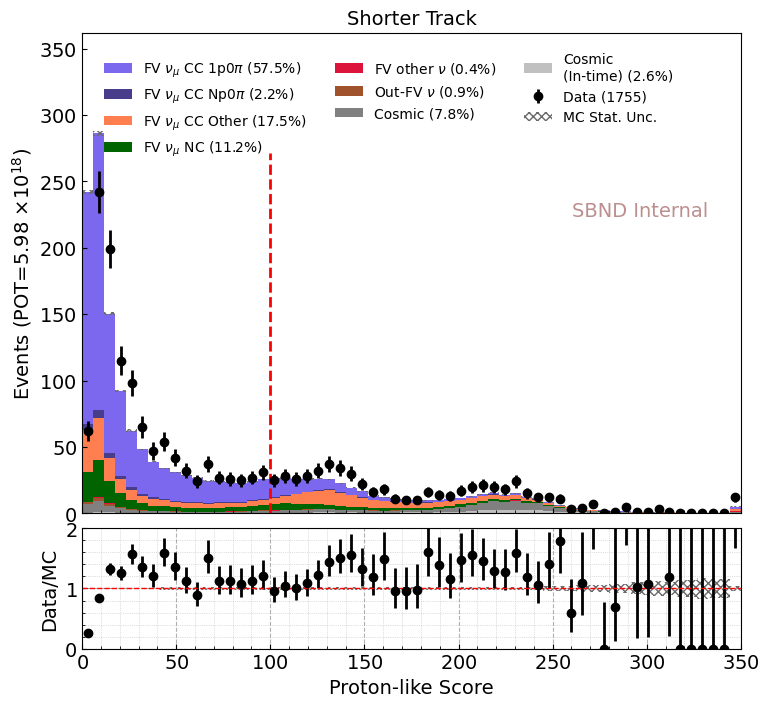

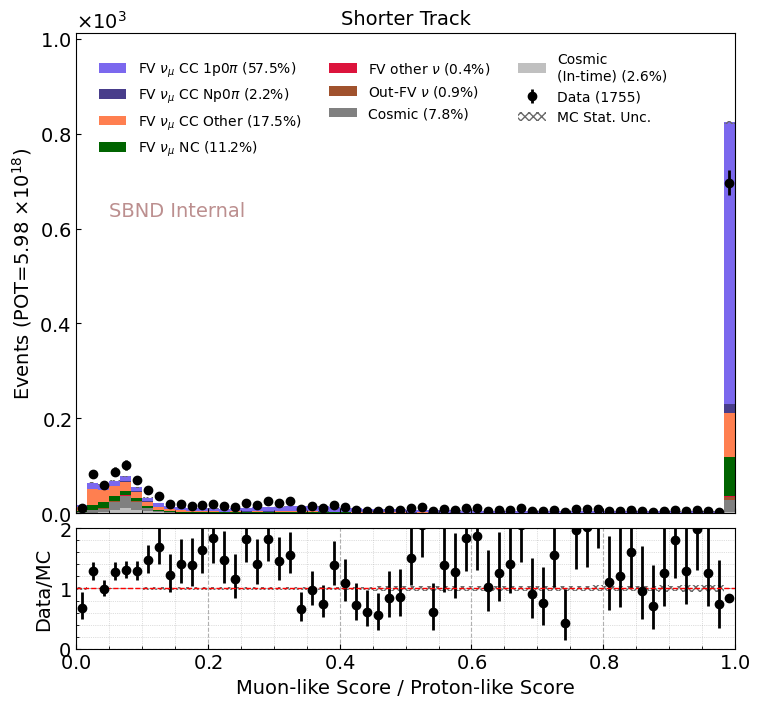

In [95]:
# mu_chi2mu_th = 35
# mu_chi2p_th = 100
# mu_len_th = 50
# mc_mu_cut = mc_mu_cut & (mc_chimu_avg / mc_chipi_avg < 1) 
# mc_mu_cut = mc_mu_cut & (np.abs((mc_trk_df_2prong.pfp.trk.rangeP.p_muon - mc_trk_df_2prong.pfp.trk.mcsP.fwdP_muon) / mc_trk_df_2prong.pfp.trk.rangeP.p_muon) < qual_th)
# ==== PID scores for tracks in 2-prong slices, after contained track requirement ====

# --- shorter track ---
plot_type = "topology"
bins = np.linspace(0, 60, 61)
vline = [30]
evtdf = mc_evt_df_2prong
vardf = avg_chi2(mc_evt_df_2prong.t1, "chi2_muon")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(data_evt_df_2prong.t1, "chi2_muon", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = avg_chi2(intime_evt_df_2prong.t1, "chi2_muon")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Muon-like Score", 
               "Events (POT={})".format(pot_str), "Longer Track"]

save_name = save_fig_dir + "/chi2muon_{}_t1.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)
plot_type = "topology"
bins = np.linspace(0, 350, 61)
vline = [100]
evtdf = mc_evt_df_2prong
vardf = avg_chi2(mc_evt_df_2prong.t1, "chi2_proton")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(data_evt_df_2prong.t1, "chi2_proton", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = avg_chi2(intime_evt_df_2prong.t1, "chi2_proton")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Proton-like Score", 
               "Events (POT={})".format(pot_str), r"Longer Track"]

save_name = save_fig_dir + "/chi2proton_{}_t1.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

lot_type = "topology"
bins = np.linspace(0, 1, 61)
vline = []
evtdf = mc_evt_df_2prong
vardf = avg_chi2(mc_evt_df_2prong.t1, "chi2_muon") / avg_chi2(mc_evt_df_2prong.t1, "chi2_proton")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(data_evt_df_2prong.t1, "chi2_muon", new=True) / avg_chi2(data_evt_df_2prong.t1, "chi2_proton", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = avg_chi2(intime_evt_df_2prong.t1, "chi2_muon") / avg_chi2(intime_evt_df_2prong.t1, "chi2_proton")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Muon-like Score / Proton-like Score", 
               "Events (POT={})".format(pot_str), "Longer Track"]

save_name = save_fig_dir + "/chi2muon_proton_{}_t1.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)



# --- shorter track ---
plot_type = "topology"
bins = np.linspace(0, 60, 61)
vline = [30]
evtdf = mc_evt_df_2prong
vardf = avg_chi2(mc_evt_df_2prong.t2, "chi2_muon")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(data_evt_df_2prong.t2, "chi2_muon", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = avg_chi2(intime_evt_df_2prong.t2, "chi2_muon")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Muon-like Score", 
               "Events (POT={})".format(pot_str), "Shorter Track"]

save_name = save_fig_dir + "/chi2muon_{}_t2.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

plot_type = "topology"
bins = np.linspace(0, 350, 61)
vline = [100]
evtdf = mc_evt_df_2prong
vardf = avg_chi2(mc_evt_df_2prong.t2, "chi2_proton")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(data_evt_df_2prong.t2, "chi2_proton", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = avg_chi2(intime_evt_df_2prong.t2, "chi2_proton")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Proton-like Score", 
               "Events (POT={})".format(pot_str), "Shorter Track"]

save_name = save_fig_dir + "/chi2proton_{}_t2.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

plot_type = "topology"
bins = np.linspace(0, 1, 61)
vline = []
evtdf = mc_evt_df_2prong
vardf = avg_chi2(mc_evt_df_2prong.t2, "chi2_muon") / avg_chi2(mc_evt_df_2prong.t2, "chi2_proton")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(data_evt_df_2prong.t2, "chi2_muon", new=True) / avg_chi2(data_evt_df_2prong.t2, "chi2_proton", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = avg_chi2(intime_evt_df_2prong.t2, "chi2_muon") / avg_chi2(intime_evt_df_2prong.t2, "chi2_proton")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Muon-like Score / Proton-like Score", 
               "Events (POT={})".format(pot_str), "Shorter Track"]

save_name = save_fig_dir + "/chi2muon_proton_{}_t2.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)


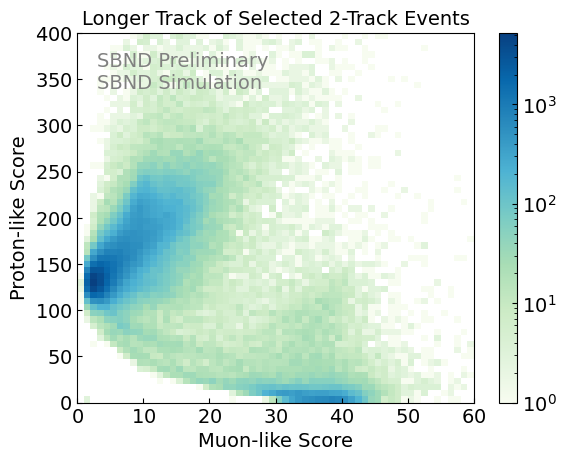

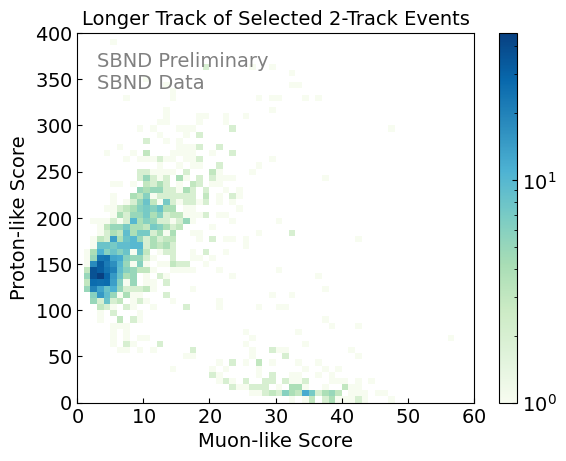

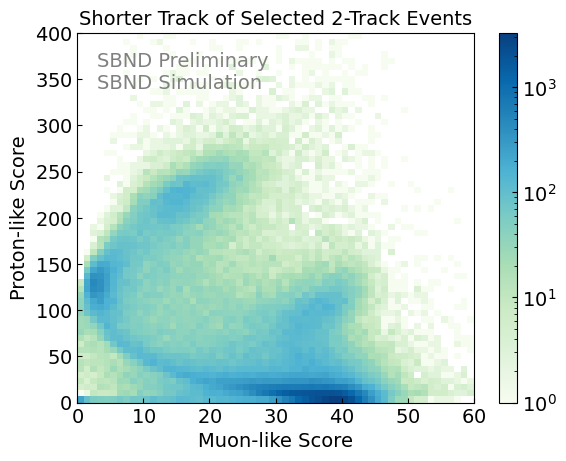

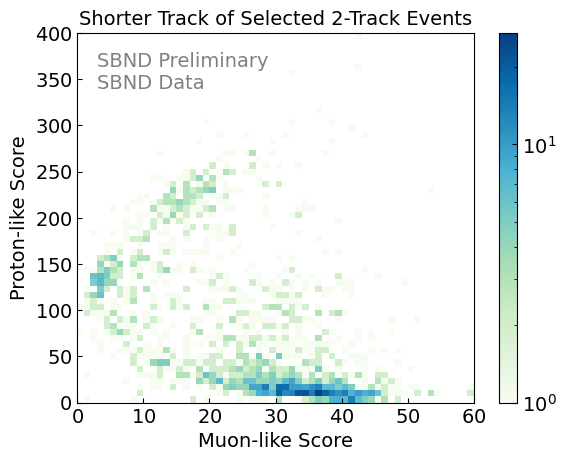

In [36]:
bins = [np.linspace(0,60,61), np.linspace(0,400,61)]

plt.hist2d(avg_chi2(mc_evt_df_2prong.t1, "chi2_muon"), 
           avg_chi2(mc_evt_df_2prong.t1, "chi2_proton"), 
           bins=bins, 
           cmap="GnBu", norm=LogNorm())
plt.colorbar()
plt.xlabel("Muon-like Score")
plt.ylabel("Proton-like Score")
plt.title("Longer Track of Selected 2-Track Events")
plt.text(0.05, 0.95, "SBND Preliminary\nSBND Simulation", transform=plt.gca().transAxes, fontsize=14, color='gray', ha='left', va='top')
if save_fig:
    save_name = save_fig_dir + "/chi2muon_vs_chi2proton_mc_t1.png"
    plt.savefig(save_name, bbox_inches="tight")
plt.show()

plt.hist2d(avg_chi2(data_evt_df_2prong.t1, "chi2_muon", new=True), 
           avg_chi2(data_evt_df_2prong.t1, "chi2_proton", new=True), 
           bins=bins, 
           cmap="GnBu", norm=LogNorm())
plt.colorbar()
plt.xlabel("Muon-like Score")
plt.ylabel("Proton-like Score")
plt.title("Longer Track of Selected 2-Track Events")
plt.text(0.05, 0.95, "SBND Preliminary\nSBND Data", transform=plt.gca().transAxes, fontsize=14, color='gray', ha='left', va='top')
if save_fig:
    save_name = save_fig_dir + "/chi2muon_vs_chi2proton_data_t1.png"
    plt.savefig(save_name, bbox_inches="tight")
plt.show()

plt.hist2d(avg_chi2(mc_evt_df_2prong.t2, "chi2_muon"), 
           avg_chi2(mc_evt_df_2prong.t2, "chi2_proton"), 
           bins=bins, 
           cmap="GnBu", norm=LogNorm())
plt.colorbar()
plt.xlabel("Muon-like Score")
plt.ylabel("Proton-like Score")
plt.title("Shorter Track of Selected 2-Track Events")
plt.text(0.05, 0.95, "SBND Preliminary\nSBND Simulation", transform=plt.gca().transAxes, fontsize=14, color='gray', ha='left', va='top')
if save_fig:
    save_name = save_fig_dir + "/chi2muon_vs_chi2proton_mc_t2.png"
    plt.savefig(save_name, bbox_inches="tight")
plt.show()

plt.hist2d(avg_chi2(data_evt_df_2prong.t2, "chi2_muon", new=True), 
           avg_chi2(data_evt_df_2prong.t2, "chi2_proton", new=True), 
           bins=bins, 
           cmap="GnBu", norm=LogNorm())
plt.colorbar()
plt.xlabel("Muon-like Score")
plt.ylabel("Proton-like Score")
plt.title("Shorter Track of Selected 2-Track Events")
plt.text(0.05, 0.95, "SBND Preliminary\nSBND Data", transform=plt.gca().transAxes, fontsize=14, color='gray', ha='left', va='top')
if save_fig:
    save_name = save_fig_dir + "/chi2muon_vs_chi2proton_data_t2.png"
    plt.savefig(save_name, bbox_inches="tight")
plt.show()

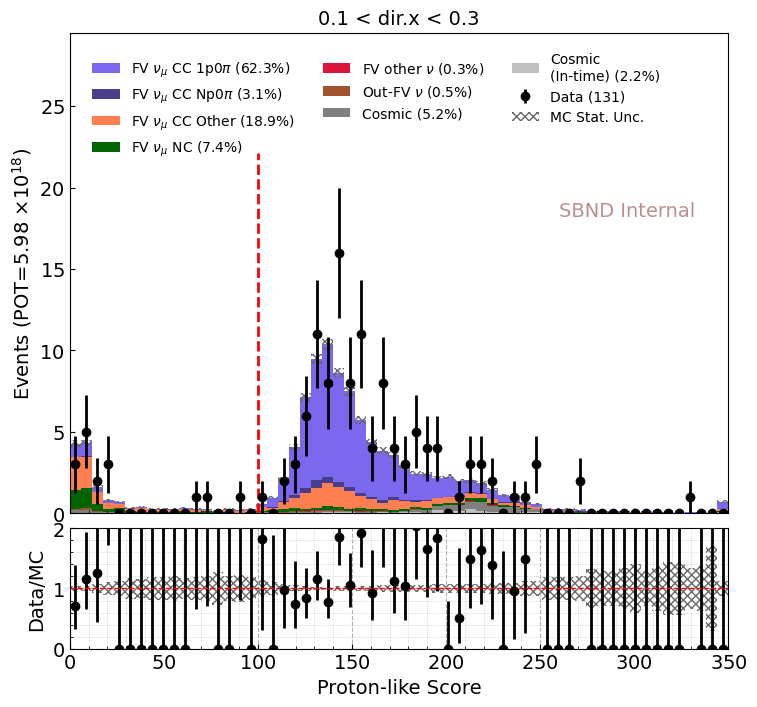

In [37]:
plot_type = "topology"
bins = np.linspace(0, 350, 61)
vline = [100]
mc_df = mc_evt_df_2prong[(mc_evt_df_2prong.t1.pfp.trk.dir.x > 0.1) & (mc_evt_df_2prong.t1.pfp.trk.dir.x < 0.3) & (mc_evt_df_2prong.t1.pfp.trk.len > 50)]
evtdf = mc_df
vardf = avg_chi2(evtdf.t1, "chi2_proton")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
data_df = data_evt_df_2prong[(data_evt_df_2prong.t1.pfp.trk.dir.x > 0.1) & (data_evt_df_2prong.t1.pfp.trk.dir.x < 0.3) & (data_evt_df_2prong.t1.pfp.trk.len > 50)]
vardf_data = avg_chi2(data_df.t1, "chi2_proton", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
intime_df = intime_evt_df_2prong[(intime_evt_df_2prong.t1.pfp.trk.dir.x > 0.1) & (intime_evt_df_2prong.t1.pfp.trk.dir.x < 0.3) & (intime_evt_df_2prong.t1.pfp.trk.len > 50)]
vardf_intime = avg_chi2(intime_df.t1, "chi2_proton")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Proton-like Score", 
               "Events (POT={})".format(pot_str), "0.1 < dir.x < 0.3"]

save_name = save_fig_dir + "/chi2proton_{}_t1_dirx_cut.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

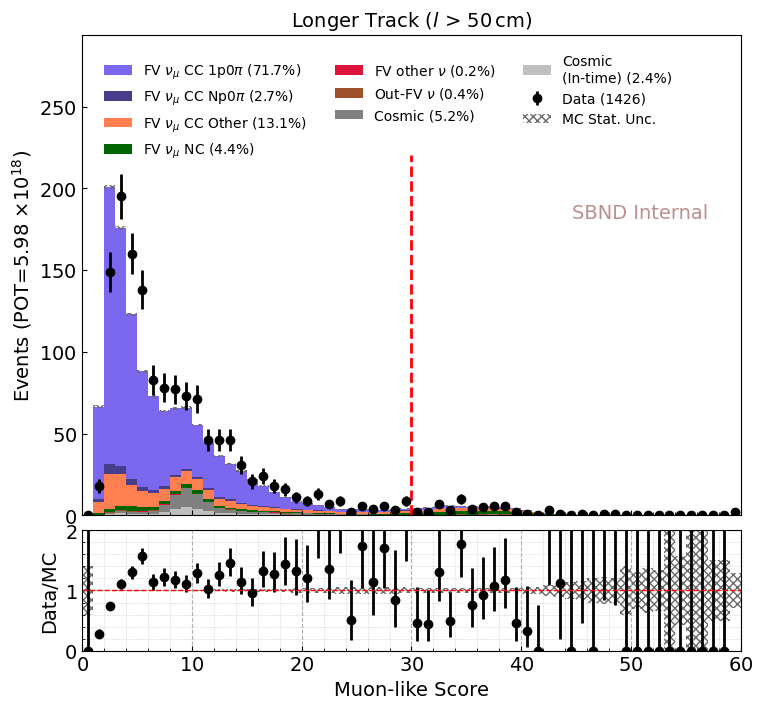

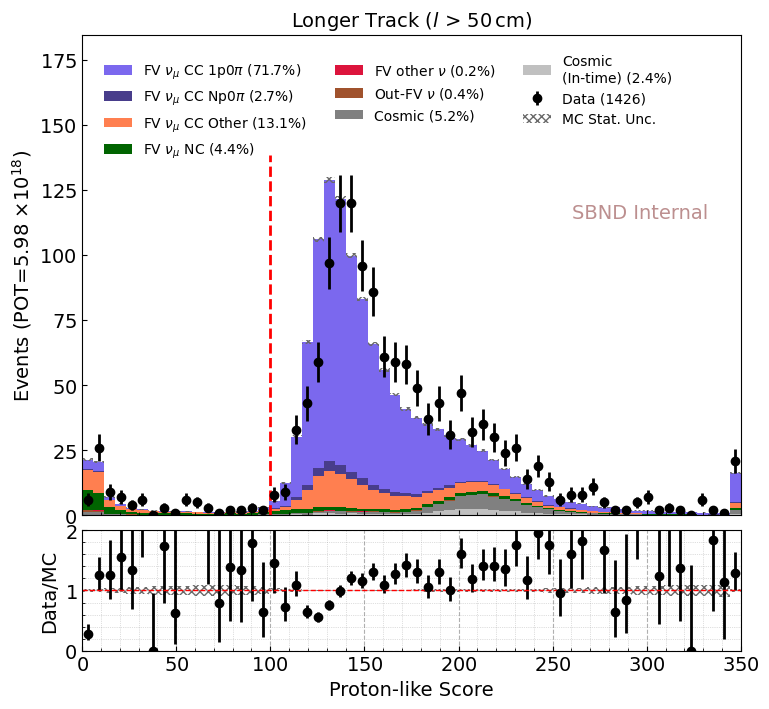

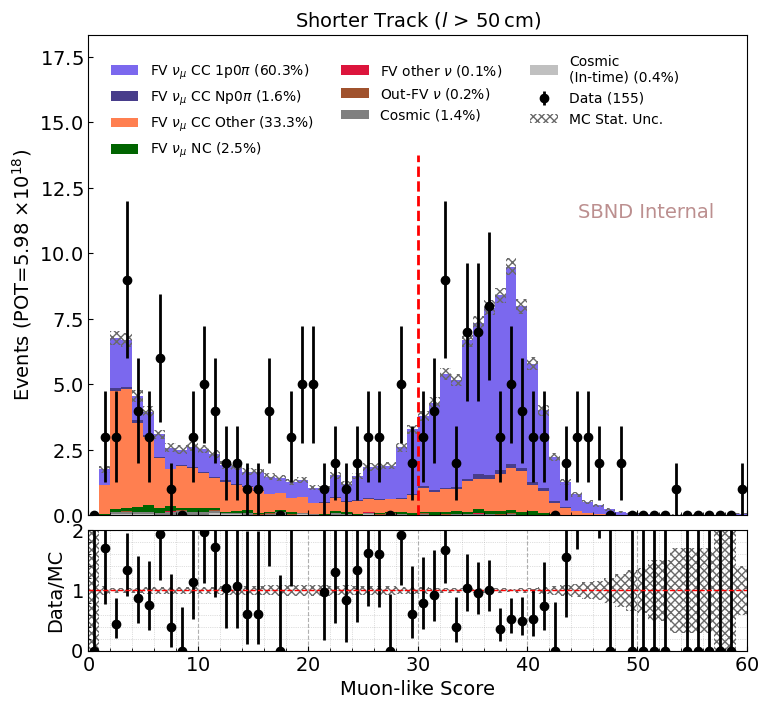

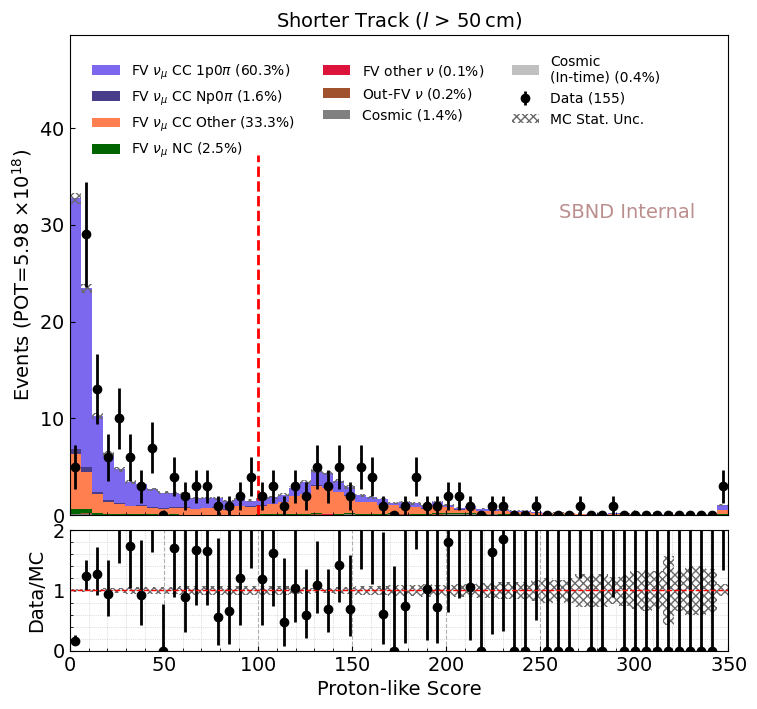

In [38]:
# mu_chi2mu_th = 35
# mu_chi2p_th = 100
# mu_len_th = 50
# mc_mu_cut = mc_mu_cut & (mc_chimu_avg / mc_chipi_avg < 1) 
# mc_mu_cut = mc_mu_cut & (np.abs((mc_trk_df_2prong.pfp.trk.rangeP.p_muon - mc_trk_df_2prong.pfp.trk.mcsP.fwdP_muon) / mc_trk_df_2prong.pfp.trk.rangeP.p_muon) < qual_th)
# ==== PID scores for tracks in 2-prong slices, after contained track requirement ====

# --- shorter track ---
plot_type = "topology"
bins = np.linspace(0, 60, 61)
vline = [30]
evtdf = mc_evt_df_2prong[mc_evt_df_2prong.t1.pfp.trk.len > 50]
vardf = avg_chi2(mc_evt_df_2prong[mc_evt_df_2prong.t1.pfp.trk.len > 50].t1, "chi2_muon")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(data_evt_df_2prong[data_evt_df_2prong.t1.pfp.trk.len > 50].t1, "chi2_muon", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = avg_chi2(intime_evt_df_2prong[intime_evt_df_2prong.t1.pfp.trk.len > 50].t1, "chi2_muon")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Muon-like Score", 
               "Events (POT={})".format(pot_str), r"Longer Track ($l$ > 50$\,$cm)"]

save_name = save_fig_dir + "/chi2muon_{}_t1_l50.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)
plot_type = "topology"
bins = np.linspace(0, 350, 61)
vline = [100]
evtdf = mc_evt_df_2prong[mc_evt_df_2prong.t1.pfp.trk.len > 50]
vardf = avg_chi2(mc_evt_df_2prong[mc_evt_df_2prong.t1.pfp.trk.len > 50].t1, "chi2_proton")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(data_evt_df_2prong[data_evt_df_2prong.t1.pfp.trk.len > 50].t1, "chi2_proton", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = avg_chi2(intime_evt_df_2prong[intime_evt_df_2prong.t1.pfp.trk.len > 50].t1, "chi2_proton")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Proton-like Score", 
               "Events (POT={})".format(pot_str), r"Longer Track ($l$ > 50$\,$cm)"]

save_name = save_fig_dir + "/chi2proton_{}_t1_l50.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)


# --- shorter track ---
plot_type = "topology"
bins = np.linspace(0, 60, 61)
vline = [30]
evtdf = mc_evt_df_2prong[mc_evt_df_2prong.t2.pfp.trk.len > 50]
vardf = avg_chi2(mc_evt_df_2prong[mc_evt_df_2prong.t2.pfp.trk.len > 50].t2, "chi2_muon")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(data_evt_df_2prong[data_evt_df_2prong.t2.pfp.trk.len > 50].t2, "chi2_muon", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = avg_chi2(intime_evt_df_2prong[intime_evt_df_2prong.t2.pfp.trk.len > 50].t2, "chi2_muon")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Muon-like Score", 
               "Events (POT={})".format(pot_str), r"Shorter Track ($l$ > 50$\,$cm)"]

save_name = save_fig_dir + "/chi2muon_{}_t2_l50.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

plot_type = "topology"
bins = np.linspace(0, 350, 61)
vline = [100]
evtdf = mc_evt_df_2prong[mc_evt_df_2prong.t2.pfp.trk.len > 50]
vardf = avg_chi2(mc_evt_df_2prong[mc_evt_df_2prong.t2.pfp.trk.len > 50].t2, "chi2_proton")
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = avg_chi2(data_evt_df_2prong[data_evt_df_2prong.t2.pfp.trk.len > 50].t2, "chi2_proton", new=True)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = avg_chi2(intime_evt_df_2prong[intime_evt_df_2prong.t2.pfp.trk.len > 50].t2, "chi2_proton")
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Proton-like Score", 
               "Events (POT={})".format(pot_str), r"Shorter Track ($l$ > 50$\,$cm)"]

save_name = save_fig_dir + "/chi2proton_{}_t2_l50.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)


In [39]:
# # mc_mu_cut = mc_mu_cut & (mc_chimu_avg / mc_chipi_avg < 1) 
# # mc_mu_cut = mc_mu_cut & (mc_trk_df_2prong.pfp.trk.len > 50)
# # mc_mu_cut = mc_mu_cut & (np.abs((mc_trk_df_2prong.pfp.trk.rangeP.p_muon - mc_trk_df_2prong.pfp.trk.mcsP.fwdP_muon) / mc_trk_df_2prong.pfp.trk.rangeP.p_muon) < qual_th)

# # --- shorter track ---
# plot_type = "topology"
# bins = np.linspace(0.3, 1.3, 61)
# vline = [1]
# evtdf = mc_evt_df_2prong

# vardf = avg_chi2(mc_evt_df_2prong.t1, "chi2_muon") / avg_chi2(mc_evt_df_2prong.t1, "chi2_pion")
# vardf = np.clip(vardf, bins[0], bins[-1] - eps)
# vardf_data = avg_chi2(data_evt_df_2prong.t1, "chi2_muon") / avg_chi2(data_evt_df_2prong.t1, "chi2_pion")
# vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
# vardf_intime = avg_chi2(intime_evt_df_2prong.t1, "chi2_muon") / avg_chi2(intime_evt_df_2prong.t1, "chi2_pion")
# vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
# plot_labels = ["Muon-like Score / Pion-like Score", 
#                "Events (POT={})".format(pot_str), "Longer Track"]

# save_name = save_fig_dir + "/chi2muon_pion_{}_t1.png".format(plot_type)
# ret_hist_topo = hist_plot(plot_type,
#                           evtdf, vardf, 
#                           vardf_data, vardf_intime,
#                           bins,
#                           plot_labels,
#                           vline=vline,
#                           save_fig=save_fig, save_name=save_name)

# vardf = avg_chi2(mc_evt_df_2prong.t2, "chi2_muon") / avg_chi2(mc_evt_df_2prong.t2, "chi2_pion")
# vardf = np.clip(vardf, bins[0], bins[-1] - eps)
# vardf_data = avg_chi2(data_evt_df_2prong.t2, "chi2_muon") / avg_chi2(data_evt_df_2prong.t2, "chi2_pion")
# vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
# vardf_intime = avg_chi2(intime_evt_df_2prong.t2, "chi2_muon") / avg_chi2(intime_evt_df_2prong.t2, "chi2_pion")
# vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
# plot_labels = ["Muon-like Score / Pion-like Score", 
#                "Events (POT={})".format(pot_str), "Shorter Track"]

# save_name = save_fig_dir + "/chi2muon_pion_{}_t2.png".format(plot_type)
# ret_hist_topo = hist_plot(plot_type,
#                           evtdf, vardf, 
#                           vardf_data, vardf_intime,
#                           bins,
#                           plot_labels,
#                           vline=vline,
#                           save_fig=save_fig, save_name=save_name)

In [40]:
def range_p_mcs_p(df):
    frac_diff = (df.pfp.trk.rangeP.p_muon - df.pfp.trk.mcsP.fwdP_muon) / df.pfp.trk.rangeP.p_muon
    return frac_diff

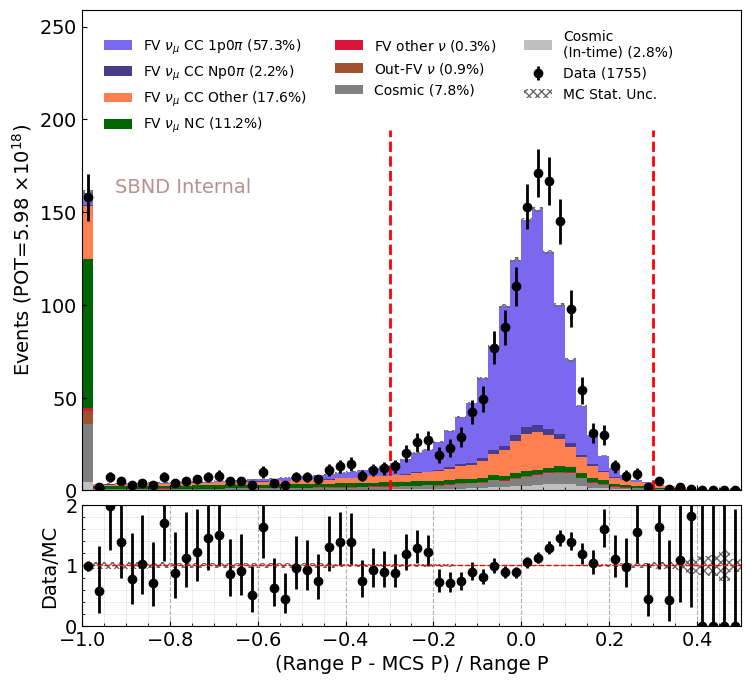

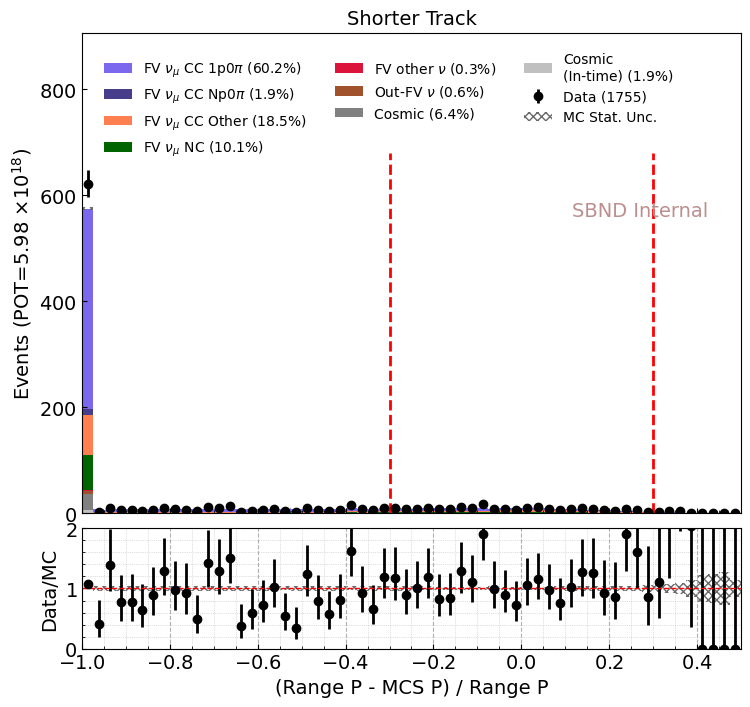

In [41]:
# mc_mu_cut = mc_mu_cut & (np.abs((mc_trk_df_2prong.pfp.trk.rangeP.p_muon - mc_trk_df_2prong.pfp.trk.mcsP.fwdP_muon) / mc_trk_df_2prong.pfp.trk.rangeP.p_muon) < qual_th)

# --- shorter track ---
plot_type = "topology"
bins = np.linspace(-1, 0.5, 61)
vline = [-0.3, 0.3]
evtdf = mc_evt_df_2prong

vardf = range_p_mcs_p(mc_evt_df_2prong.t1)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = range_p_mcs_p(data_evt_df_2prong.t1)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = range_p_mcs_p(intime_evt_df_2prong.t1)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["(Range P - MCS P) / Range P", 
               "Events (POT={})".format(pot_str), ""]

save_name = save_fig_dir + "/range_p_mcs_p_{}_t1.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

vardf = range_p_mcs_p(mc_evt_df_2prong.t2)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = range_p_mcs_p(data_evt_df_2prong.t2)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = range_p_mcs_p(intime_evt_df_2prong.t2)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["(Range P - MCS P) / Range P", 
               "Events (POT={})".format(pot_str), "Shorter Track"]

save_name = save_fig_dir + "/range_p_mcs_p_{}_t2.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

### PID scores per truth pdg

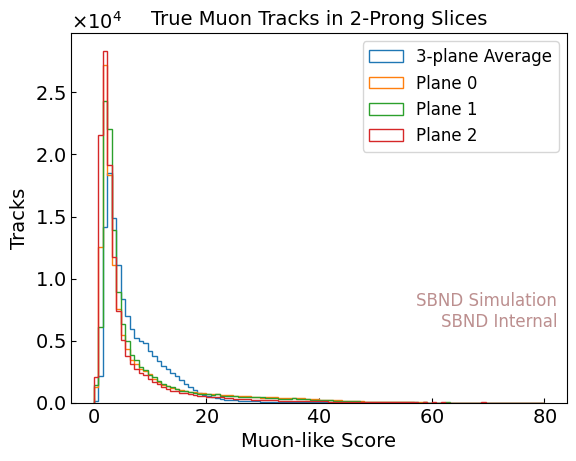

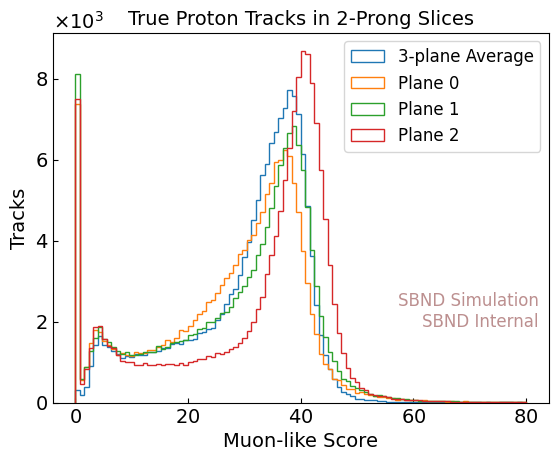

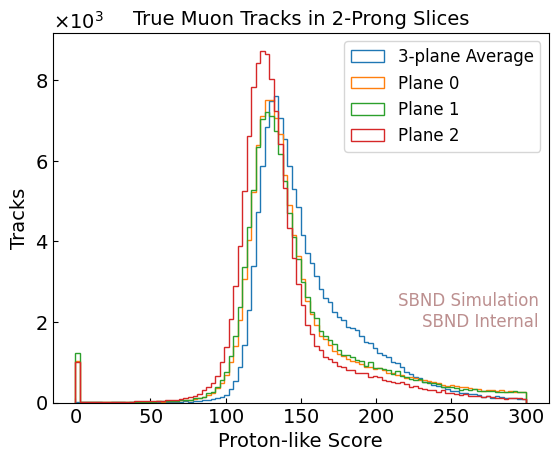

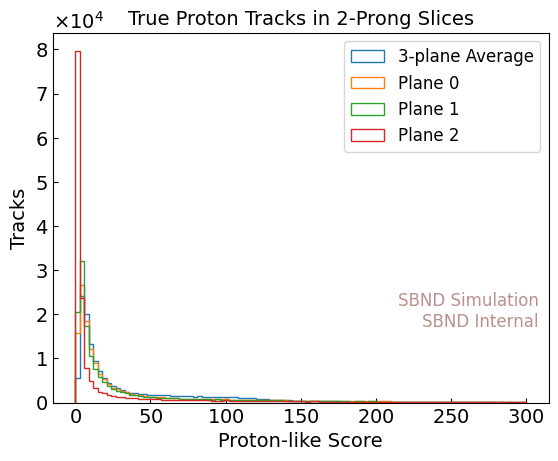

In [42]:
bins = np.linspace(0, 80, 101)
var = avg_chi2(mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13], "chi2_muon")
plt.hist(var, bins=bins, histtype="step", label="3-plane Average")
for i in range(3):
    var = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13].pfp.trk.chi2pid["I{}".format(i)].chi2_muon
    plt.hist(var, bins=bins, histtype="step", label="Plane {}".format(i))
plt.legend(fontsize=12)
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Muon-like Score")
plt.ylabel("Tracks")
plt.title("True Muon Tracks in 2-Prong Slices")
save_name = save_fig_dir + "/muon_chi2_muon_avg.png"
if save_fig:
    plt.savefig(save_name)
plt.show()

var = avg_chi2(mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212], "chi2_muon")
plt.hist(var, bins=bins, histtype="step", label="3-plane Average")
for i in range(3):
    var = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212].pfp.trk.chi2pid["I{}".format(i)].chi2_muon
    plt.hist(var, bins=bins, histtype="step", label="Plane {}".format(i))
plt.legend(fontsize=12)
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Muon-like Score")
plt.ylabel("Tracks")
plt.title("True Proton Tracks in 2-Prong Slices")
save_name = save_fig_dir + "/proton_chi2_muon_avg.png"
if save_fig:
    plt.savefig(save_name)
plt.show()

bins = np.linspace(0, 300, 101)
var = avg_chi2(mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13], "chi2_proton")
plt.hist(var, bins=bins, histtype="step", label="3-plane Average")
for i in range(3):
    var = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13].pfp.trk.chi2pid["I{}".format(i)].chi2_proton
    plt.hist(var, bins=bins, histtype="step", label="Plane {}".format(i))
plt.legend(fontsize=12)
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Proton-like Score")
plt.ylabel("Tracks")
plt.title("True Muon Tracks in 2-Prong Slices")
save_name = save_fig_dir + "/muon_chi2_proton_avg.png"
if save_fig:
    plt.savefig(save_name)
plt.show()

var = avg_chi2(mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212], "chi2_proton")
plt.hist(var, bins=bins, histtype="step", label="3-plane Average")
for i in range(3):
    var = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212].pfp.trk.chi2pid["I{}".format(i)].chi2_proton
    plt.hist(var, bins=bins, histtype="step", label="Plane {}".format(i))
plt.legend(fontsize=12)
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Proton-like Score")
plt.ylabel("Tracks")
plt.title("True Proton Tracks in 2-Prong Slices")
save_name = save_fig_dir + "/proton_chi2_proton_avg.png"
if save_fig:
    plt.savefig(save_name)
plt.show()

In [43]:
# TODO: average score over planes
# ---- find muon candidate from all tracks
# purity scan
mc_chimu_avg = avg_chi2(mc_trk_df_2prong, "chi2_muon")
# mc_chipi_avg = avg_chi2(mc_trk_df_2prong, "chi2_pion")
mc_chip_avg = avg_chi2(mc_trk_df_2prong, "chi2_proton")
data_chimu_avg = avg_chi2(data_trk_df_2prong, "chi2_muon", new=True)
# data_chipi_avg = avg_chi2(data_trk_df_2prong, "chi2_pion")
data_chip_avg = avg_chi2(data_trk_df_2prong, "chi2_proton", new=True)
intime_chimu_avg = avg_chi2(intime_trk_df_2prong, "chi2_muon")
# intime_chipi_avg = avg_chi2(intime_trk_df_2prong, "chi2_pion")
intime_chip_avg = avg_chi2(intime_trk_df_2prong, "chi2_proton")

# chi2mu_scan = np.arange(5, 40, 1)
# chi2p_scan = np.arange(5, 150, 5)
# chi2_scan_grid = np.zeros((len(chi2mu_scan), len(chi2p_scan)))
# ax[0].set_ylabel(plot_labels[1])
# ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
# ax[0].set_title(plot_labels[2])
# plt.colorbar(im[3], ax=ax[0], label="Tracks")

# mean_list = []
# sig_list = []
# for i in range(len(bins)-1):
#     for j, mu_chi2p_th in enumerate(chi2p_scan):
#         # mu_cut = (mc_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_muon > 0) & (mc_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_muon < mu_chi2mu_th) & (mc_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_proton > mu_chi2p_th)
#         mu_cut = (chimu_avg > 0) & (chimu_avg < mu_chi2mu_th) & (chip_avg > mu_chi2p_th)
#         mu_cut = mu_cut & (mc_trk_df_2prong.pfp.trk.len > 50)
#         mu_candidates = mc_trk_df_2prong[mu_cut]
#         mu_candidates_prequal = mu_candidates

#         # more muon-like than pion-like
#         # mu_cut = mu_cut & (mc_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_muon < mc_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_pion * 0.9)

#         # muon quality cut
#         mu_cut = mu_cut & (np.abs((mc_trk_df_2prong.pfp.trk.rangeP.p_muon - mc_trk_df_2prong.pfp.trk.mcsP.fwdP_muon) / mc_trk_df_2prong.pfp.trk.rangeP.p_muon) < 0.5)
#         mu_candidates = mc_trk_df_2prong[mu_cut]

#         # if multiple mu candidates in a slice, choose the longer one
#         mu_candidates = mu_candidates.sort_values(by=('pfp', 'trk', 'len'), ascending=False)
#         mu_candidate = mu_candidates.groupby(level=[0,1,2]).nth(0)

#         mu_eff = len(mu_candidates[mu_candidates.pfp.trk.truth.p.pdg == 13])/len(mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13])
#         mu_purity = len(mu_candidate[mu_candidate.pfp.trk.truth.p.pdg == 13])/len(mu_candidate)

#         if mu_purity > best_purity:
#             best_purity = mu_purity
#             best_purity_chi2mu = mu_chi2mu_th
#             best_purity_chi2p = mu_chi2p_th
#         if mu_eff > best_eff:
#             best_eff = mu_eff
#             best_eff_chi2mu = mu_chi2mu_th
#             best_eff_chi2p = mu_chi2p_th

#         chi2_scan_grid[i, j] = mu_purity
#         chi2_scan_grid_eff[i, j] = mu_eff
#         # norm_mu_purity = (mu_purity - np.nanmin(chi2_scan_grid)) / (np.nanmax(chi2_scan_grid) - np.nanmin(chi2_scan_grid))
#         # norm_mu_eff = (mu_eff - np.nanmin(chi2_scan_grid_eff)) / (np.nanmax(chi2_scan_grid_eff) - np.nanmin(chi2_scan_grid_eff))
#         # color_purity = plt.cm.viridis(norm_mu_purity)
#         # color_eff = plt.cm.viridis(norm_mu_eff)
#         # ax_p.plot(mu_chi2mu_th, mu_chi2p_th, "o", color=color_purity, markersize=5)
#         # ax_e.plot(mu_chi2mu_th, mu_chi2p_th, "o", color=color_eff, markersize=5)
#         # print("chimu: {}, chip: {}, muon purity: {}".format(mu_chi2mu_th, mu_chi2p_th, mu_purity))
# print("best purity: {} at mu_chi2mu: {}, mu_chi2p: {}".format(best_purity, best_purity_chi2mu, best_purity_chi2p))
# print("best eff: {} at mu_chi2mu: {}, mu_chi2p: {}".format(best_eff, best_eff_chi2mu, best_eff_chi2p))

# # find where this is
# max_purity = chi2_scan_grid[chi2_scan_grid_eff > 0.75].max()
# where_max = np.where((chi2_scan_grid == max_purity) & (chi2_scan_grid_eff > 0.75))
# print("Maximum purity where efficiency > 0.75 is:", max_purity)
# print("Indices (i, j) where this occurs:", list(zip(where_max[0], where_max[1])))
# print("mu_chi2mu_th", chi2mu_scan[where_max[0]])
# print("mu_chi2p_th", chi2p_scan[where_max[1]])

# --- optimized cut
mu_chi2mu_th = 30
mu_chi2p_th = 100
mu_len_th = 50

# mu_cut = (mc_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_muon > 0) & (mc_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_muon < mu_chi2mu_th) & (mc_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_proton > mu_chi2p_th)
mc_mu_cut = (mc_chimu_avg > 0) & (mc_chimu_avg < mu_chi2mu_th) & (mc_chip_avg > mu_chi2p_th)
mc_mu_cut = mc_mu_cut & (mc_trk_df_2prong.pfp.trk.len > 50)
mc_mu_candidates = mc_trk_df_2prong[mc_mu_cut]
mc_mu_candidates_prequal = mc_mu_candidates
data_mu_cut = (data_chimu_avg > 0) & (data_chimu_avg < mu_chi2mu_th) & (data_chip_avg > mu_chi2p_th)
data_mu_cut = data_mu_cut & (data_trk_df_2prong.pfp.trk.len > 50)
data_mu_candidates = data_trk_df_2prong[data_mu_cut]
data_mu_candidates_prequal = data_mu_candidates
intime_mu_cut = (intime_chimu_avg > 0) & (intime_chimu_avg < mu_chi2mu_th) & (intime_chip_avg > mu_chi2p_th)
intime_mu_cut = intime_mu_cut & (intime_trk_df_2prong.pfp.trk.len > 50)
intime_mu_candidates = intime_trk_df_2prong[intime_mu_cut]
intime_mu_candidates_prequal = intime_mu_candidates

# more muon-like than pion-like
# mu_cut = mu_cut & (mc_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_muon < mc_trk_df_2prong.pfp.trk.chi2pid.I2.chi2_pion * 0.9)

# muon quality cut
qual_th = 0.3
mc_mu_cut = mc_mu_cut & (np.abs((mc_trk_df_2prong.pfp.trk.rangeP.p_muon - mc_trk_df_2prong.pfp.trk.mcsP.fwdP_muon) / mc_trk_df_2prong.pfp.trk.rangeP.p_muon) < qual_th)
# mc_mu_cut = mc_mu_cut & (mc_chimu_avg / mc_chipi_avg < 1) 
mc_mu_candidates = mc_trk_df_2prong[mc_mu_cut]
data_mu_cut = data_mu_cut & (np.abs((data_trk_df_2prong.pfp.trk.rangeP.p_muon - data_trk_df_2prong.pfp.trk.mcsP.fwdP_muon) / data_trk_df_2prong.pfp.trk.rangeP.p_muon) < qual_th)
# data_mu_cut = data_mu_cut & (data_chimu_avg / data_chipi_avg < 1)
data_mu_candidates = data_trk_df_2prong[data_mu_cut]
intime_mu_cut = intime_mu_cut & (np.abs((intime_trk_df_2prong.pfp.trk.rangeP.p_muon - intime_trk_df_2prong.pfp.trk.mcsP.fwdP_muon) / intime_trk_df_2prong.pfp.trk.rangeP.p_muon) < qual_th)
# intime_mu_cut = intime_mu_cut & (intime_chimu_avg / intime_chipi_avg < 1)
intime_mu_candidates = intime_trk_df_2prong[intime_mu_cut]

# if multiple mu candidates in a slice, choose the longer one
mc_mu_candidates = mc_mu_candidates.sort_values(by=('pfp', 'trk', 'len'), ascending=False)
mc_mu_candidate = mc_mu_candidates.groupby(level=[0,1,2]).nth(0)
data_mu_candidates = data_mu_candidates.sort_values(by=('pfp', 'trk', 'len'), ascending=False)
data_mu_candidate = data_mu_candidates.groupby(level=[0,1,2]).nth(0)
intime_mu_candidates = intime_mu_candidates.sort_values(by=('pfp', 'trk', 'len'), ascending=False)
intime_mu_candidate = intime_mu_candidates.groupby(level=[0,1,2]).nth(0)

mc_mu_eff = len(mc_mu_candidates[mc_mu_candidates.pfp.trk.truth.p.pdg == 13])/len(mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13])
mc_mu_purity = len(mc_mu_candidate[mc_mu_candidate.pfp.trk.truth.p.pdg == 13])/len(mc_mu_candidate)
print("chimu: {}, chip: {}, muon efficiency: {}, purity: {}".format(mu_chi2mu_th, mu_chi2p_th, mc_mu_eff, mc_mu_purity))

chimu: 30, chip: 100, muon efficiency: 0.8107767972266617, purity: 0.9443863476551936


/tmp/ipykernel_44133/3157774759.py:110: PerformanceWarning: indexing past lexsort depth may impact performance.
  mc_mu_candidates = mc_mu_candidates.sort_values(by=('pfp', 'trk', 'len'), ascending=False)
/tmp/ipykernel_44133/3157774759.py:112: PerformanceWarning: indexing past lexsort depth may impact performance.
  data_mu_candidates = data_mu_candidates.sort_values(by=('pfp', 'trk', 'len'), ascending=False)
/tmp/ipykernel_44133/3157774759.py:114: PerformanceWarning: indexing past lexsort depth may impact performance.
  intime_mu_candidates = intime_mu_candidates.sort_values(by=('pfp', 'trk', 'len'), ascending=False)


In [44]:
mc_trk_idx = mc_trk_df_2prong.index.difference(mc_mu_candidate.index)
mc_not_mu_candidate = mc_trk_df_2prong.loc[mc_trk_idx]
mc_chimu_avg = avg_chi2(mc_not_mu_candidate, "chi2_muon")
mc_chip_avg = avg_chi2(mc_not_mu_candidate, "chi2_proton")
data_trk_idx = data_trk_df_2prong.index.difference(data_mu_candidate.index)
data_not_mu_candidate = data_trk_df_2prong.loc[data_trk_idx]
data_chimu_avg = avg_chi2(data_not_mu_candidate, "chi2_muon", new=True)
data_chip_avg = avg_chi2(data_not_mu_candidate, "chi2_proton", new=True)
intime_trk_idx = intime_trk_df_2prong.index.difference(intime_mu_candidate.index)
intime_not_mu_candidate = intime_trk_df_2prong.loc[intime_trk_idx]
intime_chimu_avg = avg_chi2(intime_not_mu_candidate, "chi2_muon")
intime_chip_avg = avg_chi2(intime_not_mu_candidate, "chi2_proton")

# -- scan over chi2_muon and chi2_proton
# chi2mu_scan = np.arange(20, 30, 1)
# chi2p_scan = np.arange(60, 120, 1)
# chi2_scan_grid = np.zeros((len(chi2mu_scan), len(chi2p_scan)))
# chi2_scan_grid_eff = np.zeros((len(chi2mu_scan), len(chi2p_scan)))

# best_purity = 0
# best_purity_chi2mu = 0
# best_purity_chi2p = 0
# best_eff = 0
# best_eff_chi2mu = 0
# best_eff_chi2p = 0

# # for i, p_chi2mu_th in enumerate(chi2mu_scan):
# i = 0
# for j, p_chi2p_th in enumerate(chi2p_scan):
#     # p_cut = (not_mu_candidate.pfp.trk.chi2pid.I2.chi2_muon > p_chi2mu_th) & (not_mu_candidate.pfp.trk.chi2pid.I2.chi2_proton > 0) & (not_mu_candidate.pfp.trk.chi2pid.I2.chi2_proton < p_chi2p_th)
#     p_cut = (chip_avg > 0) & (chip_avg < p_chi2p_th)
#     p_candidates = not_mu_candidate[p_cut]
#     p_eff = len(p_candidates[p_candidates.pfp.trk.truth.p.pdg == 2212])/len(not_mu_candidate[not_mu_candidate.pfp.trk.truth.p.pdg == 2212])
#     p_purity = len(p_candidates[p_candidates.pfp.trk.truth.p.pdg == 2212])/len(p_candidates)

#     if p_purity > best_purity:
#         best_purity = p_purity
#         # best_purity_chi2mu = p_chi2mu_th
#         best_purity_chi2p = p_chi2p_th
#     if p_eff > best_eff:
#         best_eff = p_eff
#         # best_eff_chi2mu = p_chi2mu_th
#         best_eff_chi2p = p_chi2p_th

#     chi2_scan_grid[i, j] = p_purity
#     chi2_scan_grid_eff[i, j] = p_eff

# print("best purity: {} at p_chi2mu: {}, p_chi2p: {}".format(best_purity, best_purity_chi2mu, best_purity_chi2p))
# print("best eff: {} at p_chi2mu: {}, p_chi2p: {}".format(best_eff, best_eff_chi2mu, best_eff_chi2p))

# # find where this is
# max_purity = chi2_scan_grid[chi2_scan_grid_eff > 0.85].max()
# where_max = np.where((chi2_scan_grid == max_purity) & (chi2_scan_grid_eff > 0.85))
# print("Maximum purity where efficiency > 0.85 is:", max_purity)
# print("Indices (i, j) where this occurs:", list(zip(where_max[0], where_max[1])))
# print("p_chi2mu_th", chi2mu_scan[where_max[0]])
# print("p_chi2p_th", chi2p_scan[where_max[1]])


# ---- in leftovers, find proton candidates
p_chi2p_th = 90

# p_cut = (not_mu_candidate.pfp.trk.chi2pid.I2.chi2_proton > 0) & (not_mu_candidate.pfp.trk.chi2pid.I2.chi2_proton < p_chi2p_th)
mc_p_cut = (mc_chip_avg > 0) & (mc_chip_avg < p_chi2p_th)
mc_p_candidates = mc_not_mu_candidate[mc_p_cut]
data_p_cut = (data_chip_avg > 0) & (data_chip_avg < p_chi2p_th)
data_p_candidates = data_not_mu_candidate[data_p_cut]
intime_p_cut = (intime_chip_avg > 0) & (intime_chip_avg < p_chi2p_th)
intime_p_candidates = intime_not_mu_candidate[intime_p_cut]

print("proton efficiency", len(mc_p_candidates[mc_p_candidates.pfp.trk.truth.p.pdg == 2212])/len(mc_not_mu_candidate[mc_not_mu_candidate.pfp.trk.truth.p.pdg == 2212]))
print("proton purity", len(mc_p_candidates[mc_p_candidates.pfp.trk.truth.p.pdg == 2212])/len(mc_p_candidates))

proton efficiency 0.8394334299368559
proton purity 0.9907577302072715


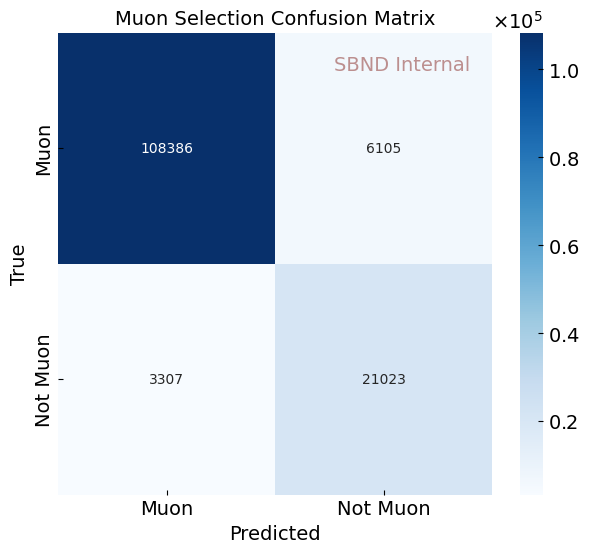

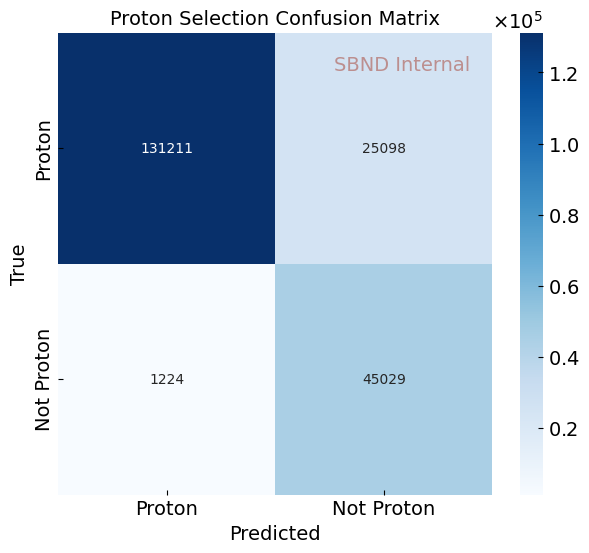

In [45]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix

# --- Muon selection confusion matrix ---
# True: 13 (muon), 2212 (proton), else (other)
# Pred: muon candidate or not

# Get true and predicted labels for muon selection
mu_true = mc_trk_df_2prong.pfp.trk.truth.p.pdg
mu_pred = np.zeros_like(mu_true)
# Fix: Use .loc to assign by index labels, not by position
mu_pred = pd.Series(0, index=mc_trk_df_2prong.index)
mu_pred.loc[mc_mu_candidates.index] = 1  # 1 if selected as muon candidate
mu_pred = mu_pred.values  # convert back to numpy array if needed

# Only consider true muons and protons for confusion matrix
mu_mask = (mc_trk_df_2prong.pfp.trk.len > 50)
mu_true_label = np.where(np.abs(mu_true[mu_mask]) == 13, 1, 0)  # 1: muon, 0: not-muon (proton)
mu_pred_label = mu_pred[mu_mask]
# mu_true_label = np.where(np.abs(mu_true) == 13, 1, 0)  # 1: muon, 0: not-muon (proton)
# mu_pred_label = mu_pred

cm_mu = confusion_matrix(mu_true_label, mu_pred_label, labels=[1,0])

plt.figure(figsize=(7,6))
sns.heatmap(cm_mu, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Muon', 'Not Muon'], 
            yticklabels=['Muon', 'Not Muon'])
plt.title('Muon Selection Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.text(0.95, 0.95, "SBND Internal", ha='right', va='top', transform=plt.gca().transAxes, color="rosybrown", fontsize=14)
# plt.xticks(rotation=45)
if save_fig:
    save_name = save_fig_dir + "/muon_confusion_matrix.png"
    plt.savefig(save_name, bbox_inches='tight', dpi=300)
plt.show()

# --- Proton selection confusion matrix ---
# Only for tracks not selected as muon
# True: 2212 (proton), 13 (muon), else (other)
# Pred: proton candidate or not

p_true = mc_not_mu_candidate.pfp.trk.truth.p.pdg
p_pred = np.zeros_like(p_true)
# Fix: Use .loc to assign by index labels, not by position
p_pred = pd.Series(0, index=mc_not_mu_candidate.index)
p_pred.loc[mc_p_candidates.index] = 1  # 1 if selected as proton candidate
p_pred = p_pred.values  # convert back to numpy array if needed

# Only consider true protons and muons for confusion matrix
# p_mask = (np.abs(p_true) == 13) | (p_true == 2212)
# p_true_label = np.where(p_true[p_mask] == 2212, 1, 0)  # 1: proton, 0: not-proton (muon)
# p_pred_label = p_pred[p_mask]
p_true_label = np.where(p_true == 2212, 1, 0)  # 1: proton, 0: not-proton (muon)
p_pred_label = p_pred

cm_p = confusion_matrix(p_true_label, p_pred_label, labels=[1,0])

plt.figure(figsize=(7,6))
sns.heatmap(cm_p, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Proton', 'Not Proton'], 
            yticklabels=['Proton', 'Not Proton'])
plt.title('Proton Selection Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.text(0.95, 0.95, "SBND Internal", ha='right', va='top', transform=plt.gca().transAxes, color="rosybrown", fontsize=14)
if save_fig:
    save_name = save_fig_dir + "/proton_confusion_matrix.png"
    plt.savefig(save_name, bbox_inches='tight', dpi=300)
plt.show()


In [46]:
evtdf = mc_evt_df_2prong.loc[mc_not_mu_candidate.index]
evtdf

slc                          \
                              is_clear_cosmic      vertex               
                                                        x           y   
                                                                        
                                                                        
                                                                        
                                                                        
                                                                        
__ntuple entry rec.slc..index                                           
0        111   0                            0  184.286377   33.718452   
         125   0                            0   23.660173   54.400906   
         126   0                            0 -161.777588  -37.010403   
         183   1                            0 -175.388382   78.904922   
               1                            0 -175.388382   78.904922   
..                                        ...         ...         ...   
389      16722 1                            0 -165.314255  -83.843521   
               1                            0 -165.314255  -83.843521   
         16774 0                            0   53.149792 -101.504662   
               0                            0   53.149792 -101.504662   
         16779 0                            0  -73.463898  -23.442242   

                                                                         \
                                          self    tmatch                  
                                        z            eff       pur  idx   
                                                                          
                                                                          
                                                                          
                                                                          
                                                                          
__ntuple entry rec.slc..index                                             
0        111   0               293.900726   29  0.836586  0.906707  0.0   
         125   0               281.815582   29  0.750814  0.764276  0.0   
         126   0               288.450104   19  0.855856  0.927829  0.0   
         183   1               173.451828   47  0.969987  0.918924  2.0   
               1               173.451828   47  0.969987  0.918924  2.0   
..                                    ...  ...       ...       ...  ...   
389      16722 1               110.228279   65  0.854724  0.964809  0.0   
               1               110.228279   65  0.854724  0.964809  0.0   
         16774 0               351.942322   19  0.858592  0.956850  0.0   
               0               351.942322   19  0.858592  0.956850  0.0   
         16779 0               232.055405   78  0.834948  0.856728  0.0   

                                                      ...         p            \
                              producer          nuid  ...       dir             
                                       crlongtrkdiry  ...         y         z   
                                                      ...                       
                                                      ...                       
                                                      ...                       
                                                      ...                       
                                                      ...                       
__ntuple entry rec.slc..index                         ...                       
0        111   0                     0     -0.102101  ... -0.272280  0.887980   
         125   0                     0     -0.071278  ... -0.295954  0.538121   
         126   0                     0     -0.380490  ... -0.270570  0.647163   
         183   1                     0      0.059120  ...  0.021891  0.919901   
               1           

In [47]:
# --- shorter track ---
# plot_type = "topology"
# bins = np.linspace(0, 60, 61)
# vline = None
# evtdf = mc_evt_df_2prong.loc[mc_not_mu_candidate.index]
# vardf = avg_chi2(mc_not_mu_candidate, "chi2_muon")
# vardf_data = avg_chi2(data_not_mu_candidate, "chi2_muon")
# vardf_intime = avg_chi2(intime_not_mu_candidate, "chi2_muon")
# plot_labels = ["Muon-like Score", 
#                "Events (POT={})".format(pot_str), "Shorter Track"]

# save_name = save_fig_dir + "/chi2muon_{}_t2.png".format(plot_type)
# ret_hist_topo = hist_plot(plot_type,
#                           evtdf, vardf, 
#                           vardf_data, vardf_intime,
#                           bins,
#                           plot_labels,
#                           vline=vline,
#                           save_fig=save_fig, save_name=save_name)

# plot_type = "topology"
# bins = np.linspace(0, 350, 61)
# vline = 100
# vardf = avg_chi2(mc_not_mu_candidate, "chi2_proton")
# vardf_data = avg_chi2(data_not_mu_candidate, "chi2_proton")
# vardf_intime = avg_chi2(intime_not_mu_candidate, "chi2_proton")
# plot_labels = ["Proton-like Score", 
#                "Events (POT={})".format(pot_str), "Shorter Track"]

# save_name = save_fig_dir + "/chi2proton_{}_t2.png".format(plot_type)
# ret_hist_topo = hist_plot(plot_type,
#                           evtdf, vardf, 
#                           vardf_data, vardf_intime,
#                           bins,
#                           plot_labels,
#                           vline=vline,
#                           save_fig=save_fig, save_name=save_name)

In [48]:
# mc_p_idx = mc_p_candidates.index.unique()
# mc_mu_p_idx = mc_mu_idx.intersection(mc_p_idx)
# print("mc_mu_idx", len(mc_mu_idx))
# print("mc_p_idx", len(mc_p_idx))
# print("mc_mu_p_idx", len(mc_mu_p_idx))

# mc_mu_idx
# # mc_evt_df_mup = mc_evt_df_2prong.loc[mc_mu_p_idx]

mc_mu_idx 110084
mc_p_idx 115347
mc_mu_p_idx 79666
data_mu_idx 1273
data_p_idx 1181
data_mu_p_idx 846
intime_mu_idx 3203
intime_p_idx 622
intime_mu_p_idx 77


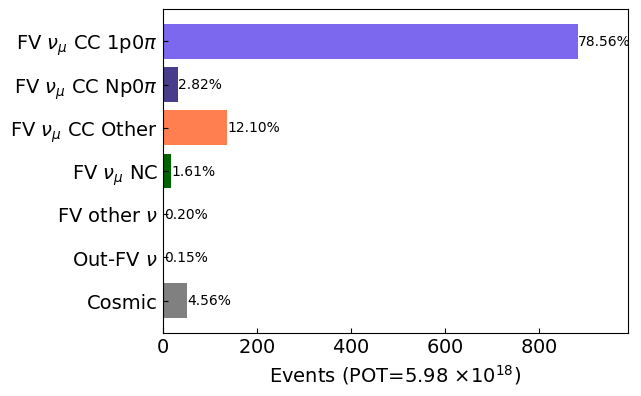

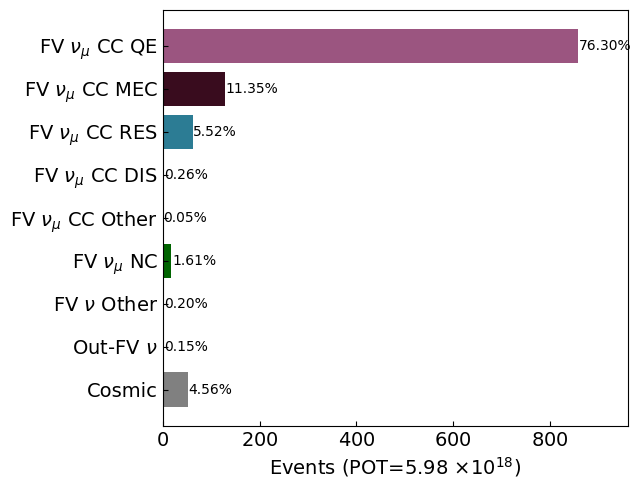

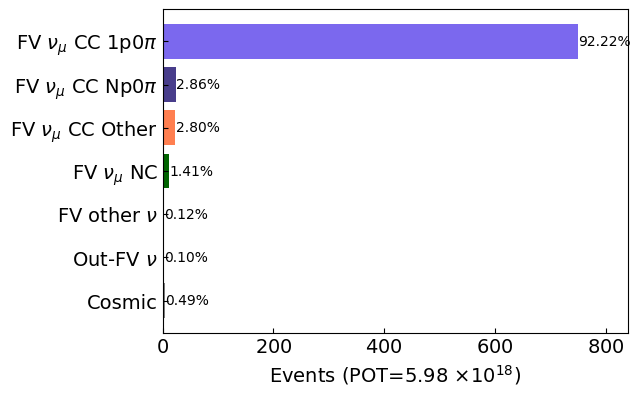

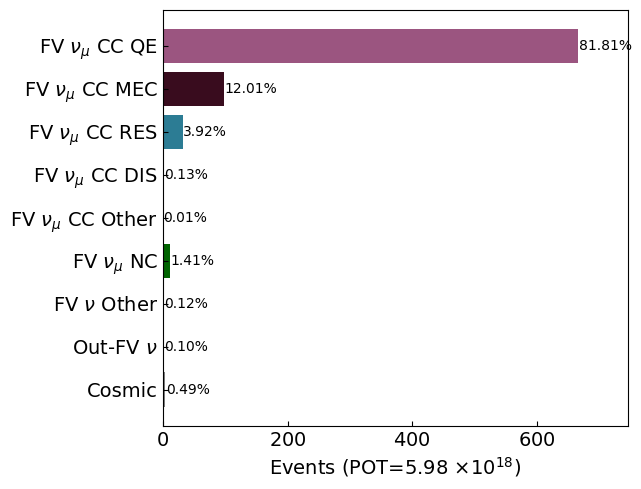

In [49]:
# ---- limit to the target kinematic range 
MASS_MUON = 0.1056583745
mu_low_th = 0.22
mu_hi_th = 1

mc_mu_candidate_nopcut = mc_mu_candidate
mc_mu_kin_cut = (mc_mu_candidate.pfp.trk.rangeP.p_muon > mu_low_th)
mc_mu_kin_cut = mc_mu_kin_cut & (mc_mu_candidate.pfp.trk.rangeP.p_muon < mu_hi_th)
mc_mu_candidate = mc_mu_candidate[mc_mu_kin_cut]
data_mu_kin_cut = (data_mu_candidate.pfp.trk.rangeP.p_muon > mu_low_th)
data_mu_kin_cut = data_mu_kin_cut & (data_mu_candidate.pfp.trk.rangeP.p_muon < mu_hi_th)
data_mu_candidate = data_mu_candidate[data_mu_kin_cut]
intime_mu_kin_cut = (intime_mu_candidate.pfp.trk.rangeP.p_muon > mu_low_th)
intime_mu_kin_cut = intime_mu_kin_cut & (intime_mu_candidate.pfp.trk.rangeP.p_muon < mu_hi_th)
intime_mu_candidate = intime_mu_candidate[intime_mu_kin_cut]

MASS_PROTON = 0.938272081
p_low_th = 0.3
p_hi_th = 1

mc_p_candidates_nopcut = mc_p_candidates
mc_p_kin_cut = (mc_p_candidates.pfp.trk.rangeP.p_proton > p_low_th)
mc_p_kin_cut = mc_p_kin_cut & (mc_p_candidates.pfp.trk.rangeP.p_proton < p_hi_th)
mc_p_candidates = mc_p_candidates[mc_p_kin_cut]
data_p_kin_cut = (data_p_candidates.pfp.trk.rangeP.p_proton > p_low_th)
data_p_kin_cut = data_p_kin_cut & (data_p_candidates.pfp.trk.rangeP.p_proton < p_hi_th)
data_p_candidates = data_p_candidates[data_p_kin_cut]
intime_p_kin_cut = (intime_p_candidates.pfp.trk.rangeP.p_proton > p_low_th)
intime_p_kin_cut = intime_p_kin_cut & (intime_p_candidates.pfp.trk.rangeP.p_proton < p_hi_th)
intime_p_candidates = intime_p_candidates[intime_p_kin_cut]

# select mu-X slice
stage_key = "2prong-muX"
mc_mu_idx = mc_mu_candidate.reset_index(level=[3]).index.unique()
mc_evt_df_muX = mc_evt_df_2prong.loc[mc_mu_idx]
data_mu_idx = data_mu_candidate.reset_index(level=[3]).index.unique()
data_evt_df_muX = data_evt_df_2prong.loc[data_mu_idx]
intime_mu_idx = intime_mu_candidate.reset_index(level=[3]).index.unique()
intime_evt_df_muX = intime_evt_df_2prong.loc[intime_mu_idx]

bar_type = "topology"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_topo = bar_plot(type=bar_type, evtdf=mc_evt_df_muX,
                     plot_labels=plot_labels_bar,
                     save_fig=save_fig, save_name=save_name)

bar_type = "genie"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_genie = bar_plot(type=bar_type, evtdf=mc_evt_df_muX, 
                      plot_labels=plot_labels_bar,
                      save_fig=save_fig, save_name=save_name)

df_dict[stage_key] = mc_evt_df_muX
df_dict_data[stage_key] = data_evt_df_muX
df_dict_intime[stage_key] = intime_evt_df_muX
perc_dict_topo[stage_key] = ret_topo["perc_list"]
perc_dict_genie[stage_key] = ret_genie["perc_list"]

# select mu-p slice
stage_key = "2prong-mup"
mc_p_idx = mc_p_candidates.reset_index(level=[3]).index.unique()
mc_mu_p_idx = mc_mu_idx.intersection(mc_p_idx)
print("mc_mu_idx", len(mc_mu_idx))
print("mc_p_idx", len(mc_p_idx))
print("mc_mu_p_idx", len(mc_mu_p_idx))
data_p_idx = data_p_candidates.reset_index(level=[3]).index.unique()
data_mu_p_idx = data_mu_idx.intersection(data_p_idx)
print("data_mu_idx", len(data_mu_idx))
print("data_p_idx", len(data_p_idx))
print("data_mu_p_idx", len(data_mu_p_idx))
intime_p_idx = intime_p_candidates.reset_index(level=[3]).index.unique()
intime_mu_p_idx = intime_mu_idx.intersection(intime_p_idx)
print("intime_mu_idx", len(intime_mu_idx))
print("intime_p_idx", len(intime_p_idx))
print("intime_mu_p_idx", len(intime_mu_p_idx))

mc_evt_df_mup = mc_evt_df_2prong.loc[mc_mu_p_idx]
data_evt_df_mup = data_evt_df_2prong.loc[data_mu_p_idx]
intime_evt_df_mup = intime_evt_df_2prong.loc[intime_mu_p_idx]
bar_type = "topology"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_topo = bar_plot(type=bar_type, evtdf=mc_evt_df_mup,
                     plot_labels=plot_labels_bar,
                     save_fig=save_fig, save_name=save_name)

bar_type = "genie"
save_name = save_fig_dir + "/bar_plot-{}-{}.png".format(bar_type, stage_key)
ret_genie = bar_plot(type=bar_type, evtdf=mc_evt_df_mup, 
                      plot_labels=plot_labels_bar,
                      save_fig=save_fig, save_name=save_name)

df_dict[stage_key] = mc_evt_df_mup
df_dict_data[stage_key] = data_evt_df_mup
df_dict_intime[stage_key] = intime_evt_df_mup
perc_dict_topo[stage_key] = ret_topo["perc_list"]
perc_dict_genie[stage_key] = ret_genie["perc_list"]

# match tracks to slices
mc_mu_df = match_trkdf_to_slcdf(mc_mu_candidate, mc_evt_df_mup)
mc_p_df = match_trkdf_to_slcdf(mc_p_candidates, mc_evt_df_mup)
data_mu_df = match_trkdf_to_slcdf(data_mu_candidate, data_evt_df_mup)
data_p_df = match_trkdf_to_slcdf(data_p_candidates, data_evt_df_mup)
intime_mu_df = match_trkdf_to_slcdf(intime_mu_candidate, intime_evt_df_mup)
intime_p_df = match_trkdf_to_slcdf(intime_p_candidates, intime_evt_df_mup)


## Data vs. MC Comparison

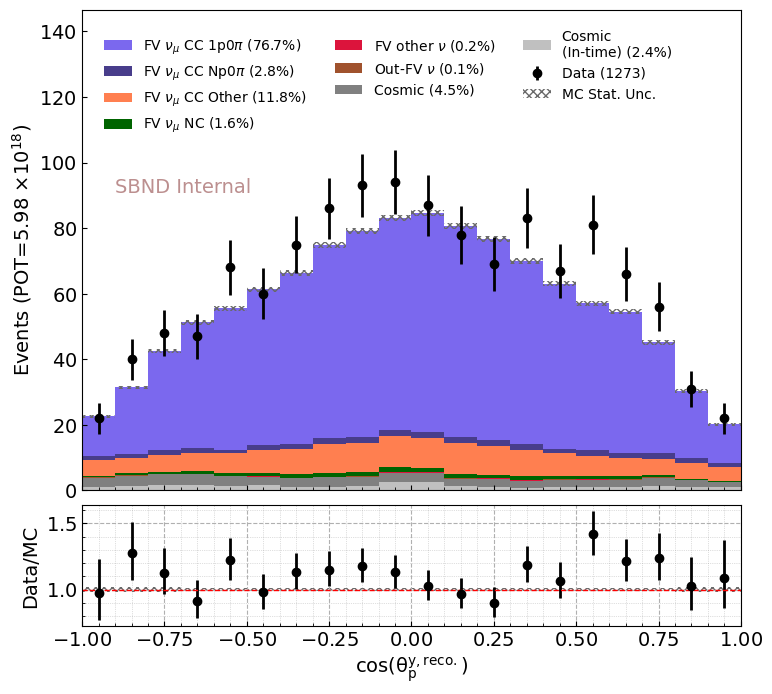

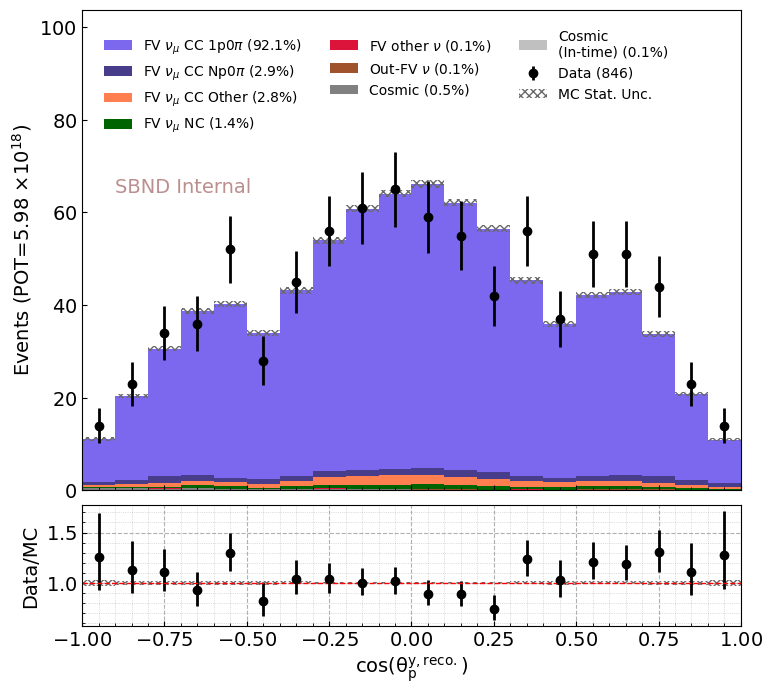

In [50]:
evtdf = mc_evt_df_muX
vardf = mc_evt_df_muX.t2.pfp.trk.dir.y
vardf_data = data_evt_df_muX.t2.pfp.trk.dir.y
vardf_intime = intime_evt_df_muX.t2.pfp.trk.dir.y
bins = np.linspace(-1,1,21)
eps = 1e-8
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_p^{y, reco.})}$",
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/p_dir_y_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

evtdf = mc_evt_df_mup
vardf = mc_evt_df_mup.t2.pfp.trk.dir.y
vardf_data = data_evt_df_mup.t2.pfp.trk.dir.y
vardf_intime = intime_evt_df_mup.t2.pfp.trk.dir.y
bins = np.linspace(-1,1,21)
eps = 1e-8
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_p^{y, reco.})}$",
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/p_dir_y_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

In [51]:
# TODO: are there any cases where the proton is longer than the muon?

longer_muon_1mu1p = (mc_track1.pfp.trk.truth.p.pdg == 13) & (mc_track2.pfp.trk.truth.p.pdg == 2212)
longer_proton_1mu1p = (mc_track1.pfp.trk.truth.p.pdg == 2212) & (mc_track2.pfp.trk.truth.p.pdg == 13)

print("1mu1p, longer muon", longer_muon_1mu1p.sum()/len(longer_muon_1mu1p))
print("1mu1p, longer proton", longer_proton_1mu1p.sum()/len(longer_muon_1mu1p))

longer_muon_1mu1mu = (mc_track1.pfp.trk.truth.p.pdg == 13) & (mc_track2.pfp.trk.truth.p.pdg == 13)
print("1mu1mu, longer muon", longer_muon_1mu1mu.sum()/len(longer_muon_1mu1mu))

piplus_proton = (mc_track1.pfp.trk.truth.p.pdg == 211) & (mc_track2.pfp.trk.truth.p.pdg == 2212)
piminus_proton = (mc_track1.pfp.trk.truth.p.pdg == -211) & (mc_track2.pfp.trk.truth.p.pdg == 2212)
print("piplus_proton", piplus_proton.sum()/len(piplus_proton))
print("piminus_proton", piminus_proton.sum()/len(piminus_proton))

mu_piplus = (mc_track1.pfp.trk.truth.p.pdg == 13) & (mc_track2.pfp.trk.truth.p.pdg == 211)
mu_piminus = (mc_track1.pfp.trk.truth.p.pdg == 13) & (mc_track2.pfp.trk.truth.p.pdg == -211)
print("mu_piplus", mu_piplus.sum()/len(mu_piplus))
print("mu_piminus", mu_piminus.sum()/len(mu_piminus))

print("-----------------")
print("longer track")
print(mc_track1.pfp.trk.truth.p.pdg.value_counts())
print("shorter track")
print(mc_track2.pfp.trk.truth.p.pdg.value_counts())

1mu1p, longer muon 0.703854693002603
1mu1p, longer proton 0.04005256979533507
1mu1mu, longer muon 0.024683560455264635
piplus_proton 0.00755371816465064
piminus_proton 0.0243773286377788
mu_piplus 0.009735619864237228
mu_piminus 0.0004402082376358904
-----------------
longer track
pdg
 13            118617
 2212           25575
-13              4959
-211             4474
 211             2537
-11               271
 22               156
 11                82
 1000010020        69
 321                2
 1000010030         1
 1000020030         1
Name: count, dtype: int64
shorter track
pdg
 2212          131246
 13             10902
-11              4779
-211             3434
 11              2656
 211             2159
-13               813
 1000010020       456
 22               220
 1000020040        33
 1000010030        23
 1000020030        16
 1000170350         1
 1000030060         1
 1000130270         1
 1000140300         1
 1000100210         1
 321                1
 100006012

/tmp/ipykernel_44133/2493687644.py:6: PerformanceWarning: indexing past lexsort depth may impact performance.
  mc_bothtracks_mu = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13][var_name]
/tmp/ipykernel_44133/2493687644.py:7: PerformanceWarning: indexing past lexsort depth may impact performance.
  mc_bothtracks_pi = mc_trk_df_2prong[np.abs(mc_trk_df_2prong.pfp.trk.truth.p.pdg) == 211][var_name]
/tmp/ipykernel_44133/2493687644.py:8: PerformanceWarning: indexing past lexsort depth may impact performance.
  mc_bothtracks_p = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212][var_name]


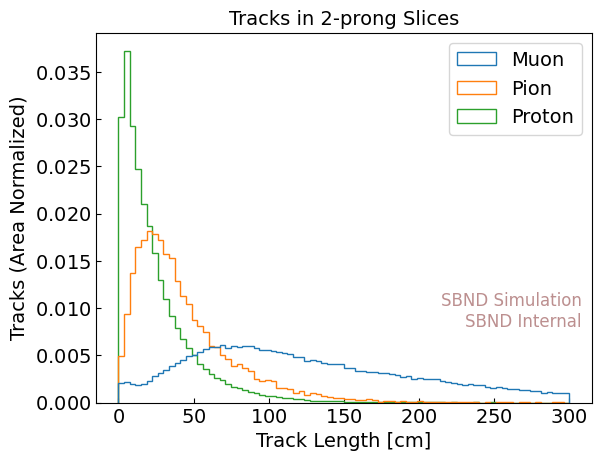

/tmp/ipykernel_44133/2493687644.py:26: PerformanceWarning: indexing past lexsort depth may impact performance.
  mc_track1_mu = mc_track1[mc_track1.pfp.trk.truth.p.pdg == 13][var_name]
/tmp/ipykernel_44133/2493687644.py:27: PerformanceWarning: indexing past lexsort depth may impact performance.
  mc_track1_pi = mc_track1[np.abs(mc_track1.pfp.trk.truth.p.pdg) == 211][var_name]
/tmp/ipykernel_44133/2493687644.py:28: PerformanceWarning: indexing past lexsort depth may impact performance.
  mc_track1_p = mc_track1[mc_track1.pfp.trk.truth.p.pdg == 2212][var_name]


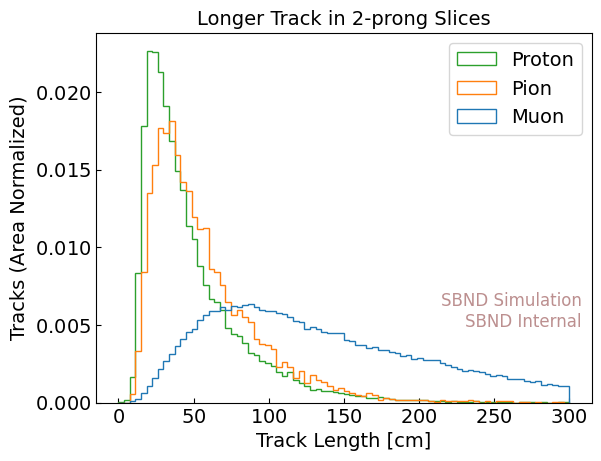

/tmp/ipykernel_44133/2493687644.py:44: PerformanceWarning: indexing past lexsort depth may impact performance.
  mc_track2_mu = mc_track2[mc_track2.pfp.trk.truth.p.pdg == 13][var_name]
/tmp/ipykernel_44133/2493687644.py:45: PerformanceWarning: indexing past lexsort depth may impact performance.
  mc_track2_pi = mc_track2[np.abs(mc_track2.pfp.trk.truth.p.pdg) == 211][var_name]
/tmp/ipykernel_44133/2493687644.py:46: PerformanceWarning: indexing past lexsort depth may impact performance.
  mc_track2_p = mc_track2[mc_track2.pfp.trk.truth.p.pdg == 2212][var_name]


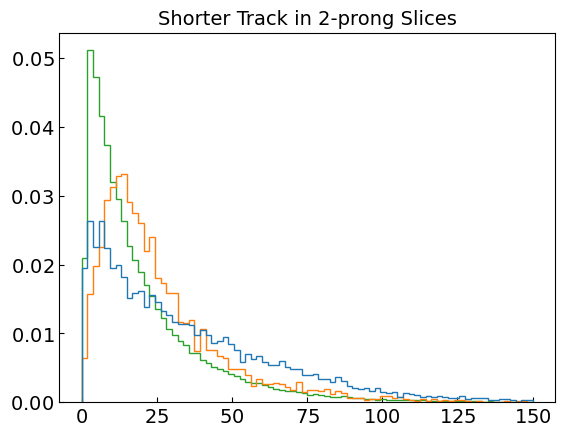

In [52]:
# mu score comparison for different true pdgs
var_name = ("pfp", "trk", "len", "", "", "")
bins = np.linspace(0, 300, 81)
pdg_labels = ["Muon", "Pion", "Proton"]

mc_bothtracks_mu = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13][var_name]
mc_bothtracks_pi = mc_trk_df_2prong[np.abs(mc_trk_df_2prong.pfp.trk.truth.p.pdg) == 211][var_name]
mc_bothtracks_p = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212][var_name]
var = [mc_bothtracks_mu, mc_bothtracks_pi, mc_bothtracks_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
# flip the legend order
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1])
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')

plt.xlabel("Track Length [cm]")
plt.ylabel("Tracks (Area Normalized)")
plt.title("Tracks in 2-prong Slices")
save_name = save_fig_dir + "/track_length_2prong.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

mc_track1_mu = mc_track1[mc_track1.pfp.trk.truth.p.pdg == 13][var_name]
mc_track1_pi = mc_track1[np.abs(mc_track1.pfp.trk.truth.p.pdg) == 211][var_name]
mc_track1_p = mc_track1[mc_track1.pfp.trk.truth.p.pdg == 2212][var_name]
var = [mc_track1_mu, mc_track1_pi, mc_track1_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
plt.legend()
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Track Length [cm]")
plt.ylabel("Tracks (Area Normalized)")
plt.title("Longer Track in 2-prong Slices")
save_name = save_fig_dir + "/track_length_2prong_longer.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

bins = np.linspace(0, 150, 81)
mc_track2_mu = mc_track2[mc_track2.pfp.trk.truth.p.pdg == 13][var_name]
mc_track2_pi = mc_track2[np.abs(mc_track2.pfp.trk.truth.p.pdg) == 211][var_name]
mc_track2_p = mc_track2[mc_track2.pfp.trk.truth.p.pdg == 2212][var_name]
var = [mc_track2_mu, mc_track2_pi, mc_track2_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
plt.title("Shorter Track in 2-prong Slices")
save_name = save_fig_dir + "/track_length_2prong_shorter.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

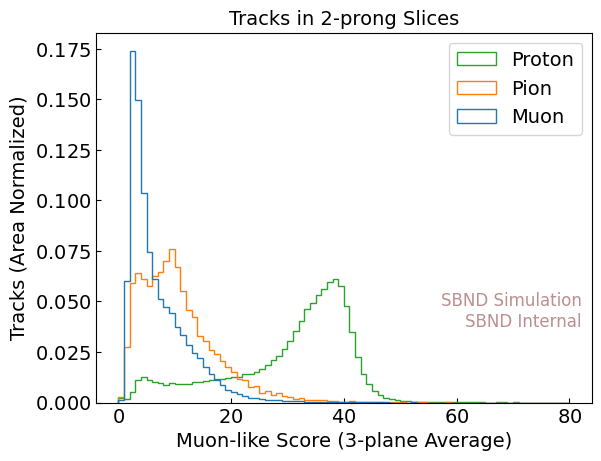

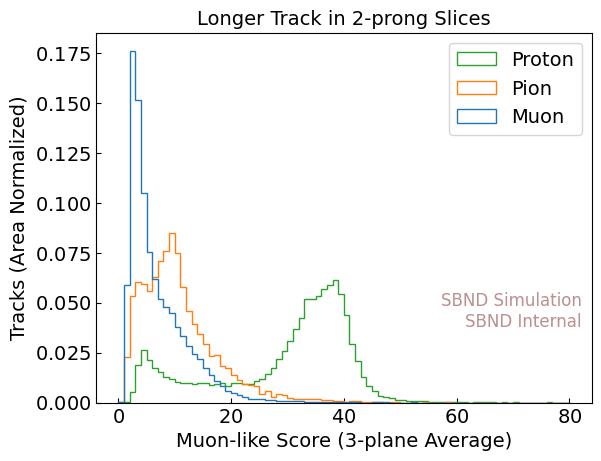

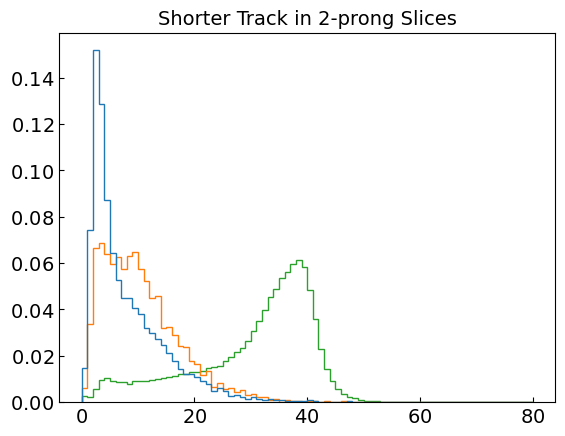

In [53]:
# mu score comparison for different true pdgs
# var_name = ("pfp", "trk", "chi2pid", "I2", "chi2_muon", "")
chi2mu_avg = avg_chi2(mc_trk_df_2prong, "chi2_muon")
bins = np.linspace(0, 80, 81)

mc_bothtracks_mu = chi2mu_avg[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13]
mc_bothtracks_pi = chi2mu_avg[np.abs(mc_trk_df_2prong.pfp.trk.truth.p.pdg) == 211]
mc_bothtracks_p = chi2mu_avg[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212]
var = [mc_bothtracks_mu, mc_bothtracks_pi, mc_bothtracks_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
plt.legend()
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Muon-like Score (3-plane Average)")
plt.ylabel("Tracks (Area Normalized)")
plt.title("Tracks in 2-prong Slices")
save_name = save_fig_dir + "/chi2mu_2prong.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

chi2mu_avg = avg_chi2(mc_track1, "chi2_muon")
mc_track1_mu = chi2mu_avg[mc_track1.pfp.trk.truth.p.pdg == 13]
mc_track1_pi = chi2mu_avg[np.abs(mc_track1.pfp.trk.truth.p.pdg) == 211]
mc_track1_p = chi2mu_avg[mc_track1.pfp.trk.truth.p.pdg == 2212]
var = [mc_track1_mu, mc_track1_pi, mc_track1_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
plt.legend()
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Muon-like Score (3-plane Average)")
plt.ylabel("Tracks (Area Normalized)")
plt.title("Longer Track in 2-prong Slices")
save_name = save_fig_dir + "/chi2mu_2prong_longer.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

chi2mu_avg = avg_chi2(mc_track2, "chi2_muon")
mc_track2_mu = chi2mu_avg[mc_track2.pfp.trk.truth.p.pdg == 13]
mc_track2_pi = chi2mu_avg[np.abs(mc_track2.pfp.trk.truth.p.pdg) == 211]
mc_track2_p = chi2mu_avg[mc_track2.pfp.trk.truth.p.pdg == 2212]
var = [mc_track2_mu, mc_track2_pi, mc_track2_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
plt.title("Shorter Track in 2-prong Slices")
save_name = save_fig_dir + "/chi2mu_2prong_shorter.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

In [54]:
# # pi score comparison for different true pdgs
# chi2pi_avg = avg_chi2(mc_trk_df_2prong, "chi2_pion")
# bins = np.linspace(0, 80, 81)

# mc_bothtracks_mu = chi2pi_avg[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13]
# mc_bothtracks_pi = chi2pi_avg[np.abs(mc_trk_df_2prong.pfp.trk.truth.p.pdg) == 211]
# mc_bothtracks_p = chi2pi_avg[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212]
# var = [mc_bothtracks_mu, mc_bothtracks_pi, mc_bothtracks_p]
# plt.hist(var, bins=bins, histtype="step", density=True, 
#          label=pdg_labels)
# plt.legend()
# plt.xlabel("Pion-like Score (3-plane Average)")
# plt.ylabel("Tracks (Area Normalized)")
# plt.title("Tracks in 2-prong Slices")
# save_name = save_fig_dir + "/chi2pi_2prong.png"
# if save_fig:
#     plt.savefig(save_name, dpi=300, bbox_inches="tight")
# plt.show()

# chi2pi_avg = avg_chi2(mc_track1, "chi2_pion")
# mc_track1_mu = chi2pi_avg[mc_track1.pfp.trk.truth.p.pdg == 13]
# mc_track1_pi = chi2pi_avg[np.abs(mc_track1.pfp.trk.truth.p.pdg) == 211]
# mc_track1_p = chi2pi_avg[mc_track1.pfp.trk.truth.p.pdg == 2212]
# var = [mc_track1_mu, mc_track1_pi, mc_track1_p]
# plt.hist(var, bins=bins, histtype="step", density=True, 
#          label=pdg_labels)
# plt.legend()
# plt.xlabel("Pion-like Score (3-plane Average)")
# plt.ylabel("Tracks (Area Normalized)")
# plt.title("Longer Track in 2-prong Slices")
# save_name = save_fig_dir + "/chi2pi_2prong_longer.png"
# if save_fig:
#     plt.savefig(save_name, dpi=300, bbox_inches="tight")
# plt.show()

# chi2pi_avg = avg_chi2(mc_track2, "chi2_pion")
# mc_track2_mu = chi2pi_avg[mc_track2.pfp.trk.truth.p.pdg == 13]
# mc_track2_pi = chi2pi_avg[np.abs(mc_track2.pfp.trk.truth.p.pdg) == 211]
# mc_track2_p = chi2pi_avg[mc_track2.pfp.trk.truth.p.pdg == 2212]
# var = [mc_track2_mu, mc_track2_pi, mc_track2_p]
# plt.hist(var, bins=bins, histtype="step", density=True, 
#          label=pdg_labels)
# plt.title("Shorter Track in 2-prong Slices")
# plt.xlabel("Pion-like Score (3-plane Average)")
# plt.ylabel("Tracks (Area Normalized)")
# save_name = save_fig_dir + "/chi2pi_2prong_shorter.png"
# if save_fig:
#     plt.savefig(save_name, dpi=300, bbox_inches="tight")
# plt.show()

In [55]:
# # pi score comparison for different true pdgs
# # var_name_1 = ("pfp", "trk", "chi2pid", "I2", "chi2_muon", "")
# # var_name_2 = ("pfp", "trk", "chi2pid", "I2", "chi2_pion", "")
# chi2mu_avg = avg_chi2(mc_trk_df_2prong, "chi2_muon")
# chi2pi_avg = avg_chi2(mc_trk_df_2prong, "chi2_pion")
# chi2ratio_avg = chi2mu_avg / chi2pi_avg
# bins = np.linspace(0, 2, 81)

# mc_bothtracks_mu = chi2ratio_avg[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13]
# mc_bothtracks_pi = chi2ratio_avg[np.abs(mc_trk_df_2prong.pfp.trk.truth.p.pdg) == 211]
# mc_bothtracks_p = chi2ratio_avg[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212]
# var = [mc_bothtracks_mu, mc_bothtracks_pi, mc_bothtracks_p]
# plt.hist(var, bins=bins, histtype="step", density=True, 
#          label=pdg_labels)
# plt.legend()
# plt.xlabel("Muon-like Score / Pion-like Score (3-plane Average)")
# plt.ylabel("Tracks (Area Normalized)")
# plt.title("Tracks in 2-prong Slices")
# save_name = save_fig_dir + "/chi2ratio_2prong.png"
# if save_fig:
#     plt.savefig(save_name, dpi=300, bbox_inches="tight")
# plt.show()

# chi2mu_avg = avg_chi2(mc_track1, "chi2_muon")
# chi2pi_avg = avg_chi2(mc_track1, "chi2_pion")
# chi2ratio_avg = chi2mu_avg / chi2pi_avg
# mc_track1_mu = chi2ratio_avg[mc_track1.pfp.trk.truth.p.pdg == 13]
# mc_track1_pi = chi2ratio_avg[np.abs(mc_track1.pfp.trk.truth.p.pdg) == 211]
# mc_track1_p = chi2ratio_avg[mc_track1.pfp.trk.truth.p.pdg == 2212]
# var = [mc_track1_mu, mc_track1_pi, mc_track1_p]
# plt.hist(var, bins=bins, histtype="step", density=True, 
#          label=pdg_labels)
# plt.legend()
# plt.xlabel("Muon-like Score / Pion-like Score (3-plane Average)")
# plt.ylabel("Tracks (Area Normalized)")
# plt.title("Longer Track in 2-prong Slices")
# save_name = save_fig_dir + "/chi2ratio_2prong_longer.png"
# if save_fig:
#     plt.savefig(save_name, dpi=300, bbox_inches="tight")
# plt.show()

# chi2mu_avg = avg_chi2(mc_track2, "chi2_muon")
# chi2pi_avg = avg_chi2(mc_track2, "chi2_pion")
# chi2ratio_avg = chi2mu_avg / chi2pi_avg
# mc_track2_mu = chi2ratio_avg[mc_track2.pfp.trk.truth.p.pdg == 13]
# mc_track2_pi = chi2ratio_avg[np.abs(mc_track2.pfp.trk.truth.p.pdg) == 211]
# mc_track2_p = chi2ratio_avg[mc_track2.pfp.trk.truth.p.pdg == 2212]
# var = [mc_track2_mu, mc_track2_pi, mc_track2_p]
# plt.hist(var, bins=bins, histtype="step", density=True, 
#          label=pdg_labels)
# plt.title("Shorter Track in 2-prong Slices")
# save_name = save_fig_dir + "/chi2ratio_2prong_shorter.png"
# if save_fig:
#     plt.savefig(save_name, dpi=300, bbox_inches="tight")
# plt.show()

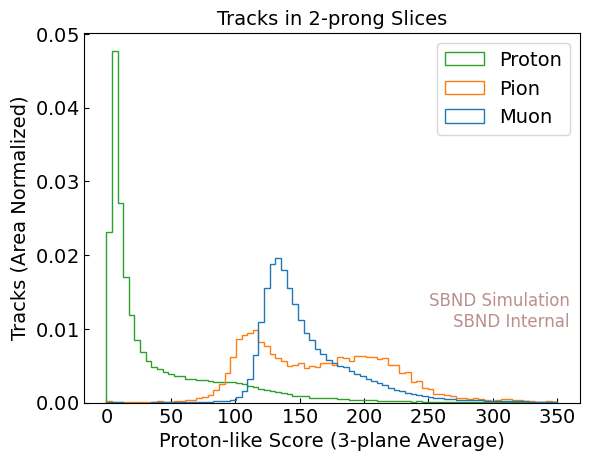

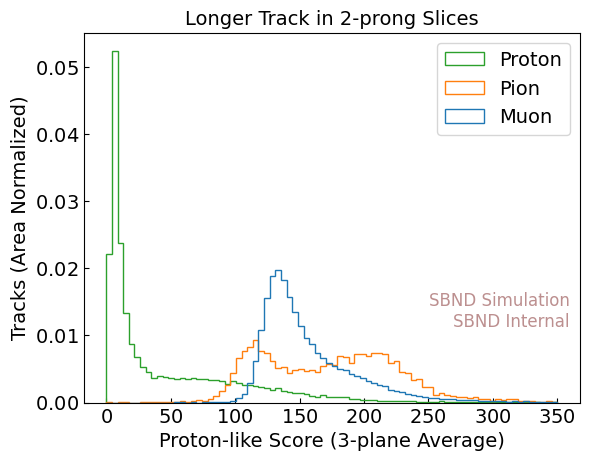

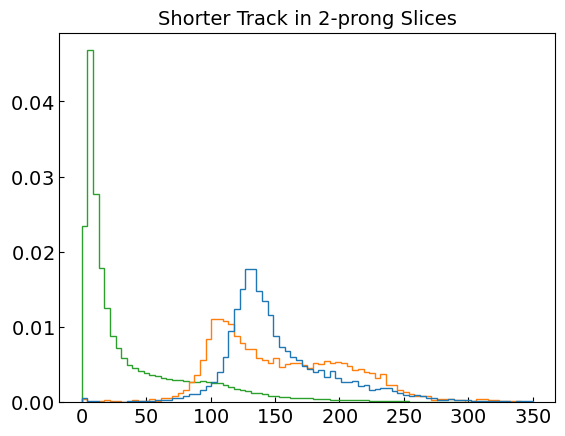

In [56]:
# proton score comparison for different true pdgs
# var_name = ("pfp", "trk", "chi2pid", "I2", "chi2_proton", "")
chi2p_avg = avg_chi2(mc_trk_df_2prong, "chi2_proton")
bins = np.linspace(0, 350, 81)
mc_bothtracks_mu = chi2p_avg[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13]
mc_bothtracks_pi = chi2p_avg[np.abs(mc_trk_df_2prong.pfp.trk.truth.p.pdg) == 211]
mc_bothtracks_p = chi2p_avg[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212]
var = [mc_bothtracks_mu, mc_bothtracks_pi, mc_bothtracks_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
plt.legend()
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Proton-like Score (3-plane Average)")
plt.ylabel("Tracks (Area Normalized)")
plt.title("Tracks in 2-prong Slices")
save_name = save_fig_dir + "/chi2p_2prong.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

chi2p_avg = avg_chi2(mc_track1, "chi2_proton")
mc_track1_mu = chi2p_avg[mc_track1.pfp.trk.truth.p.pdg == 13]
mc_track1_pi = chi2p_avg[np.abs(mc_track1.pfp.trk.truth.p.pdg) == 211]
mc_track1_p = chi2p_avg[mc_track1.pfp.trk.truth.p.pdg == 2212]
var = [mc_track1_mu, mc_track1_pi, mc_track1_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
plt.legend()
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Proton-like Score (3-plane Average)")
plt.ylabel("Tracks (Area Normalized)")
plt.title("Longer Track in 2-prong Slices")
save_name = save_fig_dir + "/chi2p_2prong_longer.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

chi2p_avg = avg_chi2(mc_track2, "chi2_proton")
mc_track2_mu = chi2p_avg[mc_track2.pfp.trk.truth.p.pdg == 13]
mc_track2_pi = chi2p_avg[np.abs(mc_track2.pfp.trk.truth.p.pdg) == 211]
mc_track2_p = chi2p_avg[mc_track2.pfp.trk.truth.p.pdg == 2212]
var = [mc_track2_mu, mc_track2_pi, mc_track2_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
plt.title("Shorter Track in 2-prong Slices")
save_name = save_fig_dir + "/chi2p_2prong_shorter.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

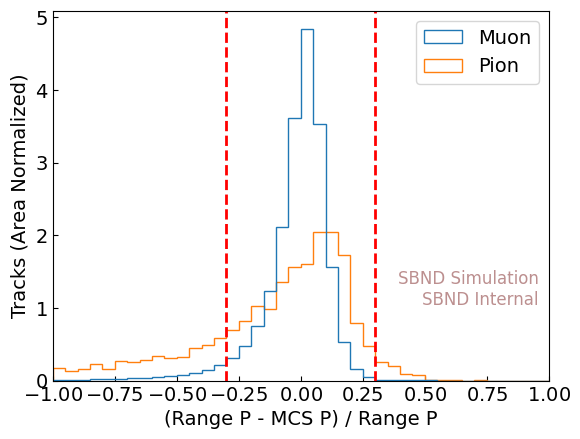

In [57]:
bins = np.linspace(-1, 1, 41)
mu_candidate_mu = mc_mu_candidates_prequal[mc_mu_candidates_prequal.pfp.trk.truth.p.pdg == 13]
mu_candidate_pi = mc_mu_candidates_prequal[np.abs(mc_mu_candidates_prequal.pfp.trk.truth.p.pdg) == 211]
var = [(mu_candidate_mu.pfp.trk.rangeP.p_muon - mu_candidate_mu.pfp.trk.mcsP.fwdP_muon) / mu_candidate_mu.pfp.trk.rangeP.p_muon,
       (mu_candidate_pi.pfp.trk.rangeP.p_muon - mu_candidate_pi.pfp.trk.mcsP.fwdP_muon) / mu_candidate_pi.pfp.trk.rangeP.p_muon]
plt.hist(var, bins=np.linspace(-1, 1, 41), histtype="step", density=True, label=["Muon", "Pion"])
plt.axvline(-qual_th, color="red", linestyle="--")
plt.axvline(qual_th, color="red", linestyle="--")
plt.xlabel("(Range P - MCS P) / Range P")
plt.ylabel("Tracks (Area Normalized)")
plt.xlim(bins[0], bins[-1])

# flip legend order
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1])
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')

save_name = save_fig_dir + "/mu_quality_cut_mcs.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

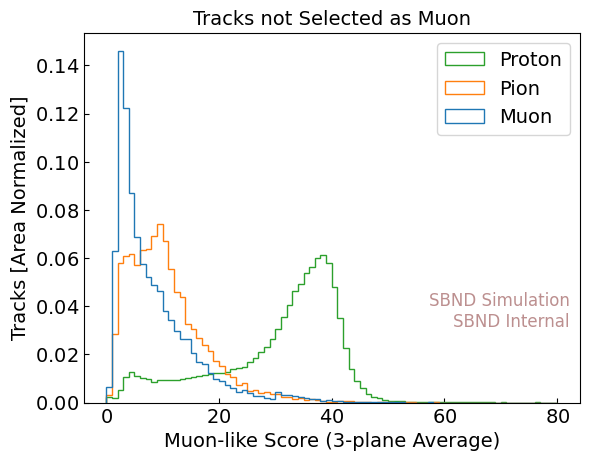

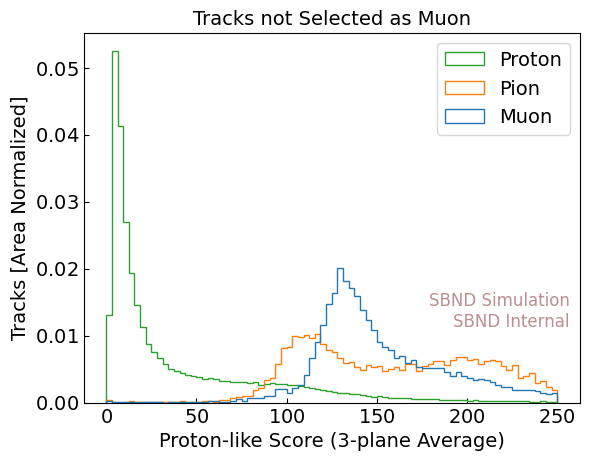

In [58]:
# var_name = ("pfp", "trk", "chi2pid", "I2", "chi2_muon", "")
chi2mu_avg = avg_chi2(mc_not_mu_candidate, "chi2_muon")
bins = np.linspace(0, 80, 81)

mc_bothtracks_mu = chi2mu_avg[mc_not_mu_candidate.pfp.trk.truth.p.pdg == 13]
mc_bothtracks_pi = chi2mu_avg[np.abs(mc_not_mu_candidate.pfp.trk.truth.p.pdg) == 211]
mc_bothtracks_p = chi2mu_avg[mc_not_mu_candidate.pfp.trk.truth.p.pdg == 2212]
var = [mc_bothtracks_mu, mc_bothtracks_pi, mc_bothtracks_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
plt.legend()
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Muon-like Score (3-plane Average)")
plt.ylabel("Tracks [Area Normalized]")
plt.title("Tracks not Selected as Muon")
save_name = save_fig_dir + "/chi2mu_nonmuon.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

# var_name = ("pfp", "trk", "chi2pid", "I2", "chi2_proton", "")
chi2p_avg = avg_chi2(mc_not_mu_candidate, "chi2_proton")
bins = np.linspace(0, 250, 81)

mc_bothtracks_mu = chi2p_avg[mc_not_mu_candidate.pfp.trk.truth.p.pdg == 13]
mc_bothtracks_pi = chi2p_avg[np.abs(mc_not_mu_candidate.pfp.trk.truth.p.pdg) == 211]
mc_bothtracks_p = chi2p_avg[mc_not_mu_candidate.pfp.trk.truth.p.pdg == 2212]
var = [mc_bothtracks_mu, mc_bothtracks_pi, mc_bothtracks_p]
plt.hist(var, bins=bins, histtype="step", density=True, 
         label=pdg_labels)
plt.legend()
plt.text(0.98, 0.3, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='right', va='top')
plt.xlabel("Proton-like Score (3-plane Average)")
plt.ylabel("Tracks [Area Normalized]")
plt.title("Tracks not Selected as Muon")
save_name = save_fig_dir + "/chi2p_nonmuon.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

# Is there room left for more purity with existing tools?

In [59]:
mc_mu_df = mc_mu_df.reset_index(level=[3])
mc_p_df = mc_p_df.reset_index(level=[3])

data_mu_df = data_mu_df.reset_index(level=[3])
data_p_df = data_p_df.reset_index(level=[3])

intime_mu_df = intime_mu_df.reset_index(level=[3])
intime_p_df = intime_p_df.reset_index(level=[3])


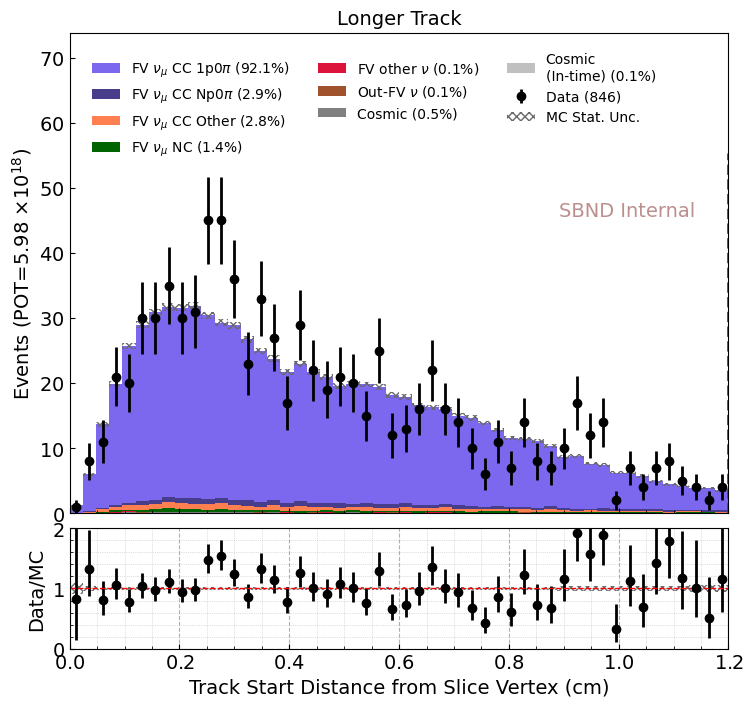

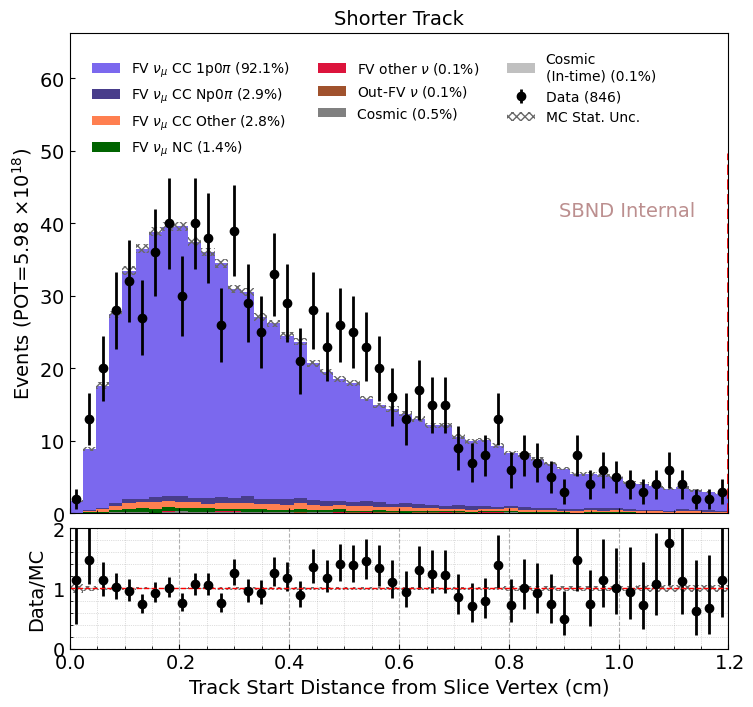

In [60]:
plot_type = "topology"
bins = np.linspace(0, 1.2, 51)
vline = [1.2]

evtdf = mc_evt_df_mup
vardf = mag3d(mc_evt_df_mup.t1.pfp.trk.start, mc_evt_df_mup.slc.vertex)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = mag3d(data_evt_df_mup.t1.pfp.trk.start, data_evt_df_mup.slc.vertex)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = mag3d(intime_evt_df_mup.t1.pfp.trk.start, intime_evt_df_mup.slc.vertex)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Track Start Distance from Slice Vertex (cm)", 
               "Events (POT={})".format(pot_str), "Longer Track"]

save_name = save_fig_dir + "/start_vertex_dist_{}_t1_postsel.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)


evtdf = mc_evt_df_mup
vardf = mag3d(mc_evt_df_mup.t2.pfp.trk.start, mc_evt_df_mup.slc.vertex)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = mag3d(data_evt_df_mup.t2.pfp.trk.start, data_evt_df_mup.slc.vertex)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = mag3d(intime_evt_df_mup.t2.pfp.trk.start, intime_evt_df_mup.slc.vertex)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["Track Start Distance from Slice Vertex (cm)", 
               "Events (POT={})".format(pot_str), "Shorter Track"]

save_name = save_fig_dir + "/start_vertex_dist_{}_t2_postsel.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

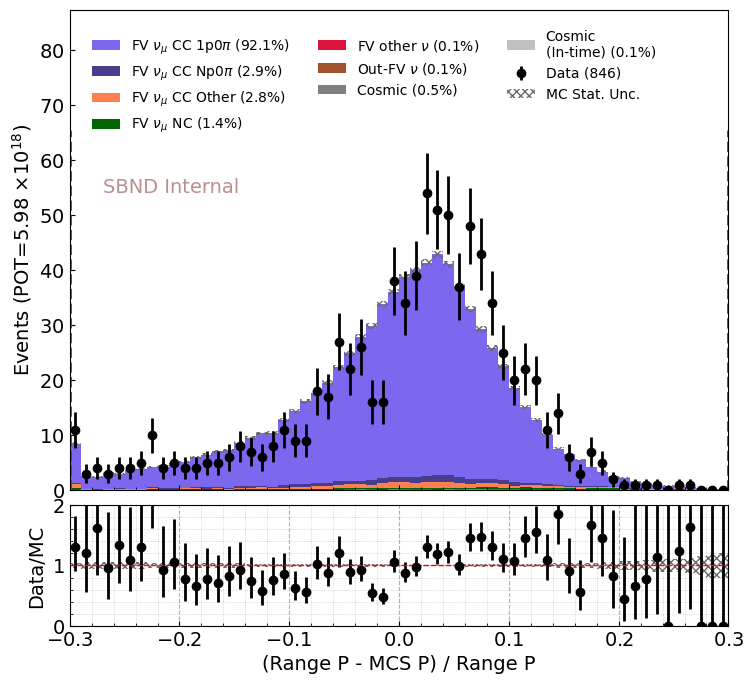

/tmp/ipykernel_44133/4071213569.py:137: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_44133/4071213569.py:138: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_44133/4071213569.py:156: RuntimeWarning: invalid value encountered in divide
  data_ratio = total_data / total_mc
/tmp/ipykernel_44133/4071213569.py:157: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_44133/4071213569.py:158: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/munjung/xsec/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_base.py:2982: RuntimeWarning: overflow encountered in scalar subtract
  delta = (x1t - x0t) * margin


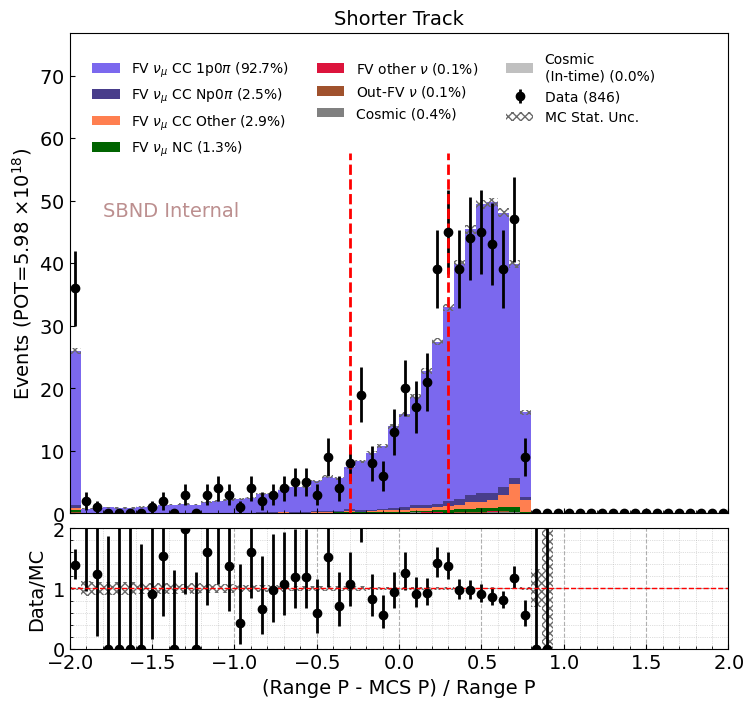

In [61]:
def range_p_mcs_p_proton(df):
    frac_diff = (df.pfp.trk.rangeP.p_proton - df.pfp.trk.mcsP.fwdP_proton) / df.pfp.trk.rangeP.p_proton
    return frac_diff

# --- shorter track ---
plot_type = "topology"
bins = np.linspace(-0.3, 0.3, 61)
vline = [-0.3, 0.3]
evtdf = mc_evt_df_mup

vardf = range_p_mcs_p(mc_evt_df_mup.t1)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = range_p_mcs_p(data_evt_df_mup.t1)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = range_p_mcs_p(intime_evt_df_mup.t1)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["(Range P - MCS P) / Range P", 
               "Events (POT={})".format(pot_str), ""]

save_name = save_fig_dir + "/range_p_mcs_p_{}_t1.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

bins = np.linspace(-2, 2, 61)
vardf = range_p_mcs_p_proton(mc_evt_df_mup.t2)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = range_p_mcs_p_proton(data_evt_df_mup.t2)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = range_p_mcs_p_proton(intime_evt_df_mup.t2)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = ["(Range P - MCS P) / Range P", 
               "Events (POT={})".format(pot_str), "Shorter Track"]

save_name = save_fig_dir + "/range_p_mcs_p_{}_t2_postsel.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)

## Efficiency

In [62]:
import statsmodels.api as sm

def eff_err(success,total):  # success/total
    err = [[],[]]
    eff = success/total
    for i in range(len(success)):
        this_success = success[i]
        this_tot = total[i]
        interval = sm.stats.proportion_confint(this_success,this_tot,method='wilson')
        err[0].append(abs(eff[i]-interval[0]))
        err[1].append(abs(eff[i]-interval[1]))
    return err

In [63]:
save_fig

True

/tmp/ipykernel_44133/4169216700.py:5: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_precut = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13][var_name]
/tmp/ipykernel_44133/4169216700.py:6: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut_prepcut = mc_mu_candidate_nopcut[mc_mu_candidate_nopcut.pfp.trk.truth.p.pdg == 13][var_name]
/tmp/ipykernel_44133/4169216700.py:7: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut = mc_mu_candidate[mc_mu_candidate.pfp.trk.truth.p.pdg == 13][var_name]
/tmp/ipykernel_44133/4169216700.py:8: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut_all = mc_mu_candidate[var_name]
/tmp/ipykernel_44133/4169216700.py:21: RuntimeWarning: invalid value encountered in divide
  eff = n_postcut / n_precut
/tmp/ipykernel_44133/1252807043.py:5: RuntimeWarning: invalid value encountered in divide
  eff = success/total
/exp

threshold:  0.22499999999999998


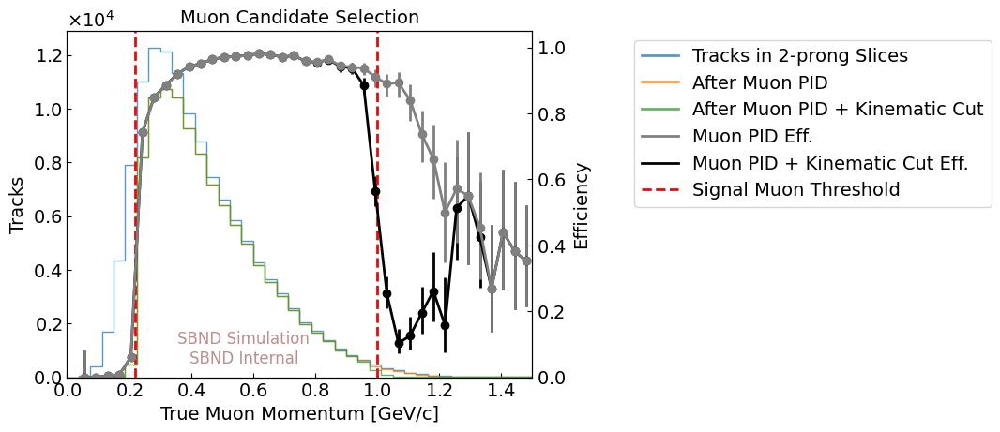

---- muon candidate selection ----
integrated efficiency: 0.81
integrated purity: 0.94
threshold:  0.3


/tmp/ipykernel_44133/4169216700.py:67: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_precut = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212][var_name]
/tmp/ipykernel_44133/4169216700.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut_prepcut = mc_p_candidates_nopcut[mc_p_candidates_nopcut.pfp.trk.truth.p.pdg == 2212][var_name]
/tmp/ipykernel_44133/4169216700.py:69: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut = mc_p_candidates[mc_p_candidates.pfp.trk.truth.p.pdg == 2212][var_name]
/tmp/ipykernel_44133/4169216700.py:70: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut_all = mc_p_candidates[var_name]
/tmp/ipykernel_44133/4169216700.py:83: RuntimeWarning: invalid value encountered in divide
  eff = n_postcut / n_precut
/tmp/ipykernel_44133/4169216700.py:84: RuntimeWarning: invalid value encountered in divide
  eff_prepcut =

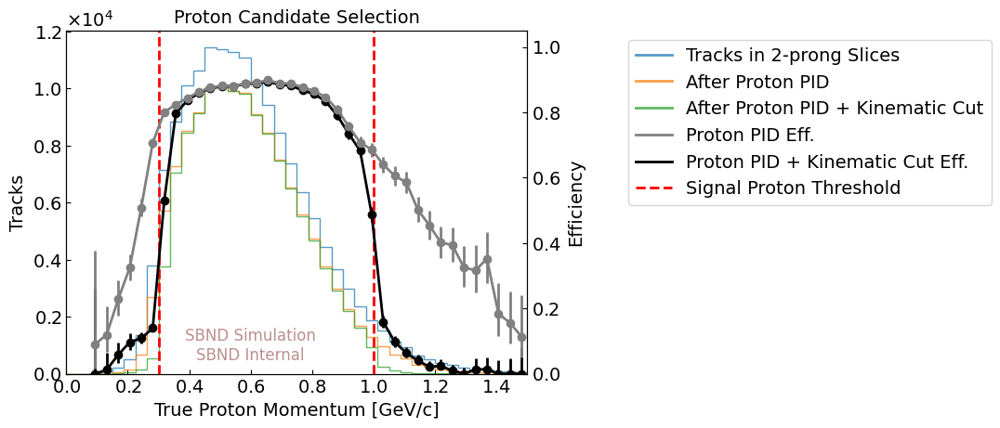

---- proton candidate selection ----
integrated efficiency: 0.78
integrated purity: 0.99
threshold:  0.275


/tmp/ipykernel_44133/4169216700.py:125: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_precut = mc_trk_df_2prong[np.abs(mc_trk_df_2prong.pfp.trk.truth.p.pdg) == 211][var_name]
/tmp/ipykernel_44133/4169216700.py:127: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut = both_candidates[np.abs(both_candidates.pfp.trk.truth.p.pdg) == 211][var_name]
/tmp/ipykernel_44133/4169216700.py:128: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut_all = both_candidates[var_name]
/tmp/ipykernel_44133/4169216700.py:141: RuntimeWarning: invalid value encountered in divide
  eff = n_postcut / n_precut
/tmp/ipykernel_44133/4169216700.py:142: RuntimeWarning: invalid value encountered in divide
  pur = n_postcut / n_postcut_all


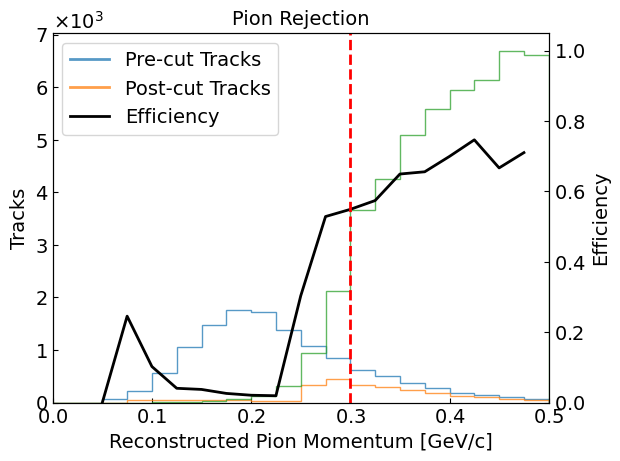

---- pion rejection ----
integrated efficiency: 0.20
integrated purity: 0.01


In [64]:
fig, ax = plt.subplots()
# var_name = ("pfp", "trk", "rangeP", "p_muon")
var_name = ("pfp", "trk", "truth", "p", "totp")
bins = np.linspace(0, 1.5, 41)
var_precut = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 13][var_name]
var_postcut_prepcut = mc_mu_candidate_nopcut[mc_mu_candidate_nopcut.pfp.trk.truth.p.pdg == 13][var_name]
var_postcut = mc_mu_candidate[mc_mu_candidate.pfp.trk.truth.p.pdg == 13][var_name]
var_postcut_all = mc_mu_candidate[var_name]
n_precut, _, _ = ax.hist(var_precut, bins=bins, histtype="step", alpha=0.75)
n_postcut_prepcut, _, _ = ax.hist(var_postcut_prepcut, bins=bins, histtype="step", alpha=0.75)
n_postcut, _, _ = ax.hist(var_postcut, bins=bins, histtype="step", alpha=0.75)
n_postcut_all, _ = np.histogram(var_postcut_all, bins=bins)
ax.set_xlabel("True Muon Momentum [GeV/c]")
ax.set_ylabel("Tracks")

ax_eff = ax.twinx()
n_postcut = np.array(n_postcut)
n_precut = np.array(n_precut)
n_postcut_prepcut = np.array(n_postcut_prepcut)
n_postcut_all = np.array(n_postcut_all)
eff = n_postcut / n_precut
eff_errval = eff_err(n_postcut, n_precut)
eff_prepcut = n_postcut_prepcut / n_precut
eff_prepcut_errval = eff_err(n_postcut_prepcut, n_precut)
pur = n_postcut / n_postcut_all
bin_centers = (bins[:-1] + bins[1:])/2
# ax_eff.plot(bin_centers, eff, color="k")
ax_eff.errorbar(bin_centers, eff, yerr=eff_errval, fmt="o-", color="k")
# ax_eff.plot(bin_centers, eff_prepcut, color="gray")
ax_eff.errorbar(bin_centers, eff_prepcut, yerr=eff_prepcut_errval, fmt="o-", color="gray")
eff_threshold = bins[np.where(eff > 0.5)[0][0]]
print("threshold: ", eff_threshold)
ax_eff.axvline(0.22, color="red", linestyle="--")
ax_eff.axvline(1, color="red", linestyle="--")
# ax_eff.text(eff_threshold, 0.5, "50% Threshold={:.2f}".format(eff_threshold), color="red", fontsize=12)

ax_eff.set_ylabel("Efficiency")
ax_eff.set_ylim(0, 1.05)
plt.xlim(bins[0], bins[-1])

# legend using dummies
plt.plot([], [], label="Tracks in 2-prong Slices", alpha=0.75, color="C0")
plt.plot([], [], label="After Muon PID", alpha=0.75, color="C1")
plt.plot([], [], label="After Muon PID + Kinematic Cut", alpha=0.75, color="C2")
plt.plot([], [], label="Muon PID Eff.", color="gray")
plt.plot([], [], label="Muon PID + Kinematic Cut Eff.", color="k")
plt.plot([], [], label="Signal Muon Threshold", color="red", linestyle="--")
plt.legend(bbox_to_anchor=(1.2, 1), loc='upper left')
plt.text(0.38, 0.03, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='center', va='bottom')
plt.title("Muon Candidate Selection")


save_name = save_fig_dir + "/muon_candidate_selection_eff.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

print("---- muon candidate selection ----")
print("integrated efficiency: {:.2f}".format(n_postcut.sum() / n_precut.sum()))
print("integrated purity: {:.2f}".format(n_postcut.sum() / len(mc_mu_candidate)))


fig, ax = plt.subplots()
# var_name = ("pfp", "trk", "rangeP", "p_proton")
var_name = ("pfp", "trk", "truth", "p", "totp")
var_precut = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212][var_name]
var_postcut_prepcut = mc_p_candidates_nopcut[mc_p_candidates_nopcut.pfp.trk.truth.p.pdg == 2212][var_name]
var_postcut = mc_p_candidates[mc_p_candidates.pfp.trk.truth.p.pdg == 2212][var_name]
var_postcut_all = mc_p_candidates[var_name]
n_precut, _, _ = ax.hist(var_precut, bins=bins, histtype="step", alpha=0.75)
n_postcut_prepcut, _, _ = ax.hist(var_postcut_prepcut, bins=bins, histtype="step", alpha=0.75)
n_postcut, _, _ = ax.hist(var_postcut, bins=bins, histtype="step", alpha=0.75)
n_postcut_all, _ = np.histogram(var_postcut_all, bins=bins)
ax.set_xlabel("True Proton Momentum [GeV/c]")
ax.set_ylabel("Tracks")

ax_eff = ax.twinx()
n_postcut = np.array(n_postcut)
n_precut = np.array(n_precut)
n_postcut_prepcut = np.array(n_postcut_prepcut)
n_postcut_all = np.array(n_postcut_all)
eff = n_postcut / n_precut
eff_prepcut = n_postcut_prepcut / n_precut
pur = n_postcut / n_postcut_all
bin_centers = (bins[:-1] + bins[1:])/2
eff_errval = eff_err(n_postcut, n_precut)
eff_prepcut_errval = eff_err(n_postcut_prepcut, n_precut)
ax_eff.errorbar(bin_centers, eff, yerr=eff_errval, fmt="o-", color="k")
ax_eff.errorbar(bin_centers, eff_prepcut, yerr=eff_prepcut_errval, fmt="o-", color="gray")
eff_threshold = bins[np.where(eff > 0.5)[0][0]]
print("threshold: ", eff_threshold)
ax_eff.axvline(0.3, color="red", linestyle="--")
ax_eff.axvline(1, color="red", linestyle="--")

ax_eff.set_ylabel("Efficiency")
ax_eff.set_ylim(0, 1.05)

plt.xlim(bins[0], bins[-1])

# legend using dummies
plt.plot([], [], label="Tracks in 2-prong Slices", alpha=0.75, color="C0")
plt.plot([], [], label="After Proton PID", alpha=0.75, color="C1")
plt.plot([], [], label="After Proton PID + Kinematic Cut", alpha=0.75, color="C2")
plt.plot([], [], label="Proton PID Eff.", color="gray")
plt.plot([], [], label="Proton PID + Kinematic Cut Eff.", color="k")
plt.plot([], [], label="Signal Proton Threshold", color="red", linestyle="--")
plt.legend(bbox_to_anchor=(1.2, 1), loc='upper left')
plt.text(0.4, 0.03, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='center', va='bottom')
plt.title("Proton Candidate Selection")

save_name = save_fig_dir + "/proton_candidate_selection_eff.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

print("---- proton candidate selection ----")
print("integrated efficiency: {:.2f}".format(n_postcut.sum() / n_precut.sum()))
print("integrated purity: {:.2f}".format(n_postcut.sum() / len(mc_p_candidates)))

fig, ax = plt.subplots()
var_name = ("pfp", "trk", "rangeP", "p_pion")
bins = np.linspace(0, 0.5, 21)
var_precut = mc_trk_df_2prong[np.abs(mc_trk_df_2prong.pfp.trk.truth.p.pdg) == 211][var_name]
both_candidates = pd.concat([mc_p_candidates, mc_mu_candidate])
var_postcut = both_candidates[np.abs(both_candidates.pfp.trk.truth.p.pdg) == 211][var_name]
var_postcut_all = both_candidates[var_name]
n_precut, _, _ = ax.hist(var_precut, bins=bins, histtype="step", alpha=0.75)
n_postcut, _, _ = ax.hist(var_postcut, bins=bins, histtype="step", alpha=0.75)
n_postcut_prepcut, _, _ = ax.hist(var_postcut_prepcut, bins=bins, histtype="step", alpha=0.75)
n_postcut_all, _ = np.histogram(var_postcut_all, bins=bins)
ax.set_xlabel("Reconstructed Pion Momentum [GeV/c]")
ax.set_ylabel("Tracks")

ax_eff = ax.twinx()
n_postcut = np.array(n_postcut)
n_precut = np.array(n_precut)
n_postcut_prepcut = np.array(n_postcut_prepcut)
n_postcut_all = np.array(n_postcut_all)
eff = n_postcut / n_precut
pur = n_postcut / n_postcut_all
ax_eff.plot(bins[:-1], eff, color="k")
# ax_eff.plot(bins[:-1], pur, color="gray", linestyle="--")
eff_threshold = bins[np.where(eff > 0.5)[0][0]]
# ax_eff.axhline(0.5, color="red", linestyle="--")
# ax_eff.text(eff_threshold, 0.5, "Efficiency > 0.5", color="red", fontsize=12)
print("threshold: ", eff_threshold)
ax_eff.axvline(0.3, color="red", linestyle="--")
ax_eff.axvline(1, color="red", linestyle="--")
# ax_eff.text(eff_threshold, 0.5, "50% Threshold={:.2f}".format(eff_threshold), color="red", fontsize=12)

ax_eff.set_ylabel("Efficiency")
ax_eff.set_ylim(0, 1.05)

plt.xlim(bins[0], bins[-1])

# legend using dummies
plt.plot([], [], label="Pre-cut Tracks", alpha=0.75, color="C0")
plt.plot([], [], label="Post-cut Tracks", alpha=0.75, color="C1")
plt.plot([], [], label="Efficiency", color="k")
plt.legend()
plt.title("Pion Rejection")

save_name = save_fig_dir + "/pion_rejection_eff.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

print("---- pion rejection ----")
print("integrated efficiency: {:.2f}".format(n_postcut.sum() / n_precut.sum()))
print("integrated purity: {:.2f}".format(n_postcut.sum() / len(both_candidates)))

/tmp/ipykernel_44133/2619433114.py:4: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_precut = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212][var_name]
/tmp/ipykernel_44133/2619433114.py:5: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut_prepcut = mc_p_candidates_nopcut[mc_p_candidates_nopcut.pfp.trk.truth.p.pdg == 2212][var_name]
/tmp/ipykernel_44133/2619433114.py:6: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut = mc_p_candidates[mc_p_candidates.pfp.trk.truth.p.pdg == 2212][var_name]
/tmp/ipykernel_44133/2619433114.py:7: PerformanceWarning: indexing past lexsort depth may impact performance.
  var_postcut_all = mc_p_candidates[var_name]


threshold:  -1.0


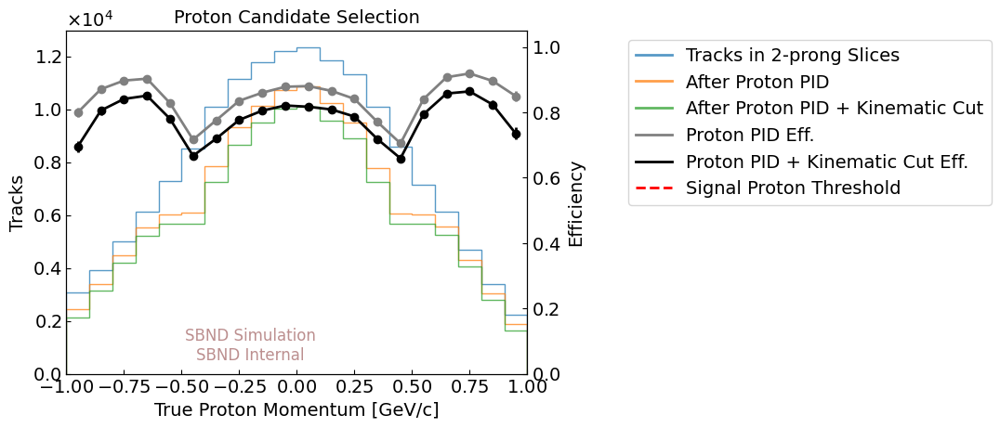

In [65]:
fig, ax = plt.subplots()
var_name = ("pfp", "trk", "truth", "p", "dir", "y")
bins = np.linspace(-1, 1, 21)
var_precut = mc_trk_df_2prong[mc_trk_df_2prong.pfp.trk.truth.p.pdg == 2212][var_name]
var_postcut_prepcut = mc_p_candidates_nopcut[mc_p_candidates_nopcut.pfp.trk.truth.p.pdg == 2212][var_name]
var_postcut = mc_p_candidates[mc_p_candidates.pfp.trk.truth.p.pdg == 2212][var_name]
var_postcut_all = mc_p_candidates[var_name]
n_precut, _, _ = ax.hist(var_precut, bins=bins, histtype="step", alpha=0.75)
n_postcut_prepcut, _, _ = ax.hist(var_postcut_prepcut, bins=bins, histtype="step", alpha=0.75)
n_postcut, _, _ = ax.hist(var_postcut, bins=bins, histtype="step", alpha=0.75)
n_postcut_all, _ = np.histogram(var_postcut_all, bins=bins)
ax.set_xlabel("True Proton Momentum [GeV/c]")
ax.set_ylabel("Tracks")

ax_eff = ax.twinx()
n_postcut = np.array(n_postcut)
n_precut = np.array(n_precut)
n_postcut_prepcut = np.array(n_postcut_prepcut)
n_postcut_all = np.array(n_postcut_all)
eff = n_postcut / n_precut
eff_prepcut = n_postcut_prepcut / n_precut
pur = n_postcut / n_postcut_all
bin_centers = (bins[:-1] + bins[1:])/2
eff_errval = eff_err(n_postcut, n_precut)
eff_prepcut_errval = eff_err(n_postcut_prepcut, n_precut)
ax_eff.errorbar(bin_centers, eff, yerr=eff_errval, fmt="o-", color="k")
ax_eff.errorbar(bin_centers, eff_prepcut, yerr=eff_prepcut_errval, fmt="o-", color="gray")
eff_threshold = bins[np.where(eff > 0.5)[0][0]]
print("threshold: ", eff_threshold)
# ax_eff.axvline(0.3, color="red", linestyle="--")
# ax_eff.axvline(1, color="red", linestyle="--")

ax_eff.set_ylabel("Efficiency")
ax_eff.set_ylim(0, 1.05)

plt.xlim(bins[0], bins[-1])

# legend using dummies
plt.plot([], [], label="Tracks in 2-prong Slices", alpha=0.75, color="C0")
plt.plot([], [], label="After Proton PID", alpha=0.75, color="C1")
plt.plot([], [], label="After Proton PID + Kinematic Cut", alpha=0.75, color="C2")
plt.plot([], [], label="Proton PID Eff.", color="gray")
plt.plot([], [], label="Proton PID + Kinematic Cut Eff.", color="k")
plt.plot([], [], label="Signal Proton Threshold", color="red", linestyle="--")
plt.legend(bbox_to_anchor=(1.2, 1), loc='upper left')
plt.text(0.4, 0.03, "SBND Simulation\nSBND Internal", transform=plt.gca().transAxes, 
         fontsize=12, color='rosybrown', ha='center', va='bottom')
plt.title("Proton Candidate Selection")

save_name = save_fig_dir + "/proton_candidate_selection_eff_dir_y.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()


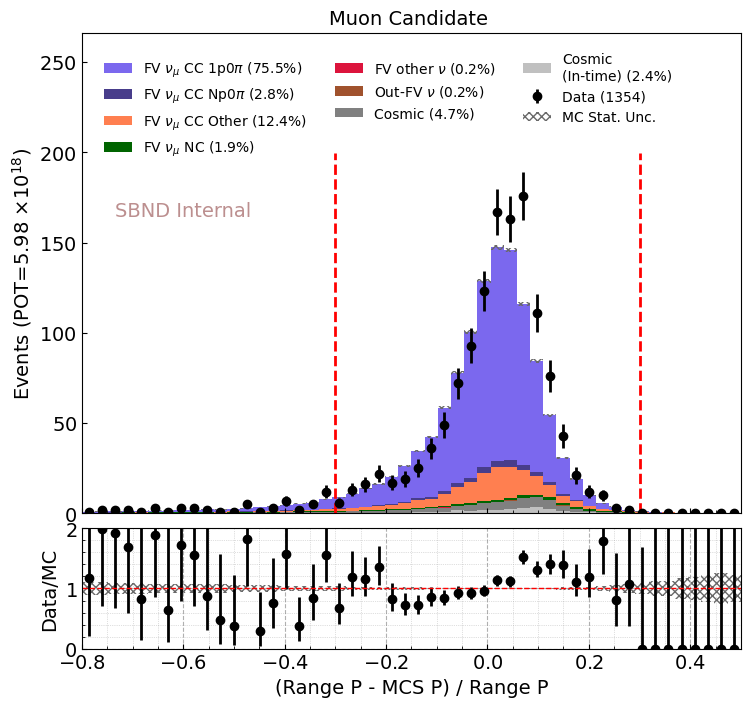

In [66]:
# --- muon candidate ---
plot_type = "topology"
bins = np.linspace(-0.8, 0.5, 51)
vline = [-qual_th, qual_th]
evtdf = mc_evt_df_2prong.loc[mc_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0).index]


vardf = range_p_mcs_p(mc_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0))
vardf_data = range_p_mcs_p(data_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0))
vardf_intime = range_p_mcs_p(intime_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0))
plot_labels = ["(Range P - MCS P) / Range P", 
               "Events (POT={})".format(pot_str), "Muon Candidate "]

save_name = save_fig_dir + "/range_p_mcs_p_{}_mu_candidate.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins,
                          plot_labels,
                          vline=vline,
                          save_fig=save_fig, save_name=save_name)


# plot_type = "topology"
# bins = np.linspace(0.3, 1.3, 51)
# vline = [1]
# evtdf = mc_evt_df_2prong.loc[mc_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0).index]

# vardf = avg_chi2(mc_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0), "chi2_muon") / avg_chi2(mc_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0), "chi2_pion")
# vardf_data = avg_chi2(data_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0), "chi2_muon") / avg_chi2(data_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0), "chi2_pion")
# vardf_intime = avg_chi2(intime_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0), "chi2_muon") / avg_chi2(intime_mu_candidates_prequal.groupby(level=[0,1,2]).nth(0), "chi2_pion")
# plot_labels = ["Muon-like Score / Pion-like Score", 
#                "Events (POT={})".format(pot_str), "Muon Candidate "]

# save_name = save_fig_dir + "/chi2muon_pion_{}_mu_candidate.png".format(plot_type)
# ret_hist_topo = hist_plot(plot_type,
#                           evtdf, vardf, 
#                           vardf_data, vardf_intime,
#                           bins,
#                           plot_labels,
#                           vline=vline,
#                           save_fig=save_fig, save_name=save_name)

# Results

In [67]:
save_fig_dir


'/exp/sbnd/data/users/munjung/plots/numucc1p0pi/2prong_variables'

In [68]:
eps = 1e-8

## data vs. MC of measurement variables

In [69]:
save_fig = True
save_fig_dir = "/exp/sbnd/data/users/munjung/plots/numucc1p0pi/selected_variables"

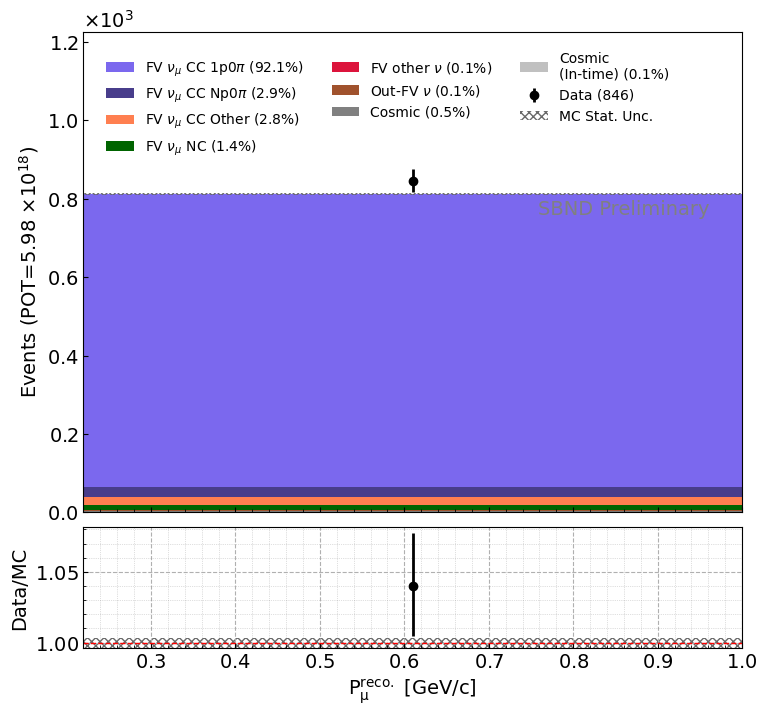

numu NC 1122


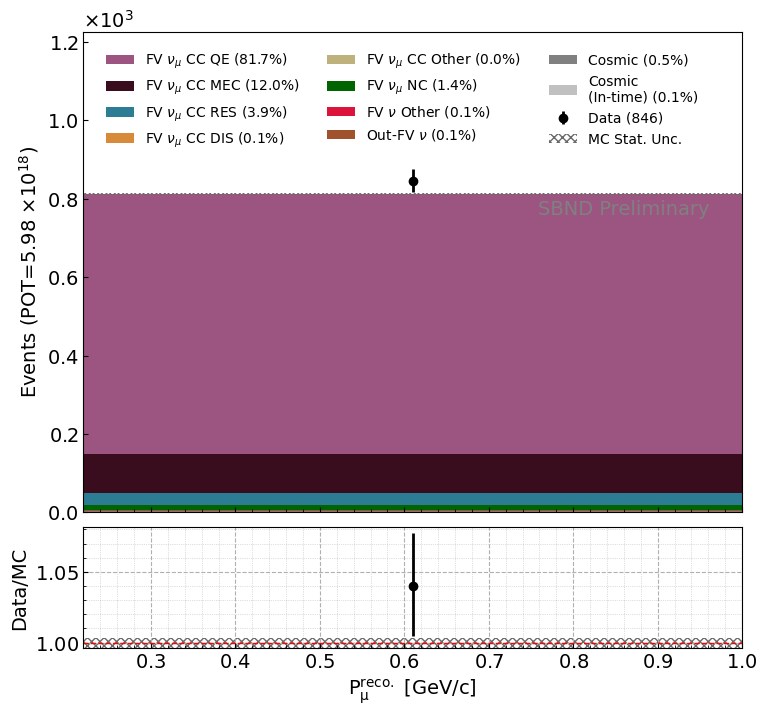

numu NC 1122


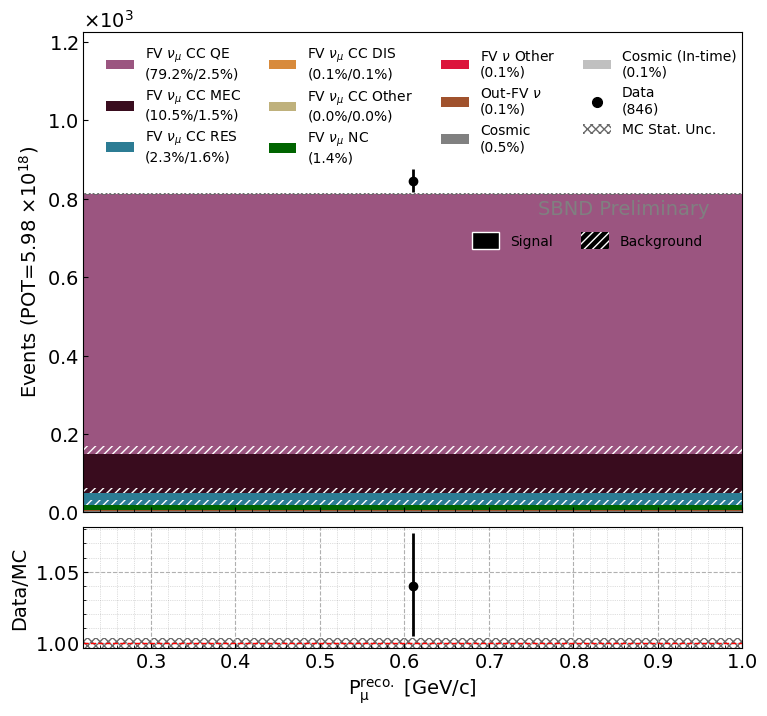

In [70]:
# single bin
var_config = VariableConfig.muon_momentum()
evtdf = mc_evt_df_mup
vardf = mc_mu_df.pfp.trk.rangeP.p_muon
vardf_data = data_mu_df.pfp.trk.rangeP.p_muon
vardf_intime = intime_mu_df.pfp.trk.rangeP.p_muon
bins = np.array([var_config.bins[0], var_config.bins[-1]])
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)

# plot
plot_labels = [var_config.var_labels[1], 
               "Events (POT={})".format(pot_str), ""]

approval = "preliminary"

plot_type = "topology"
save_name = save_fig_dir + "/single_bin_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/single_bin_{}.png".format(plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie_signal_bkgd"
save_name = save_fig_dir + "/single_bin_{}.png".format(plot_type)
ret_hist_genie = hist_plot_genie_sb(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

In [71]:
print(len(genie_mode_list))
print(len(genie_mode_colors))

9
9


/exp/sbnd/app/users/munjung/xsec/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6973: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/exp/sbnd/app/users/munjung/xsec/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:6974: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


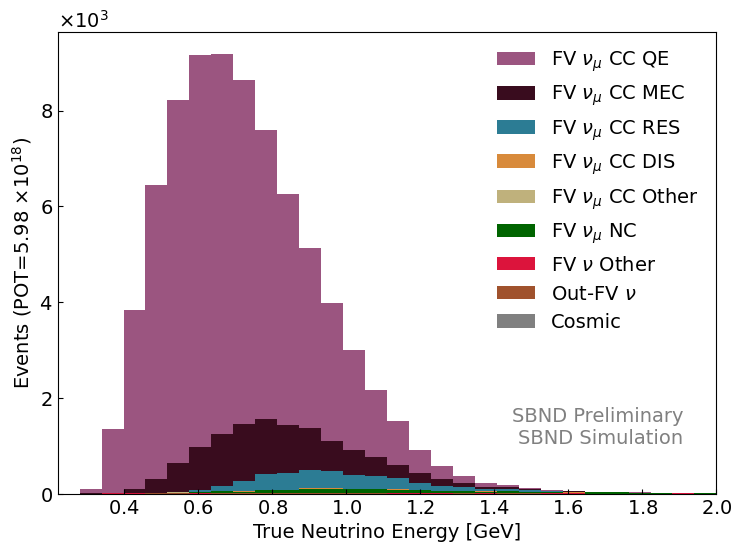

In [72]:
ncateg = 9
labels = genie_labels
colors = genie_colors

fig, axs = plt.subplots(figsize=(8.5, 6))
evtdf = mc_evt_df_mup
cut_cosmic = IsCosmic(evtdf)
cut_nu_outfv = IsNuOutFV(evtdf)
cut_nu_infv_nu_other = IsNuInFV_NuOther(evtdf)
cut_nu_infv_numu_nc = IsNuInFV_NumuNC(evtdf)
# cut_nu_infv_numu_coh = IsNuInFV_NumuCC_COH(evtdf)
cut_nu_infv_numu_othermode = IsNuInFV_NumuCC_OtherMode(evtdf)
cut_nu_infv_numu_cc_dis = IsNuInFV_NumuCC_DIS(evtdf)
cut_nu_infv_numu_cc_res = IsNuInFV_NumuCC_RES(evtdf)
cut_nu_infv_numu_cc_me = IsNuInFV_NumuCC_MEC(evtdf)
cut_nu_infv_numu_cc_qe = IsNuInFV_NumuCC_QE(evtdf)
cuts = [cut_cosmic, cut_nu_outfv, cut_nu_infv_nu_other, cut_nu_infv_numu_nc, 
        cut_nu_infv_numu_othermode, cut_nu_infv_numu_cc_dis, cut_nu_infv_numu_cc_res, 
        cut_nu_infv_numu_cc_me, cut_nu_infv_numu_cc_qe]

var = [mc_evt_df_mup[c].E for c in cuts]
plt.hist(var, bins=np.linspace(0.22,2,31), color=genie_mode_colors[::-1], stacked=True, label=genie_labels)
plt.xlim(0.22, 2)
plt.xlabel("True Neutrino Energy [GeV]")
plt.ylabel("Events (POT={})".format(pot_str))
plt.text(0.95, 0.1, "SBND Preliminary\nSBND Simulation", transform=plt.gca().transAxes, 
         fontsize=14, color='gray', ha='right', va='bottom')
plt.legend(reverse=True, frameon=False)
if save_fig:
    plt.savefig(save_fig_dir + "/neutrino_energy_distribution.png", dpi=300, bbox_inches="tight")
plt.show();

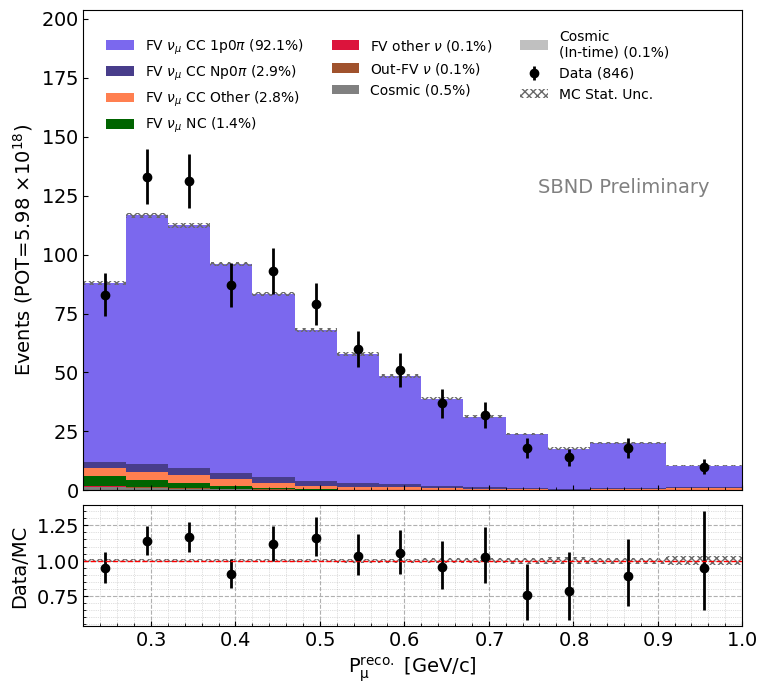

numu NC 1122


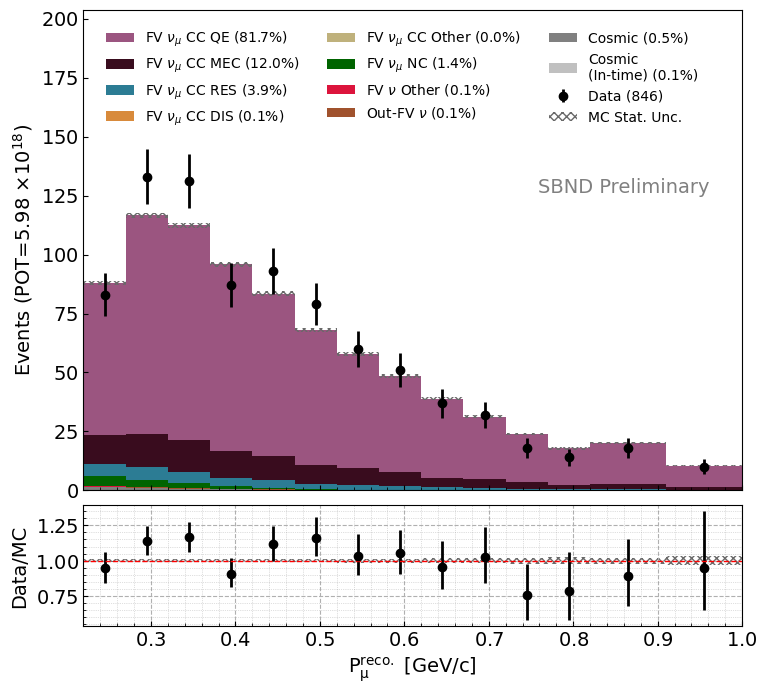

numu NC 1122


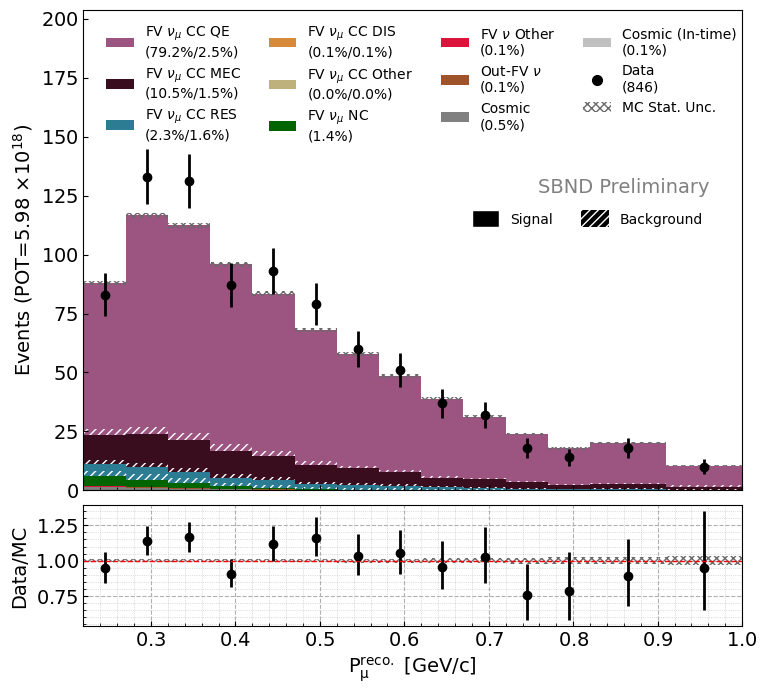

In [73]:
# muon momentum 
var_config = VariableConfig.muon_momentum()
evtdf = mc_evt_df_mup
vardf = mc_mu_df.pfp.trk.rangeP.p_muon
vardf_data = data_mu_df.pfp.trk.rangeP.p_muon
vardf_intime = intime_mu_df.pfp.trk.rangeP.p_muon
bins = var_config.bins
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)

# plot
plot_labels = [var_config.var_labels[1], 
               "Events (POT={})".format(pot_str), ""]

approval = "preliminary"

plot_type = "topology"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie_signal_bkgd"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_genie = hist_plot_genie_sb(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

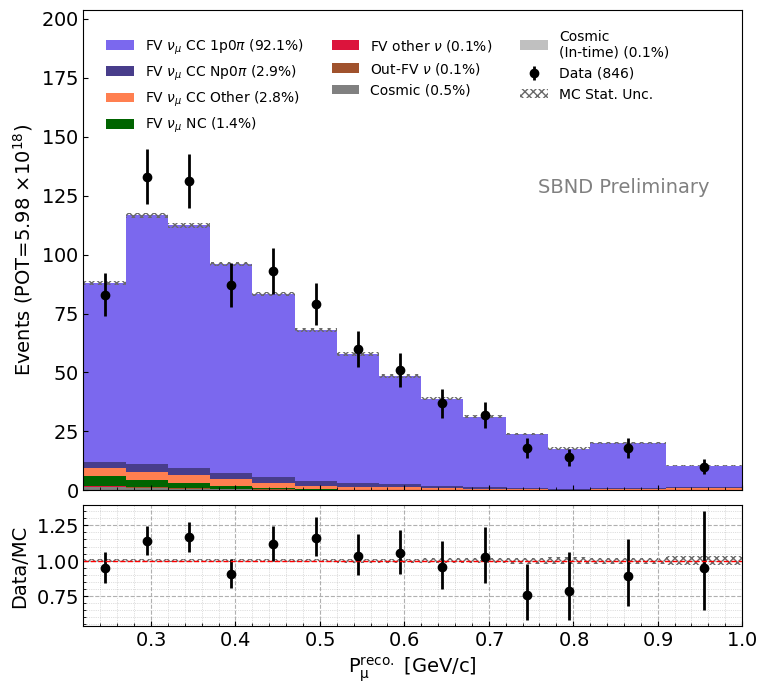

numu NC 1122


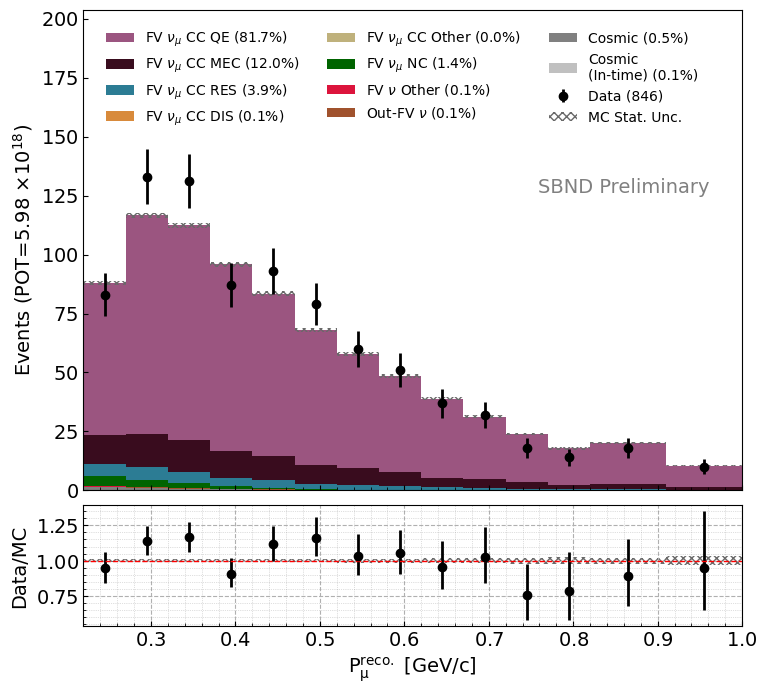

numu NC 1122


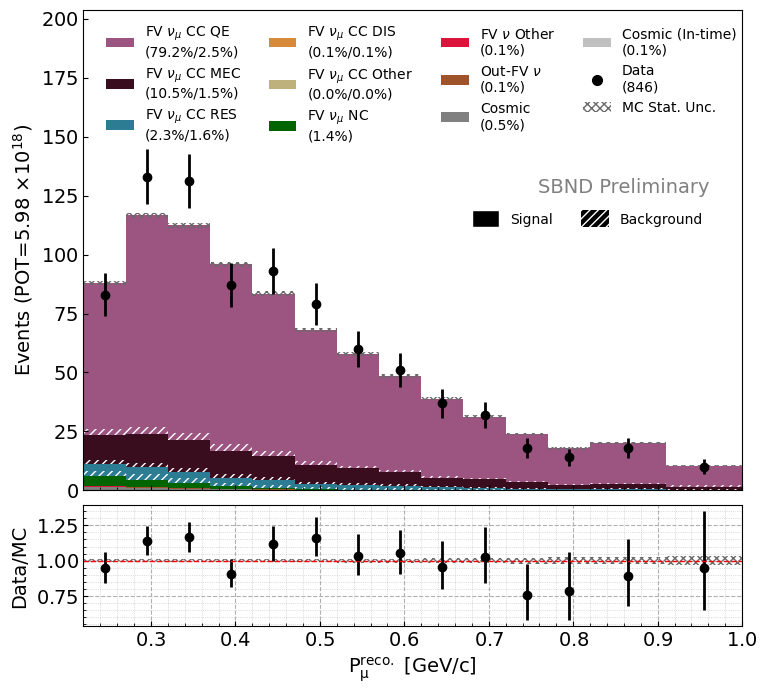

In [74]:
# muon momentum 
var_config = VariableConfig.muon_momentum()
evtdf = mc_evt_df_mup
vardf = mc_mu_df.pfp.trk.rangeP.p_muon
vardf_data = data_mu_df.pfp.trk.rangeP.p_muon
vardf_intime = intime_mu_df.pfp.trk.rangeP.p_muon
bins = var_config.bins
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)

# plot
plot_labels = [var_config.var_labels[1], 
               "Events (POT={})".format(pot_str), ""]

approval = "preliminary"

plot_type = "topology"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie_signal_bkgd"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_genie = hist_plot_genie_sb(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

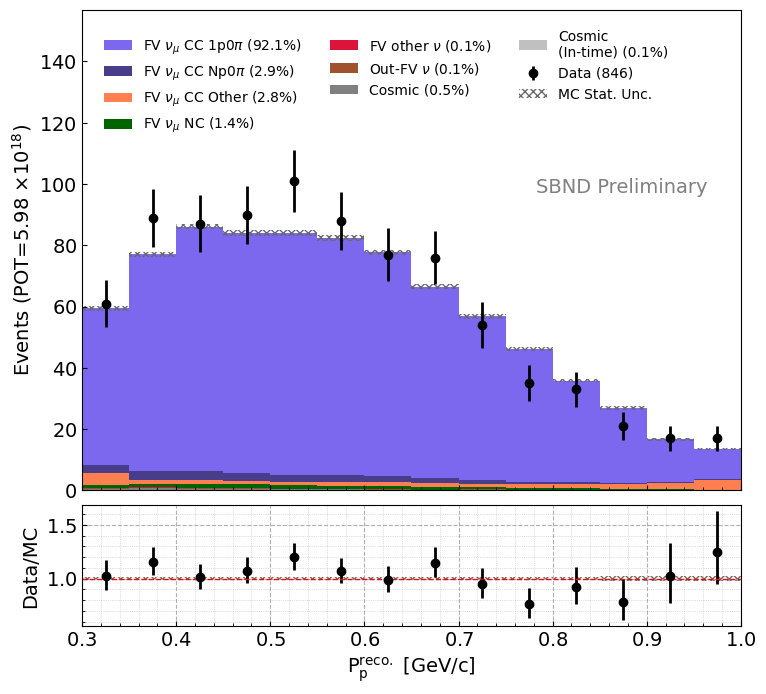

numu NC 1122


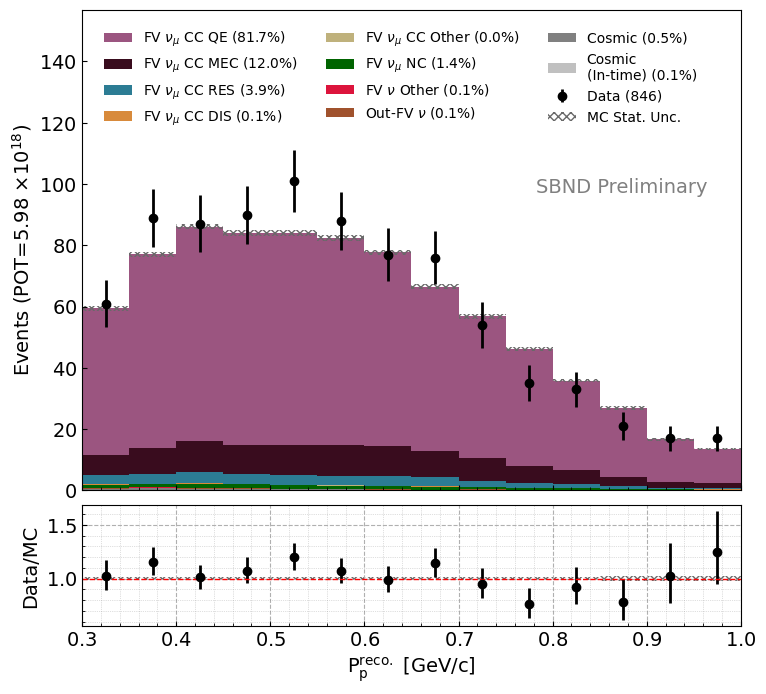

numu NC 1122


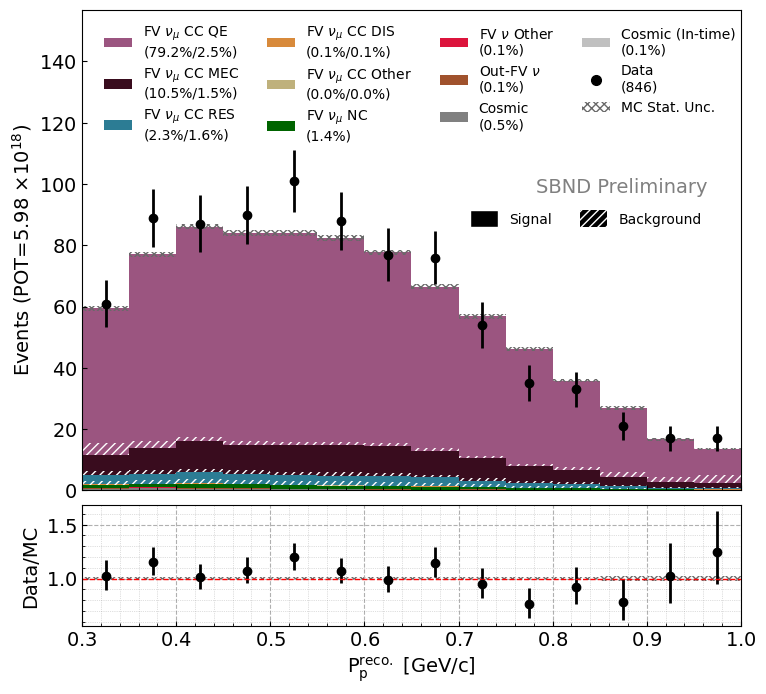

In [75]:
# proton momentum 
var_config = VariableConfig.proton_momentum()
evtdf = mc_evt_df_mup
vardf = mc_p_df.pfp.trk.rangeP.p_proton
vardf_data = data_p_df.pfp.trk.rangeP.p_proton
vardf_intime = intime_p_df.pfp.trk.rangeP.p_proton
bins = var_config.bins
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [var_config.var_labels[1], 
               "Events (POT={})".format(pot_str), ""]

approval = "preliminary"

plot_type = "topology"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie_signal_bkgd"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_genie = hist_plot_genie_sb(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

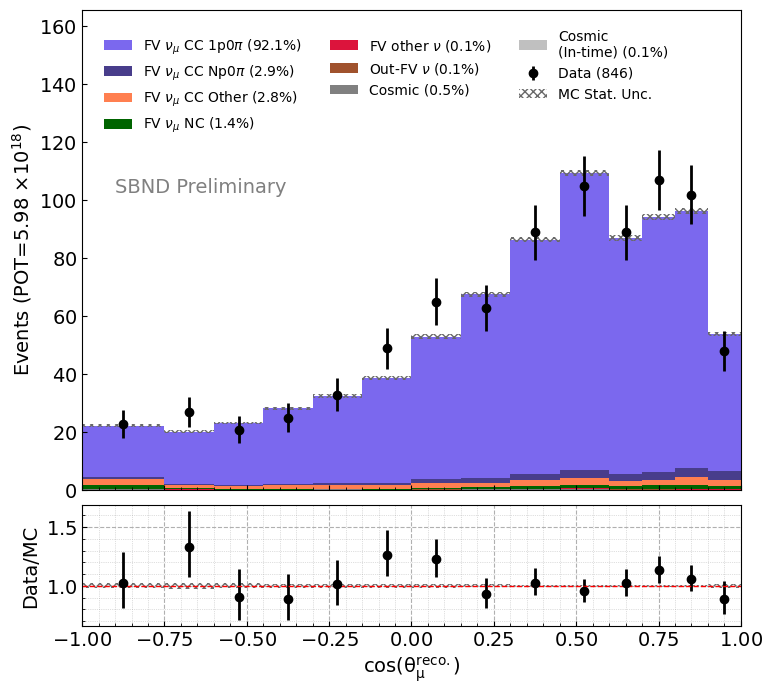

numu NC 1122


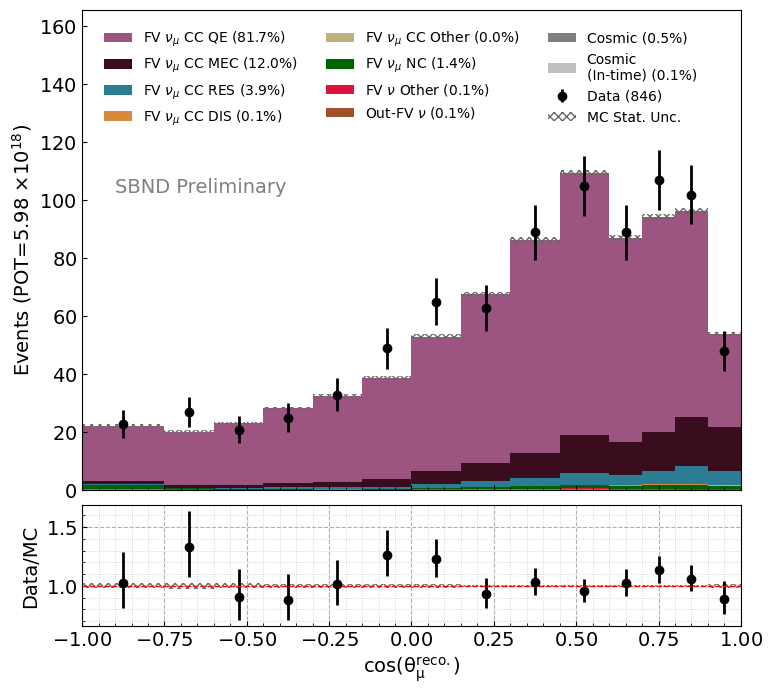

numu NC 1122


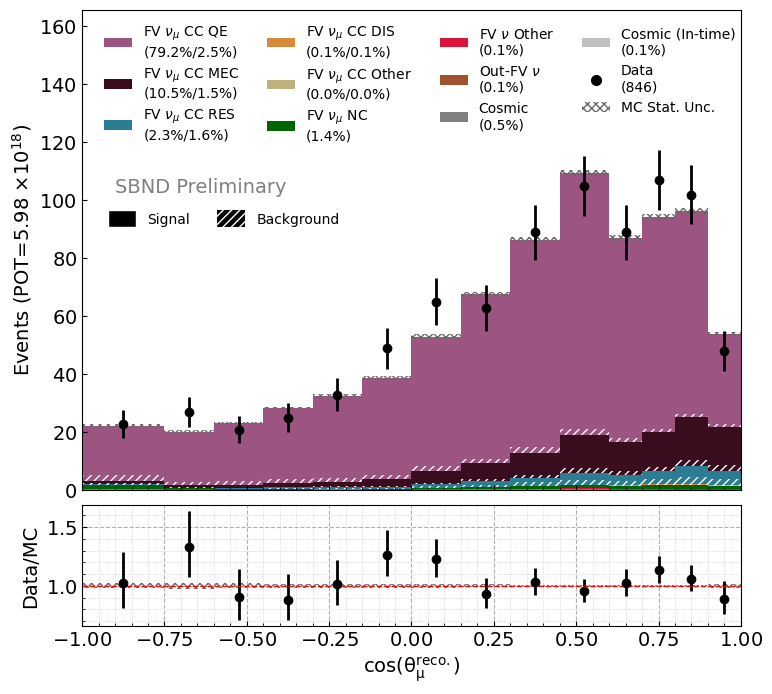

In [76]:
# Muon z-direction
var_config = VariableConfig.muon_direction()
evtdf = mc_evt_df_mup
vardf = mc_mu_df.pfp.trk.dir.z
vardf_data = data_mu_df.pfp.trk.dir.z
vardf_intime = intime_mu_df.pfp.trk.dir.z
bins = var_config.bins
vardf = np.clip(vardf, var_config.bins[0], var_config.bins[-1] - eps)
vardf_data = np.clip(vardf_data, var_config.bins[0], var_config.bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, var_config.bins[0], var_config.bins[-1] - eps)
plot_labels = [var_config.var_labels[1], 
               "Events (POT={})".format(pot_str), ""]

approval = "preliminary"

plot_type = "topology"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie_signal_bkgd"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_genie = hist_plot_genie_sb(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels, legendloc="left",
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

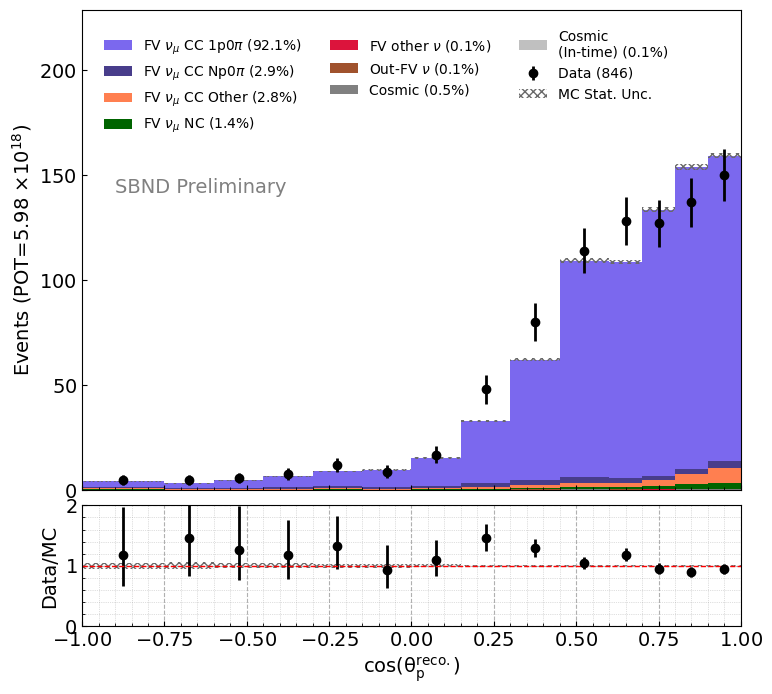

numu NC 1122


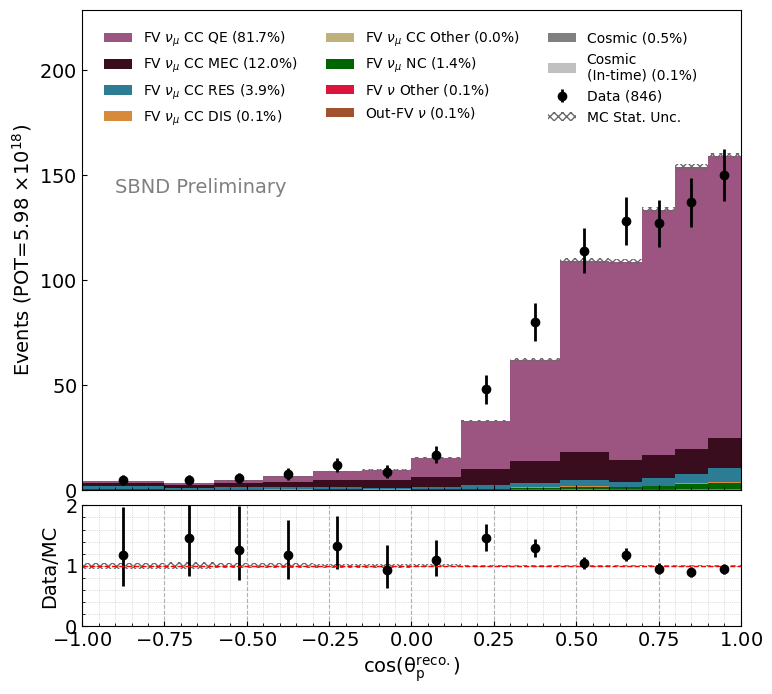

numu NC 1122


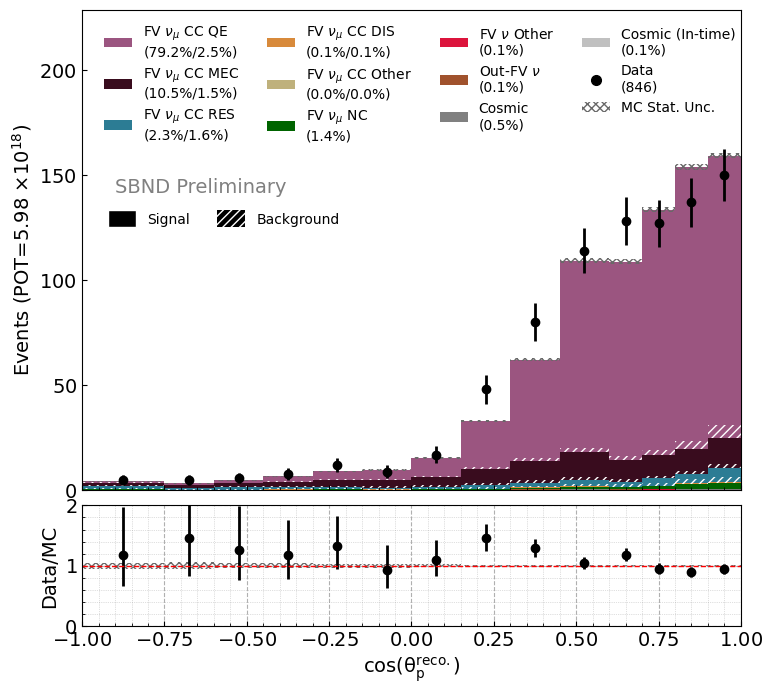

In [77]:
# proton z-direction
var_config = VariableConfig.proton_direction()
evtdf = mc_evt_df_mup
vardf = mc_p_df.pfp.trk.dir.z
vardf_data = data_p_df.pfp.trk.dir.z
vardf_intime = intime_p_df.pfp.trk.dir.z
bins = var_config.bins
vardf = np.clip(vardf, var_config.bins[0], var_config.bins[-1] - eps)
vardf_data = np.clip(vardf_data, var_config.bins[0], var_config.bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, var_config.bins[0], var_config.bins[-1] - eps)
plot_labels = [var_config.var_labels[1], 
               "Events (POT={})".format(pot_str), ""]

approval = "preliminary"

plot_type = "topology"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie_signal_bkgd"
save_name = save_fig_dir + "/{}_{}.png".format(var_config.var_save_name, plot_type)
ret_hist_genie = hist_plot_genie_sb(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels, legendloc="left",
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

In [78]:
from pyanalib.pandas_helpers import pad_column_name
from pyanalib.variable_calculator import get_cc1p0pi_tki

# mc_mu_df = mc_mu_df.reset_index(level=[3])
# mc_p_df = mc_p_df.reset_index(level=[3])

# data_mu_df = data_mu_df.reset_index(level=[3])
# data_p_df = data_p_df.reset_index(level=[3])

# intime_mu_df = intime_mu_df.reset_index(level=[3])
# intime_p_df = intime_p_df.reset_index(level=[3])

mudf = mc_mu_df#.reset_index(level=[3])
pdf = mc_p_df#.reset_index(level=[3])
P_mu_col = pad_column_name(("rangeP", "p_muon"), mudf.pfp.trk)
P_p_col = pad_column_name(("rangeP", "p_proton"), pdf.pfp.trk)
mc_ret_tki = get_cc1p0pi_tki(mudf.pfp.trk, pdf.pfp.trk, P_mu_col, P_p_col)

mudf = data_mu_df#.reset_index(level=[3])
pdf = data_p_df#.reset_index(level=[3])
data_ret_tki = get_cc1p0pi_tki(mudf.pfp.trk, pdf.pfp.trk, P_mu_col, P_p_col)

mudf = intime_mu_df#.reset_index(level=[3])
pdf = intime_p_df#.reset_index(level=[3])
intime_ret_tki = get_cc1p0pi_tki(mudf.pfp.trk, pdf.pfp.trk, P_mu_col, P_p_col)

/exp/sbnd/app/users/munjung/xsec/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in arccos
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [79]:
mc_ret_tki.keys()

dict_keys(['del_alpha', 'del_phi', 'del_Tp', 'del_Tp_x', 'del_Tp_y', 'del_p'])

In [80]:
mc_evt_df_mup["del_Tp_x"] = mc_ret_tki["del_Tp_x"]
mc_evt_df_mup["del_Tp_y"] = mc_ret_tki["del_Tp_y"]
mc_evt_df_mup["del_Tp"] = mc_ret_tki["del_Tp"]
mc_evt_df_mup["del_p"] = mc_ret_tki["del_p"]
mc_evt_df_mup["del_alpha"] = mc_ret_tki["del_alpha"]
mc_evt_df_mup["del_phi"] = mc_ret_tki["del_phi"]

data_evt_df_mup["del_Tp_x"] = data_ret_tki["del_Tp_x"]
data_evt_df_mup["del_Tp_y"] = data_ret_tki["del_Tp_y"]
data_evt_df_mup["del_Tp"] = data_ret_tki["del_Tp"]
data_evt_df_mup["del_p"] = data_ret_tki["del_p"]
data_evt_df_mup["del_alpha"] = data_ret_tki["del_alpha"]
data_evt_df_mup["del_phi"] = data_ret_tki["del_phi"]

intime_evt_df_mup["del_Tp_x"] = intime_ret_tki["del_Tp_x"]
intime_evt_df_mup["del_Tp_y"] = intime_ret_tki["del_Tp_y"]
intime_evt_df_mup["del_Tp"] = intime_ret_tki["del_Tp"]
intime_evt_df_mup["del_p"] = intime_ret_tki["del_p"]
intime_evt_df_mup["del_alpha"] = intime_ret_tki["del_alpha"]
intime_evt_df_mup["del_phi"] = intime_ret_tki["del_phi"]

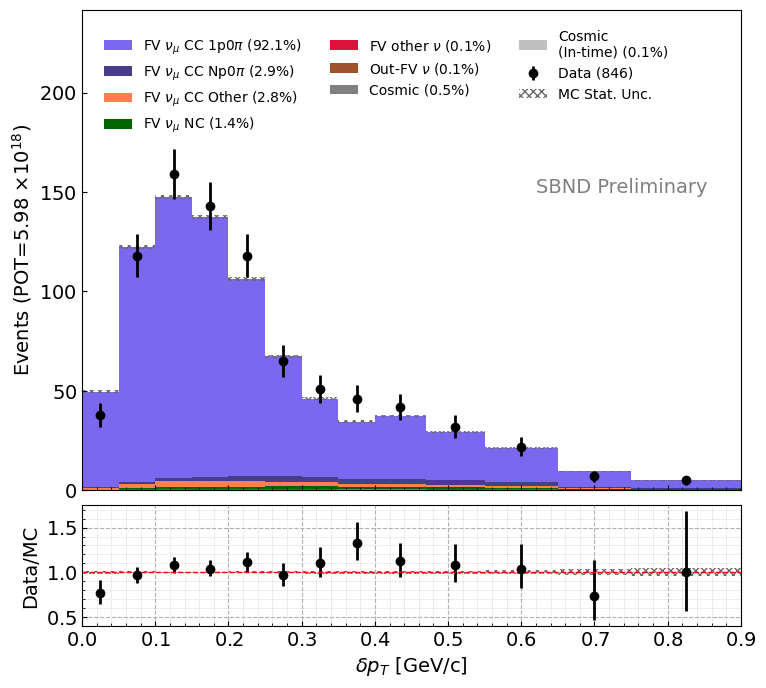

numu NC 1122


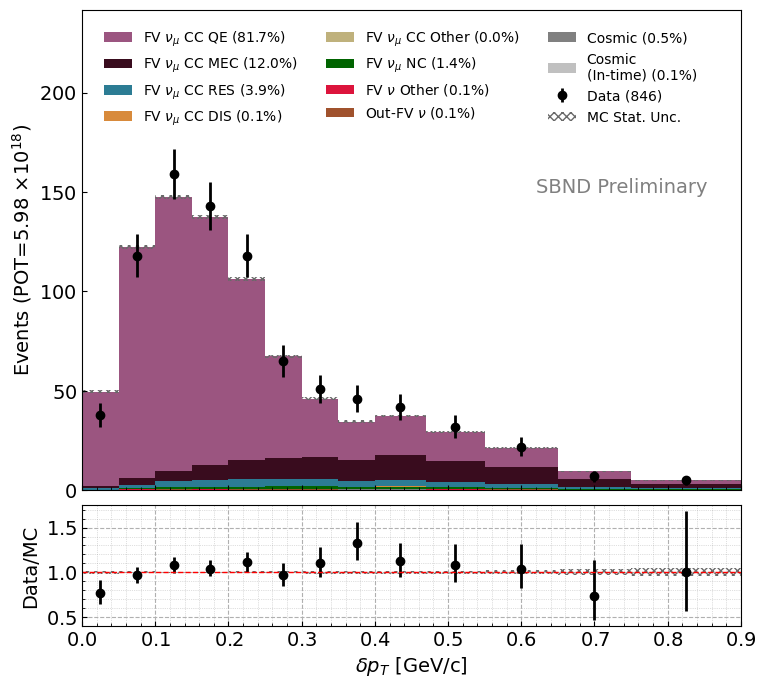

numu NC 1122


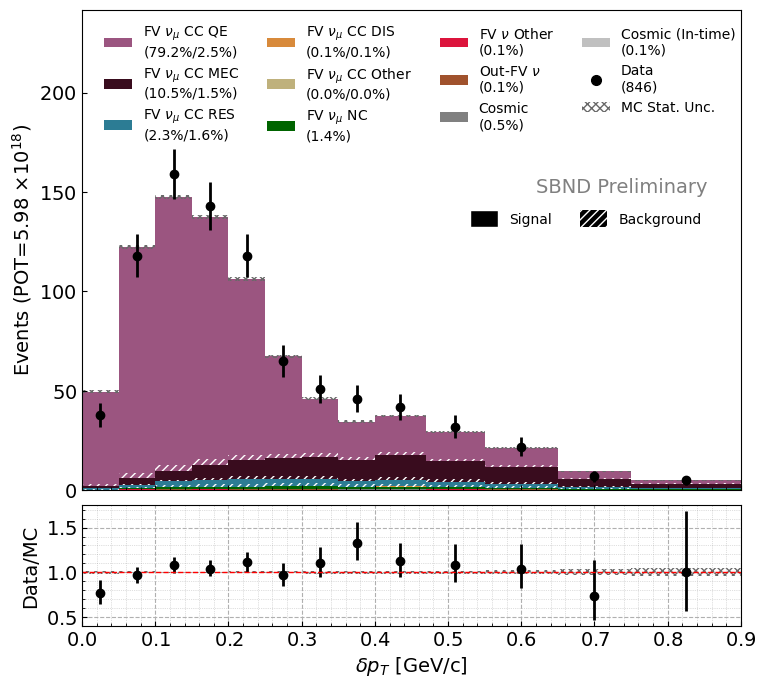

In [81]:
evtdf = mc_evt_df_mup
tki_name = "del_Tp"
var_config = VariableConfig.tki_del_Tp()
vardf = mc_ret_tki[tki_name]
vardf_data = data_ret_tki[tki_name]
vardf_intime = intime_ret_tki[tki_name]
bins = var_config.bins
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\delta p_T$ [GeV/c]",
               "Events (POT={})".format(pot_str), ""]

approval = "preliminary"

plot_type = "topology"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie_signal_bkgd"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_genie = hist_plot_genie_sb(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

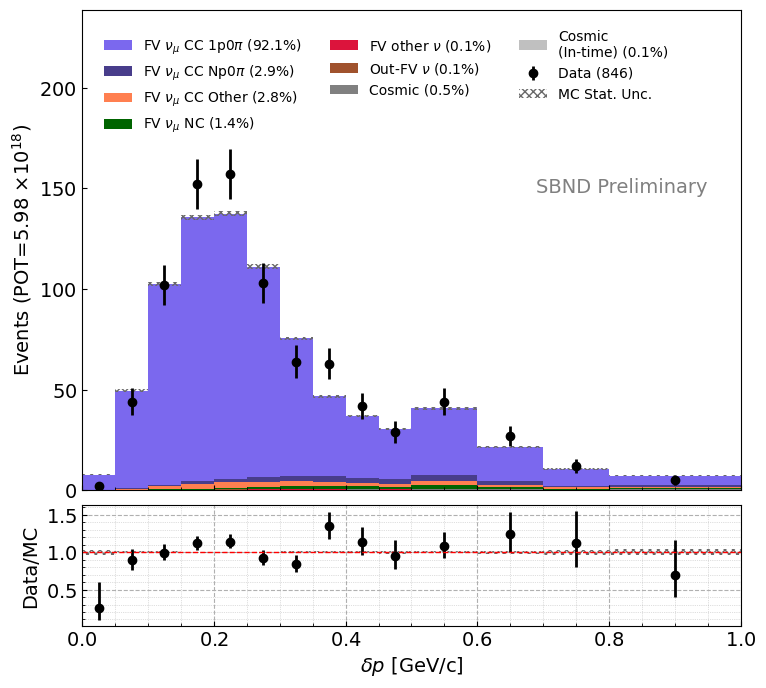

numu NC 1122


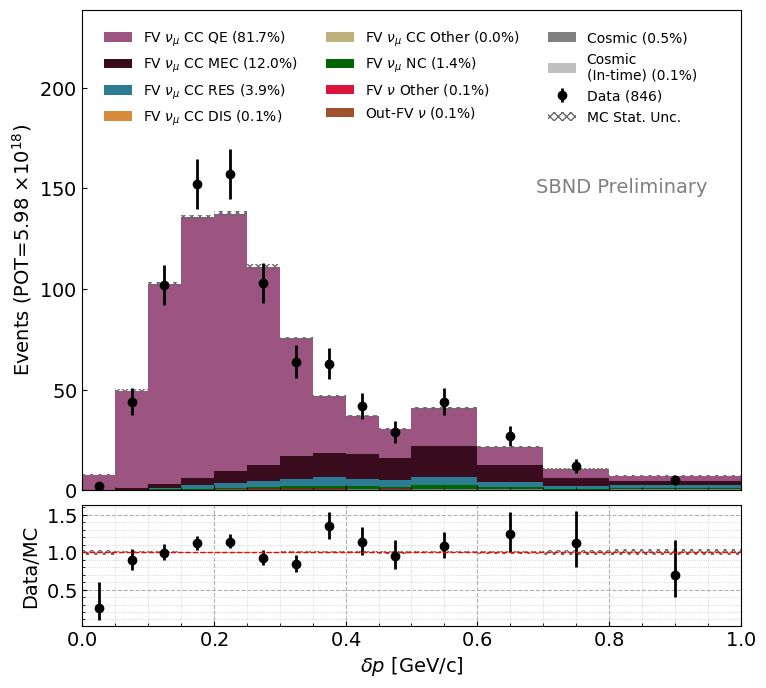

numu NC 1122


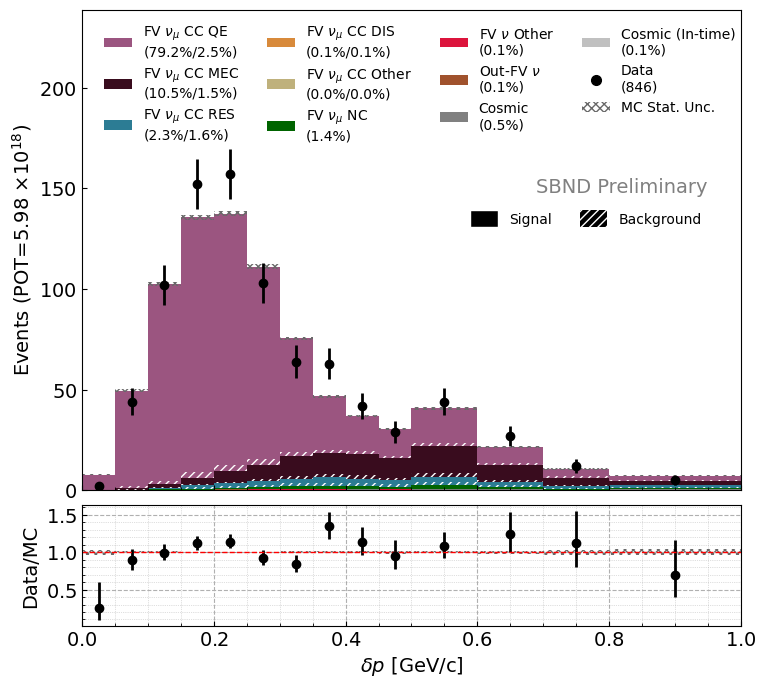

In [82]:
# Muon z-direction
evtdf = mc_evt_df_mup
tki_name = "del_p"
var_config = VariableConfig.tki_del_p()
vardf = mc_ret_tki[tki_name]
vardf_data = data_ret_tki[tki_name]
vardf_intime = intime_ret_tki[tki_name]
bins = var_config.bins
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\delta p$ [GeV/c]",
               "Events (POT={})".format(pot_str), ""]

approval = "preliminary"

plot_type = "topology"
save_name = save_fig_dir + "/tki-del_p_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/tki-del_p_{}.png".format(plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie_signal_bkgd"
save_name = save_fig_dir + "/tki-del_p_{}.png".format(plot_type)
ret_hist_genie = hist_plot_genie_sb(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

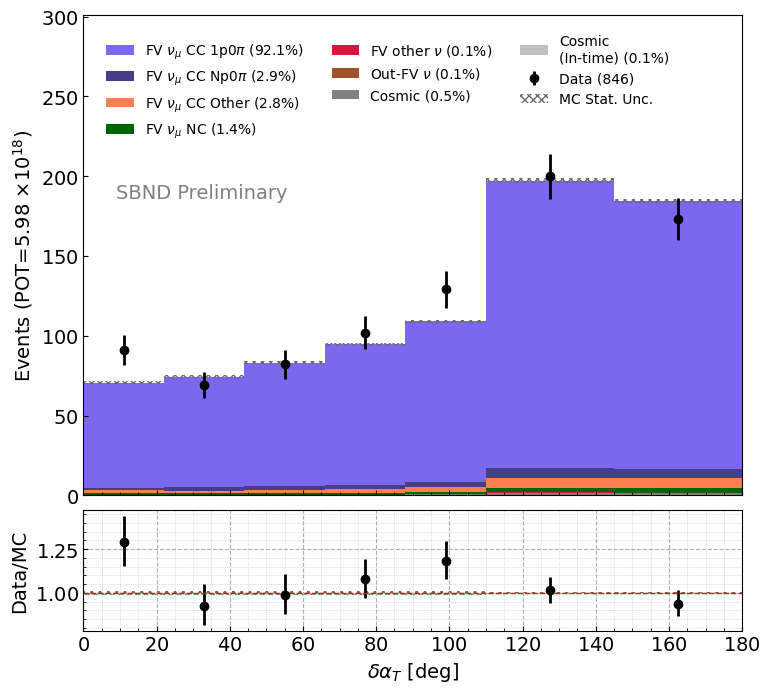

numu NC 1122


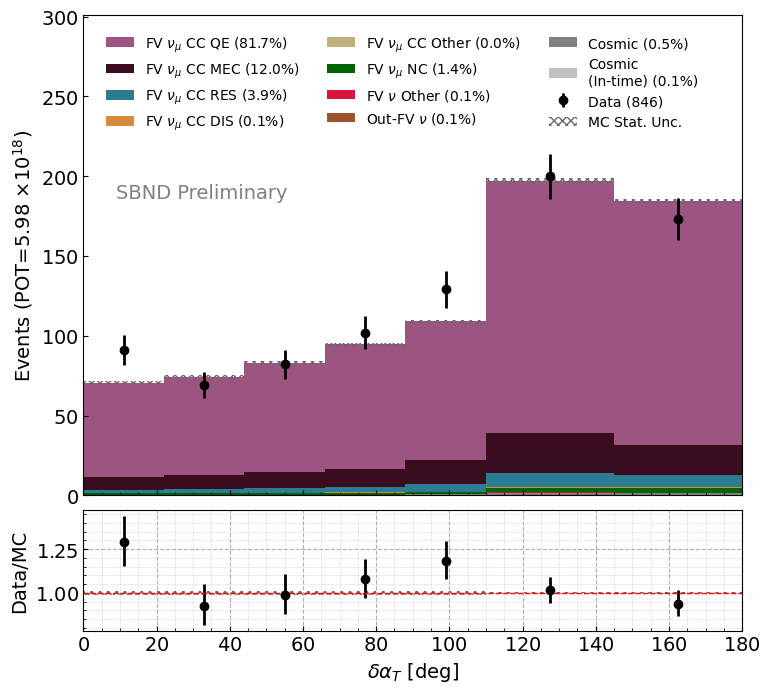

numu NC 1122


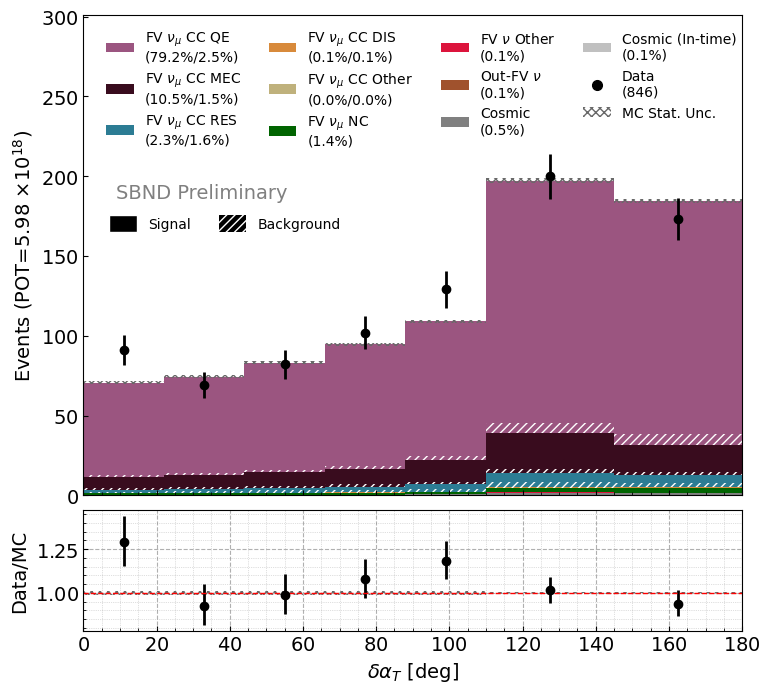

In [83]:
# Muon z-direction
evtdf = mc_evt_df_mup
tki_name = "del_alpha"
var_config = VariableConfig.tki_del_alpha()
vardf = mc_ret_tki[tki_name]
vardf_data = data_ret_tki[tki_name]
vardf_intime = intime_ret_tki[tki_name]
bins = var_config.bins
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\delta \alpha_T$ [deg]",
               "Events (POT={})".format(pot_str), ""]

approval = "preliminary"

plot_type = "topology"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie_signal_bkgd"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_genie = hist_plot_genie_sb(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels, legendloc="left",
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

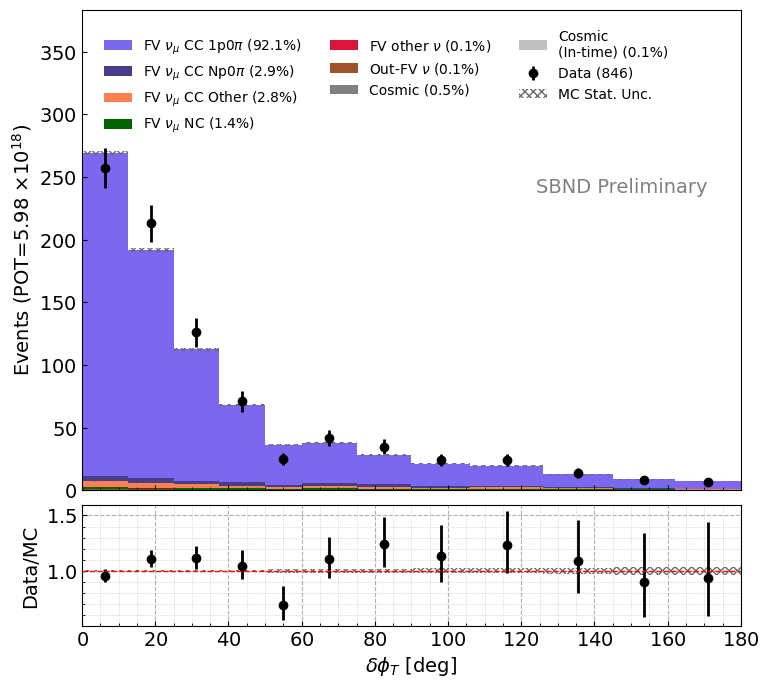

numu NC 1122


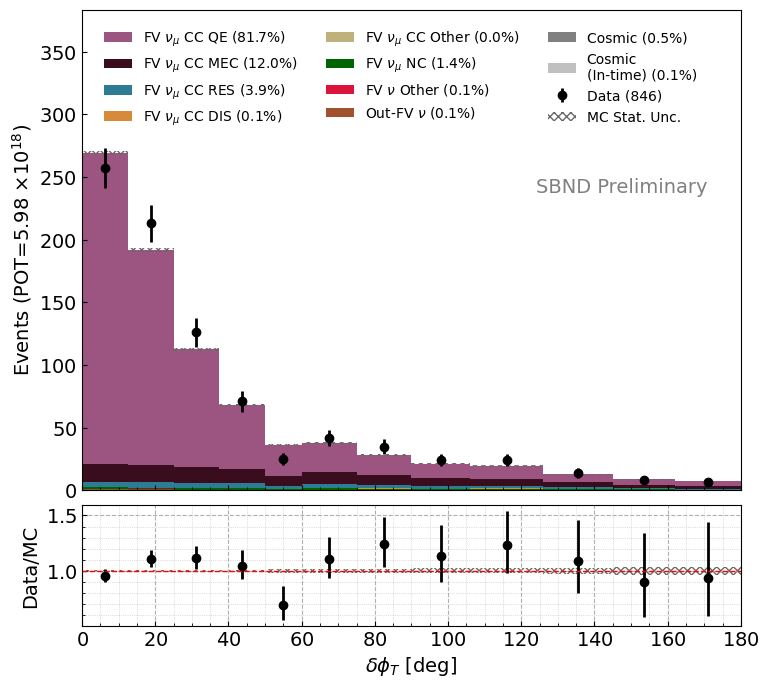

numu NC 1122


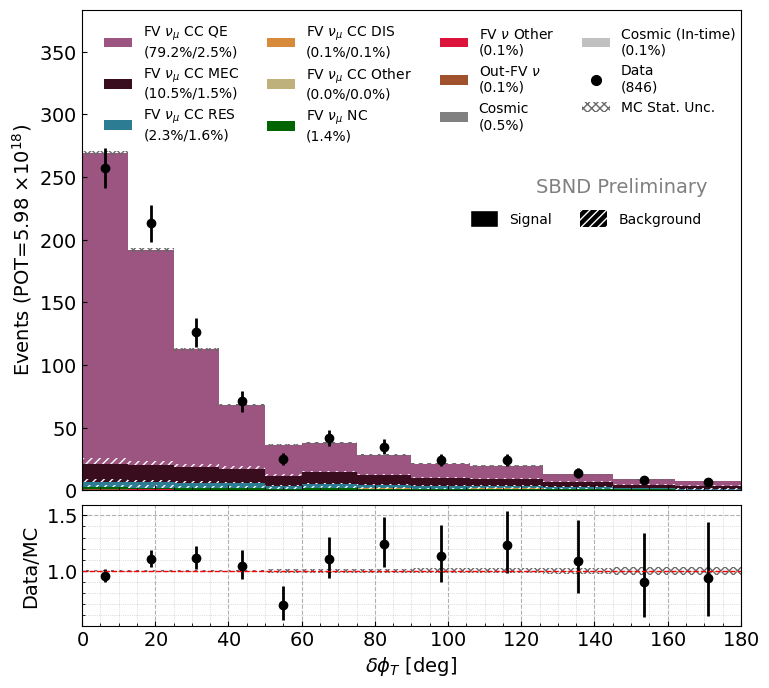

In [84]:
# Muon z-direction
evtdf = mc_evt_df_mup
tki_name = "del_phi"
var_config = VariableConfig.tki_del_phi()
vardf = mc_ret_tki[tki_name]
vardf_data = data_ret_tki[tki_name]
vardf_intime = intime_ret_tki[tki_name]
bins = var_config.bins
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\delta \phi_T$ [deg]",
               "Events (POT={})".format(pot_str), ""]

approval = "preliminary"

plot_type = "topology"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie_signal_bkgd"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_genie = hist_plot_genie_sb(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          approval=approval,
                          save_fig=save_fig, save_name=save_name)

## Look at different TPC regions

In [85]:
data_evt_df_mup = data_evt_df_mup[InFV(data_evt_df_mup.slc.vertex)]

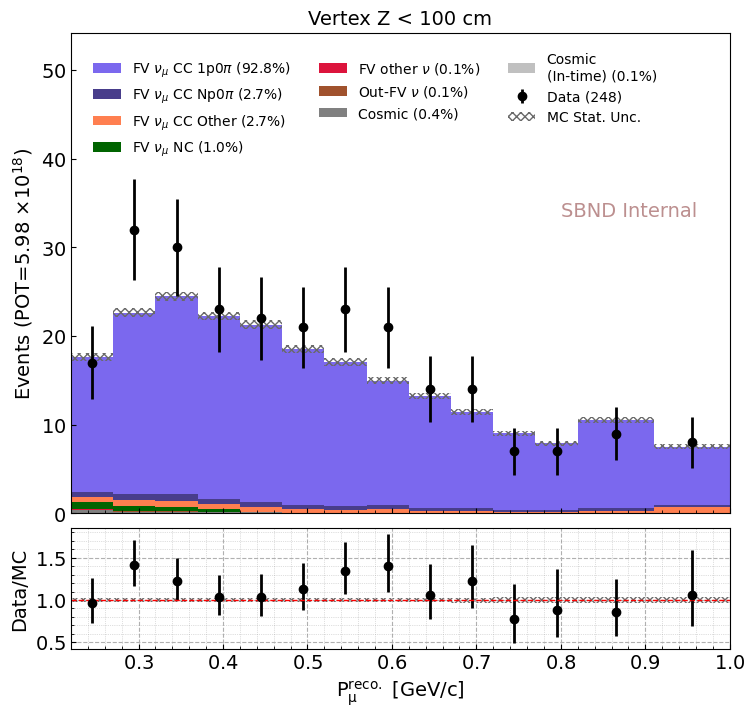

In [86]:
# muon momentum 
var_config = VariableConfig.muon_momentum()
mc_mask = (mc_evt_df_mup.slc.vertex.z > 20) & (mc_evt_df_mup.slc.vertex.z < 100)
evtdf = mc_evt_df_mup[mc_mask]
vardf = mc_mu_df[mc_mask].pfp.trk.rangeP.p_muon
data_mask = (data_evt_df_mup.slc.vertex.z > 20) & (data_evt_df_mup.slc.vertex.z < 100)
vardf_data = data_mu_df[data_mask].pfp.trk.rangeP.p_muon
intime_mask = (intime_evt_df_mup.slc.vertex.z > 20) & (intime_evt_df_mup.slc.vertex.z < 100)
vardf_intime = intime_mu_df[intime_mask].pfp.trk.rangeP.p_muon
bins = var_config.bins
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)

# plot
plot_labels = [var_config.var_labels[1], 
               "Events (POT={})".format(pot_str), "Vertex Z < 100 cm"]

plot_type = "topology"
save_name = save_fig_dir + "/{}_{}_z_l_0_100.png".format(var_config.var_save_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

In [87]:
# z_bins = [10, 100, 200, 300, 450]

# for i in range(len(z_bins)-1):
#     z_min = z_bins[i]
#     z_max = z_bins[i+1]
#     var_config = VariableConfig.muon_momentum()
#     mc_mask = (mc_evt_df_mup.slc.vertex.z > z_min) & (mc_evt_df_mup.slc.vertex.z < z_max)
#     evtdf = mc_evt_df_mup[mc_mask]
#     vardf = mc_mu_df[mc_mask].mu.pfp.trk.rangeP.p_muon
#     data_mask = (data_evt_df_mup.slc.vertex.z > z_min) & (data_evt_df_mup.slc.vertex.z < z_max)
#     vardf_data = data_mu_df[data_mask].pfp.trk.rangeP.p_muon
#     intime_mask = (intime_evt_df_mup.slc.vertex.z > z_min) & (intime_evt_df_mup.slc.vertex.z < z_max)
#     vardf_intime = intime_mu_df[intime_mask].pfp.trk.rangeP.p_muon
#     bins = var_config.bins
#     vardf = np.clip(vardf, bins[0], bins[-1] - eps)
#     vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
#     vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)

#     # plot
#     plot_labels = [var_config.var_labels[1], 
#                 "Events (POT={})".format(pot_str), "{} < Z < {} cm".format(z_min, z_max)]

#     plot_type = "topology"
#     save_name = save_fig_dir + "/{}_{}_z_l_0_100.png".format(var_config.var_save_name, plot_type)
#     ret_hist_topo = hist_plot(plot_type,
#                             evtdf, vardf, 
#                             vardf_data, vardf_intime,
#                             bins, 
#                             plot_labels,
#                             save_fig=save_fig, save_name=save_name)

In [88]:
# var_config = VariableConfig.muon_direction()
# z_bins = [-200, -100, 0, 100, 200]

# for i in range(len(z_bins)-1):
#     z_min = z_bins[i]
#     z_max = z_bins[i+1]
#     mc_mask = (mc_evt_df_mup.slc.vertex.y > z_min) & (mc_evt_df_mup.slc.vertex.y < z_max)
#     evtdf = mc_evt_df_mup[mc_mask]
#     vardf = mc_mu_df[mc_mask].mu.pfp.trk.dir.z
#     data_mask = (data_evt_df_mup.slc.vertex.y > z_min) & (data_evt_df_mup.slc.vertex.y < z_max)
#     vardf_data = data_mu_df[data_mask].pfp.trk.dir.z
#     intime_mask = (intime_evt_df_mup.slc.vertex.y > z_min) & (intime_evt_df_mup.slc.vertex.y < z_max)
#     vardf_intime = intime_mu_df[intime_mask].pfp.trk.dir.z
#     bins = var_config.bins
#     vardf = np.clip(vardf, bins[0], bins[-1] - eps)
#     vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
#     vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)

#     # plot
#     plot_labels = [var_config.var_labels[1], 
#                 "Events (POT={})".format(pot_str), "{} < Vertex Y [cm] < {}".format(z_min, z_max)]

#     plot_type = "topology"
#     save_name = save_fig_dir + "/{}_{}_z_l_0_100.png".format(var_config.var_save_name, plot_type)
#     ret_hist_topo = hist_plot(plot_type,
#                             evtdf, vardf, 
#                             vardf_data, vardf_intime,
#                             bins, 
#                             plot_labels,
#                             save_fig=save_fig, save_name=save_name)

In [89]:
mc_mu_df

pfp                                   \
                              tindex      trk                           
                                     producer       start               
                                                        x           y   
                                                                        
                                                                        
                                                                        
__ntuple entry rec.slc..index                                           
21       6597  1                   0        0   86.038452 -111.914841   
321      4632  0                   0        0  -82.512436  -42.191860   
109      17098 1                   0        0  133.752167  -86.354141   
387      2116  0                   0        0  -12.752584  -45.017941   
235      15079 0                   0        0   98.638191  -20.467031   
..                               ...      ...         ...         ...   
229      15032 0                   0        0 -148.343445  166.270126   
268      5269  1                   0        0   34.689919  -11.394110   
7        4686  0                   0        0  121.994858  -60.117115   
273      1348  2                   0        0  108.214157 -155.059250   
252      3577  0                   0        0  -50.021866   84.464668   

                                                                               \
                                                                                
                                                  end                           
                                        z           x           y           z   
                                                                                
                                                                                
                                                                                
__ntuple entry rec.slc..index                                                   
21       6597  1                32.090034 -111.908073   20.330860  346.911407   
321      4632  0               109.549042  162.827118  -26.112965  419.777496   
109      17098 1               109.937492  -72.902351  -22.653893  439.687500   
387      2116  0                16.410772  -78.582489   -3.665319  405.133881   
235      15079 0                26.812532  -82.519753   42.731979  372.872162   
..                                    ...         ...         ...         ...   
229      15032 0               170.693726 -149.552856  146.856903  212.951340   
268      5269  1               137.174118   81.078468    6.589832  134.492310   
7        4686  0                93.651314   84.629295  -90.014420  107.089981   
273      1348  2               103.181709  145.027847 -122.175240  109.751961   
252      3577  0               433.464661  -40.625954   37.737518  448.388947   

                                                   ...                         \
                                                   ...                          
                                    dir            ... is_contained         P   
                                      x         y  ...                 p_muon   
                                                   ...                          
                                                   ...                          
                                                   ...                          
__ntuple entry rec.slc..index                      ...                          
21       6597  1              -0.497877  0.332626  ...         True  0.999872   
321      4632  0               0.617139  0.040446  ...         True  0.999786   
109      17098 1              -0.519934  0.160267  ...         True  0.999602   
387      2116  0              -0.165629  0.104044  ...         True  0.999585   
235      15079 0              -0.455816  0.159016  ...         True  0.999543   
..                                  ...       ...  .

## Data vs. MC of other variables

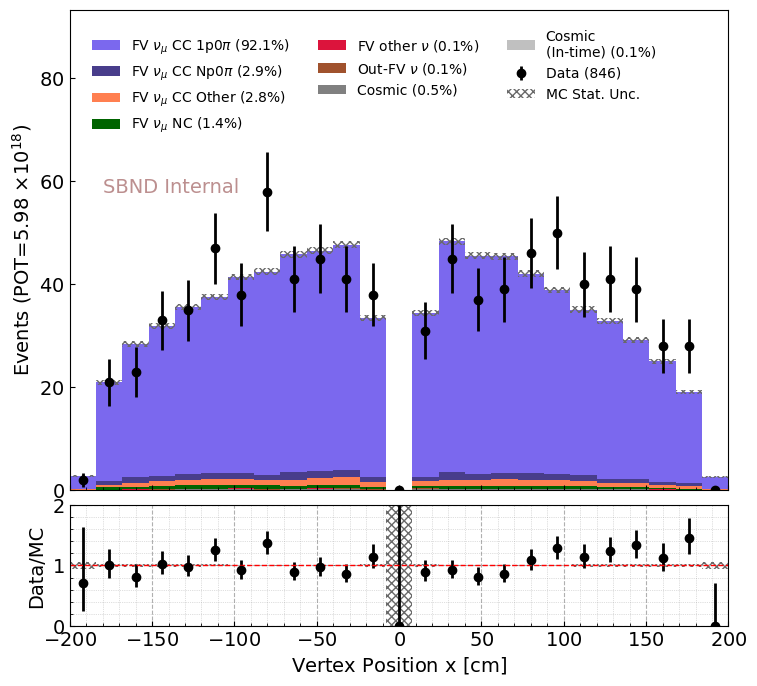

numu NC 1122


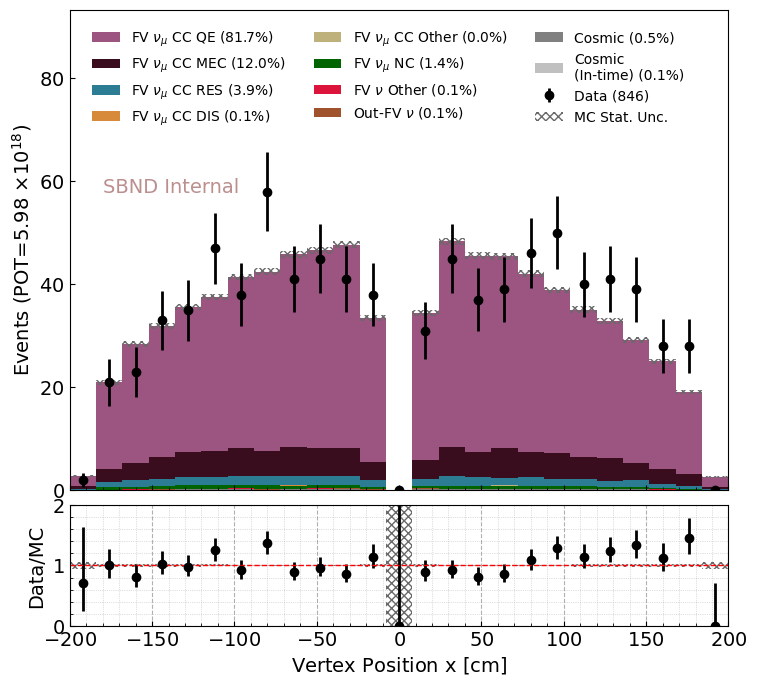

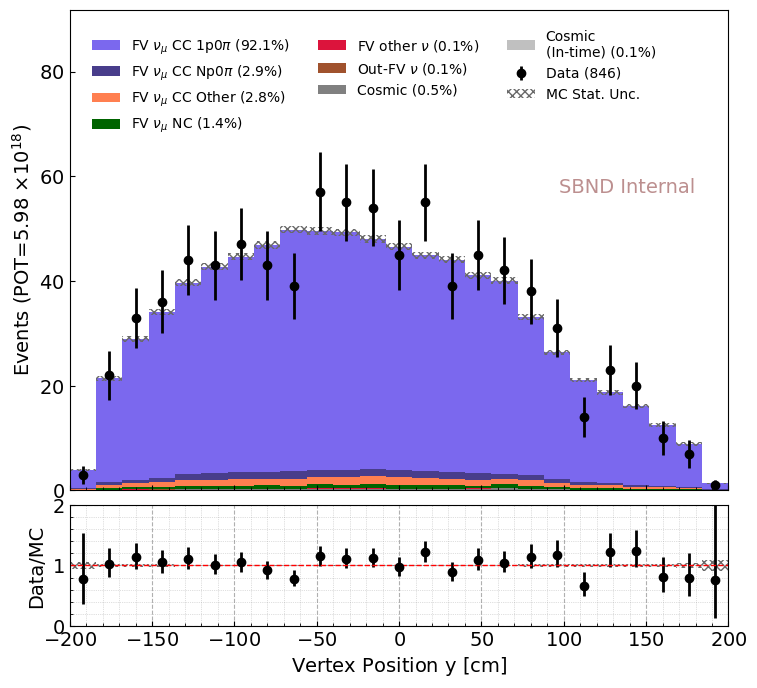

numu NC 1122


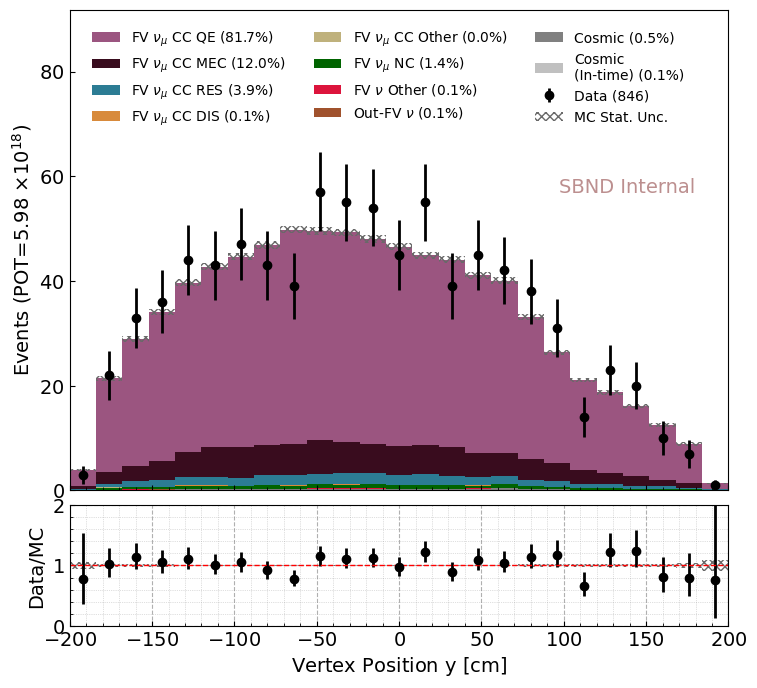

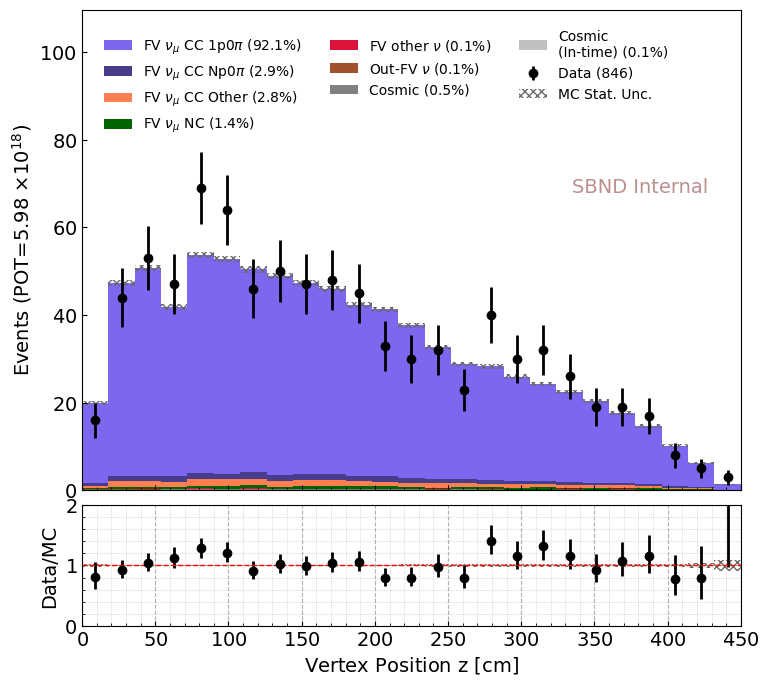

numu NC 1122


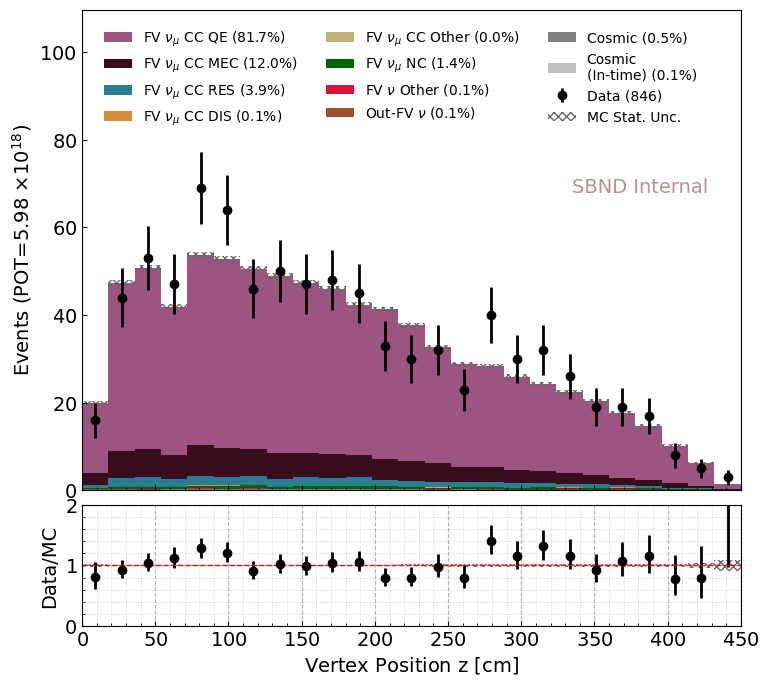

In [90]:
# slice vertex position
evtdf = mc_evt_df_mup
vardf = evtdf.slc.vertex.x
vardf_data = data_evt_df_mup.slc.vertex.x
vardf_intime = intime_evt_df_mup.slc.vertex.x
bins = np.linspace(-200,200,26)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"Vertex Position $\mathrm{x}$ [cm]", 
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/slice_vertex_x_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/slice_vertex_x_{}.png".format(plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)


evtdf = mc_evt_df_mup
vardf = evtdf.slc.vertex.y
vardf_data = data_evt_df_mup.slc.vertex.y
vardf_intime = intime_evt_df_mup.slc.vertex.y
bins = np.linspace(-200,200,26)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"Vertex Position $\mathrm{y}$ [cm]", 
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/slice_vertex_y_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/slice_vertex_y_{}.png".format(plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)


evtdf = mc_evt_df_mup
vardf = evtdf.slc.vertex.z
vardf_data = data_evt_df_mup.slc.vertex.z
vardf_intime = intime_evt_df_mup.slc.vertex.z
bins = np.linspace(0,450,26)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"Vertex Position $\mathrm{z}$ [cm]", 
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/slice_vertex_z_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/slice_vertex_z_{}.png".format(plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

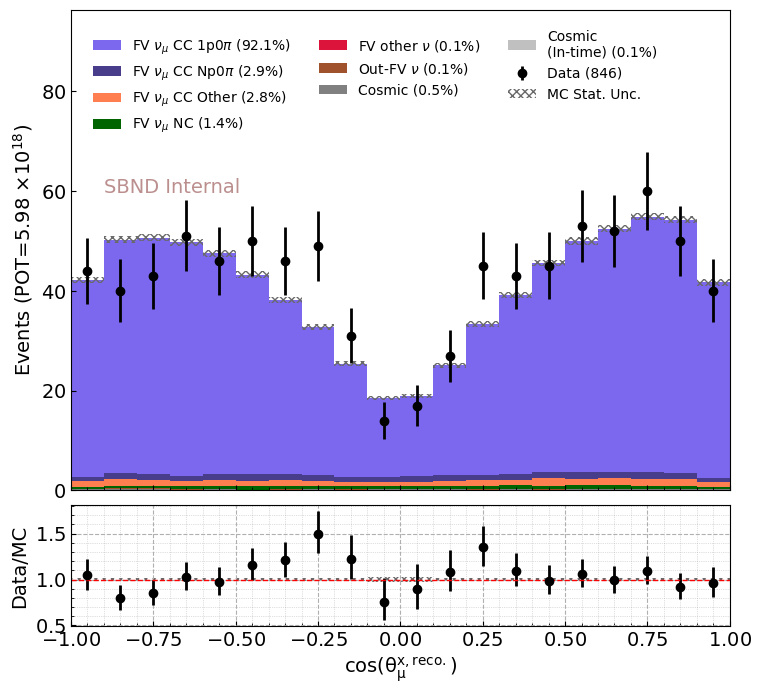

numu NC 1122


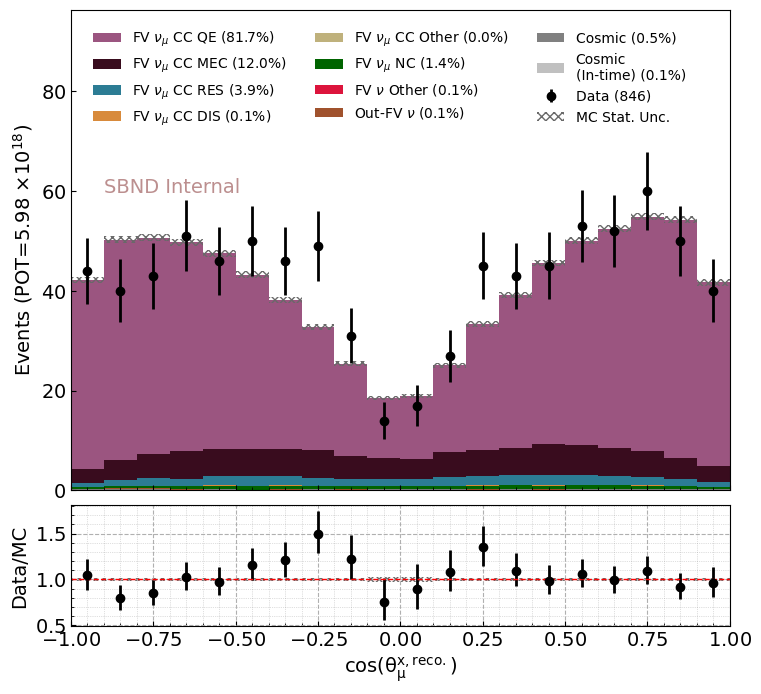

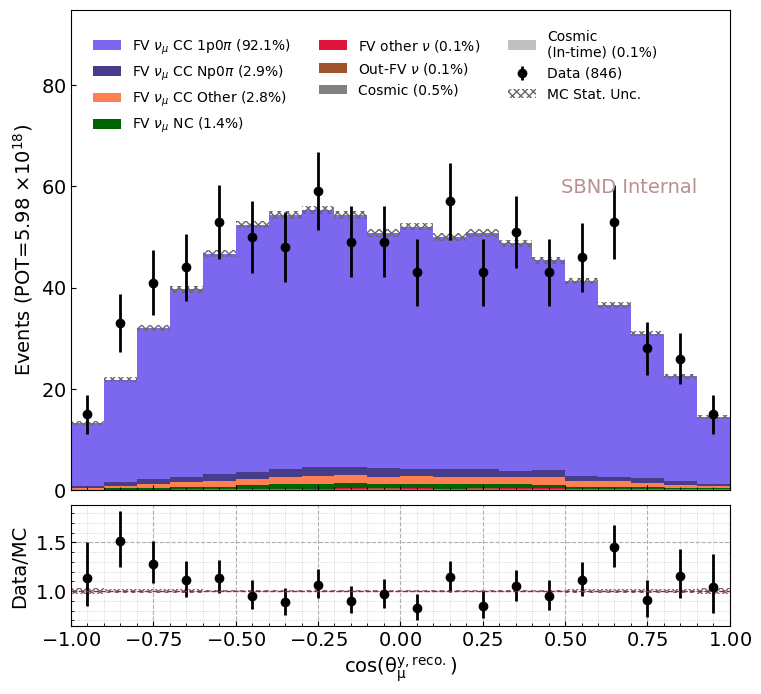

numu NC 1122


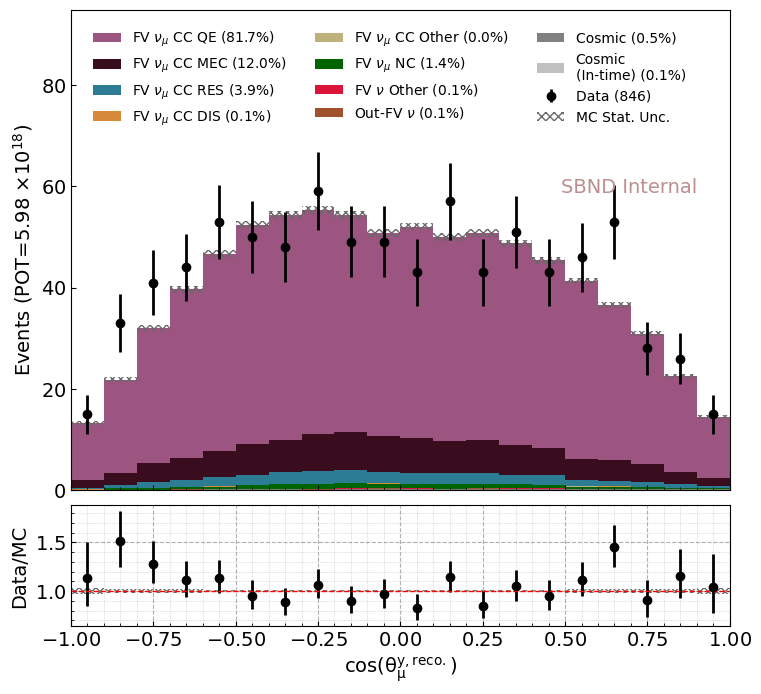

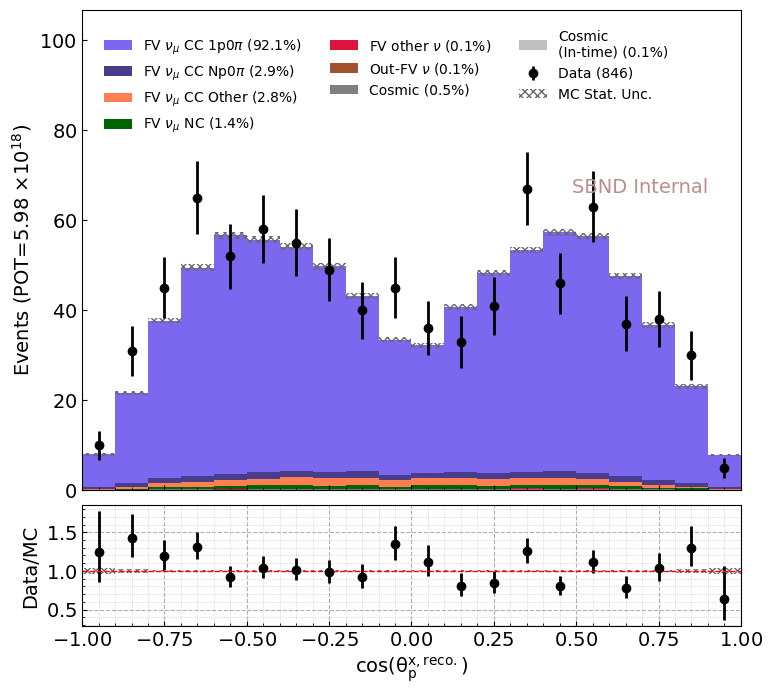

numu NC 1122


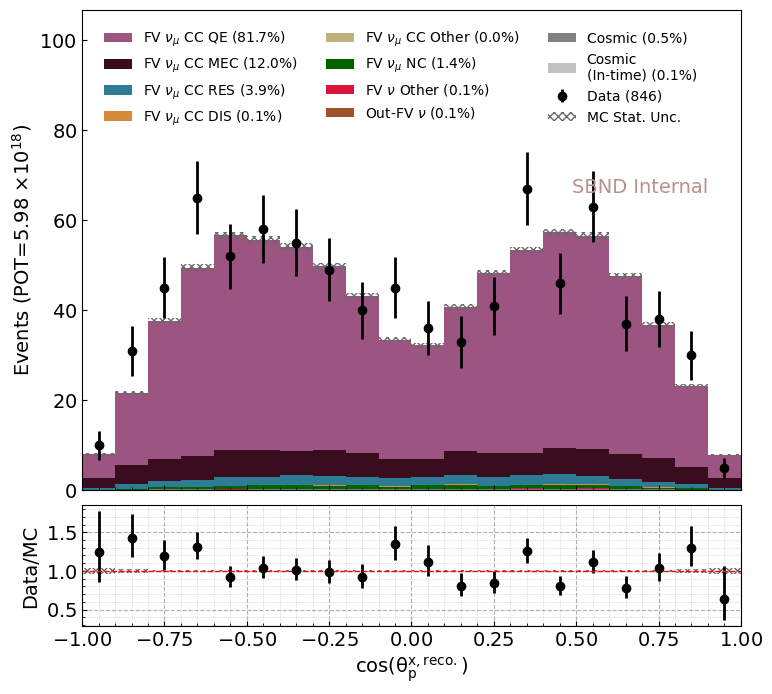

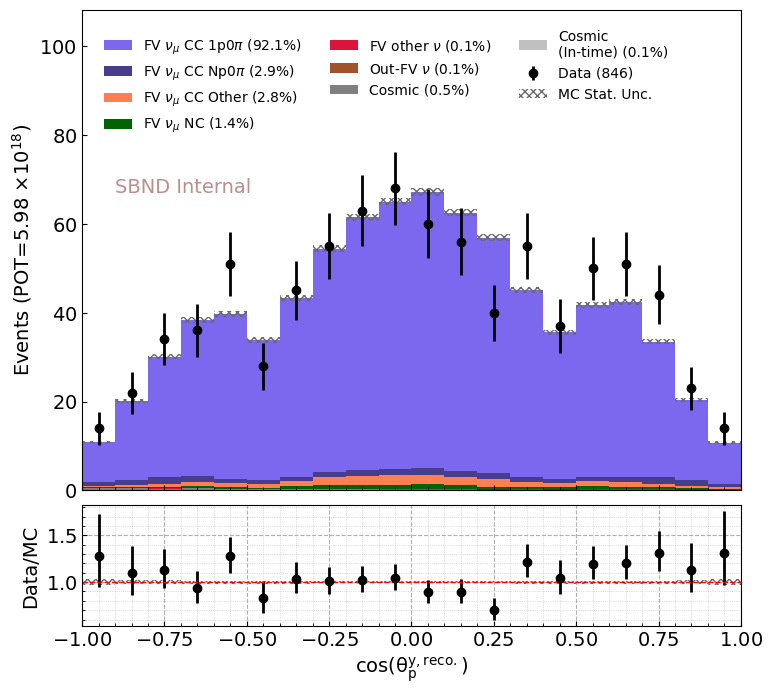

numu NC 1122


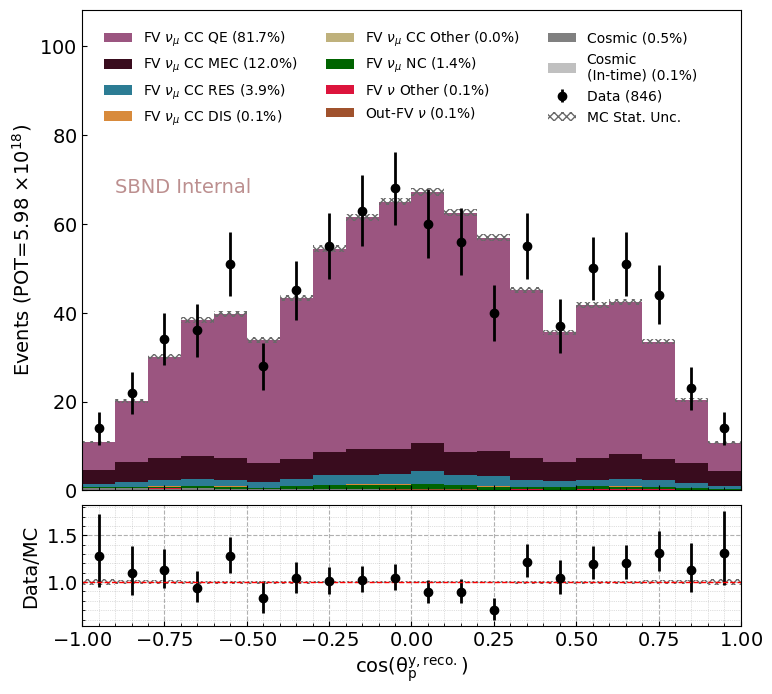

In [91]:
# mu & p directions

evtdf = mc_evt_df_mup
vardf = mc_mu_df.pfp.trk.dir.x
vardf_data = data_mu_df.pfp.trk.dir.x
vardf_intime = intime_mu_df.pfp.trk.dir.x
bins = np.linspace(-1,1,21)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_{\mu}^{x, reco.})}$",
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/mu_dir_x-{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/mu_dir_x_{}.png".format(plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

evtdf = mc_evt_df_mup
vardf = mc_mu_df.pfp.trk.dir.y
vardf_data = data_mu_df.pfp.trk.dir.y
vardf_intime = intime_mu_df.pfp.trk.dir.y
bins = np.linspace(-1,1,21)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_{\mu}^{y, reco.})}$",
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/mu_dir_y_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/mu_dir_y_{}.png".format(plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

# proton

evtdf = mc_evt_df_mup
vardf = mc_p_df.pfp.trk.dir.x
vardf_data = data_p_df.pfp.trk.dir.x
vardf_intime = intime_p_df.pfp.trk.dir.x
bins = np.linspace(-1,1,21)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_p^{x, reco.})}$",
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/p_dir_x_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/p_dir_x_{}.png".format(plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

evtdf = mc_evt_df_mup
vardf = mc_p_df.pfp.trk.dir.y
vardf_data = data_p_df.pfp.trk.dir.y
vardf_intime = intime_p_df.pfp.trk.dir.y
bins = np.linspace(-1,1,21)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_p^{y, reco.})}$",
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/p_dir_y_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/p_dir_y_{}.png".format(plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)


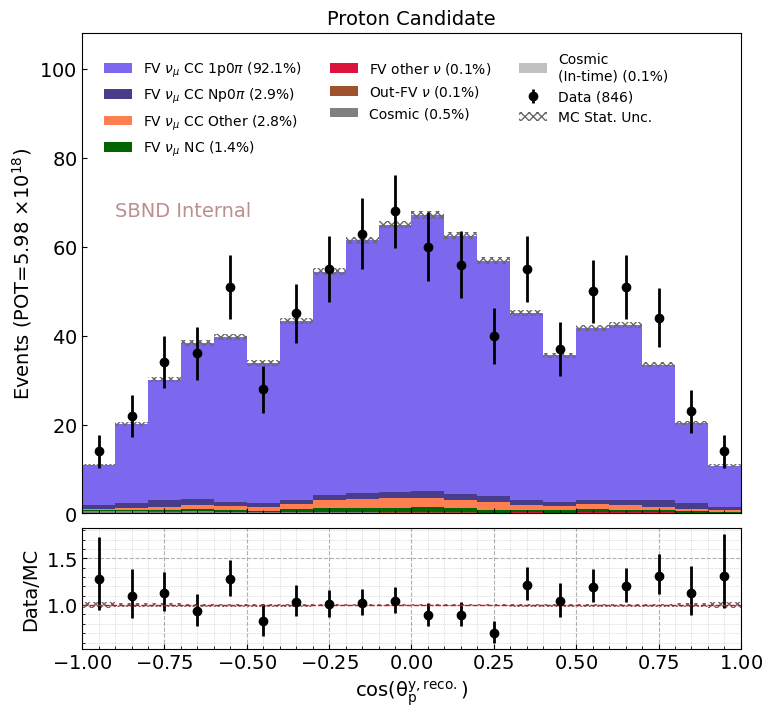

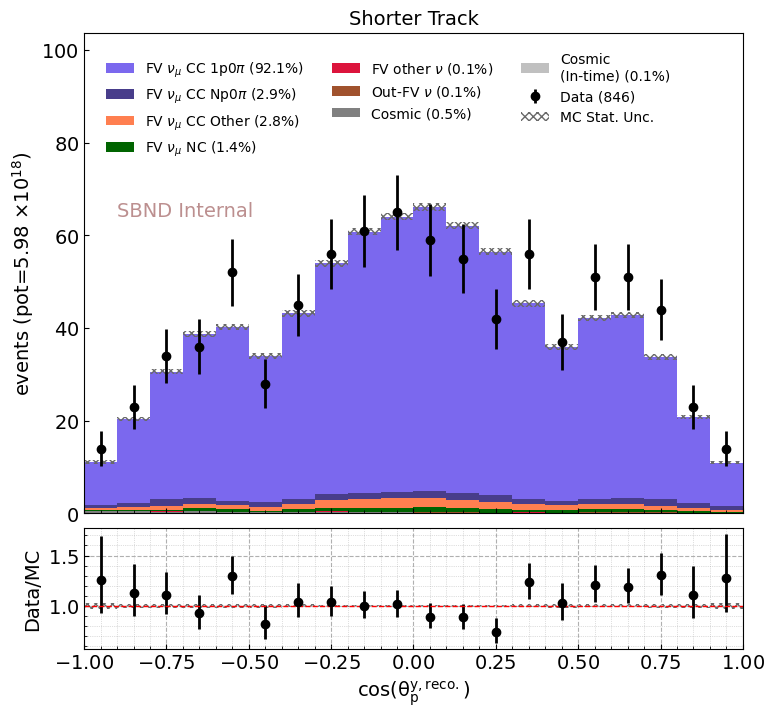

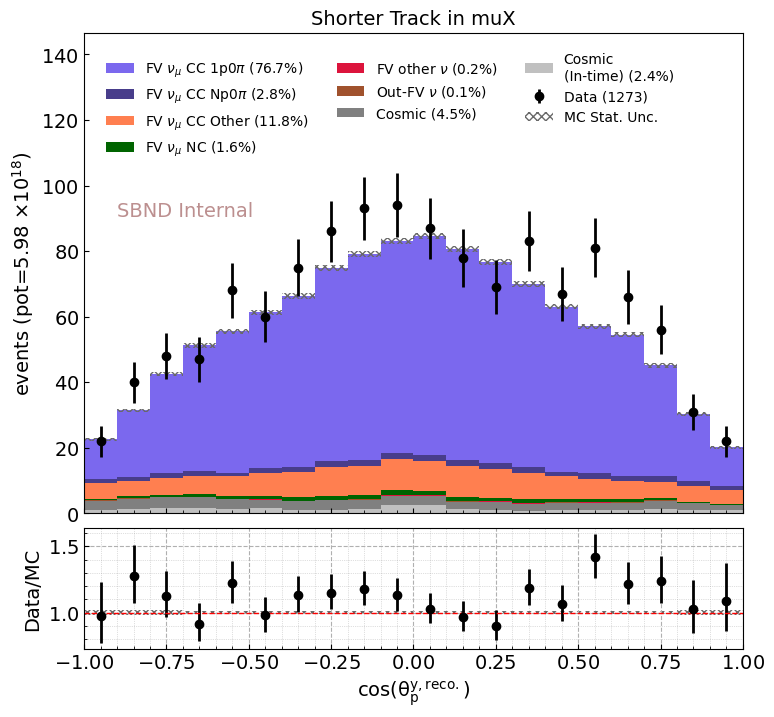

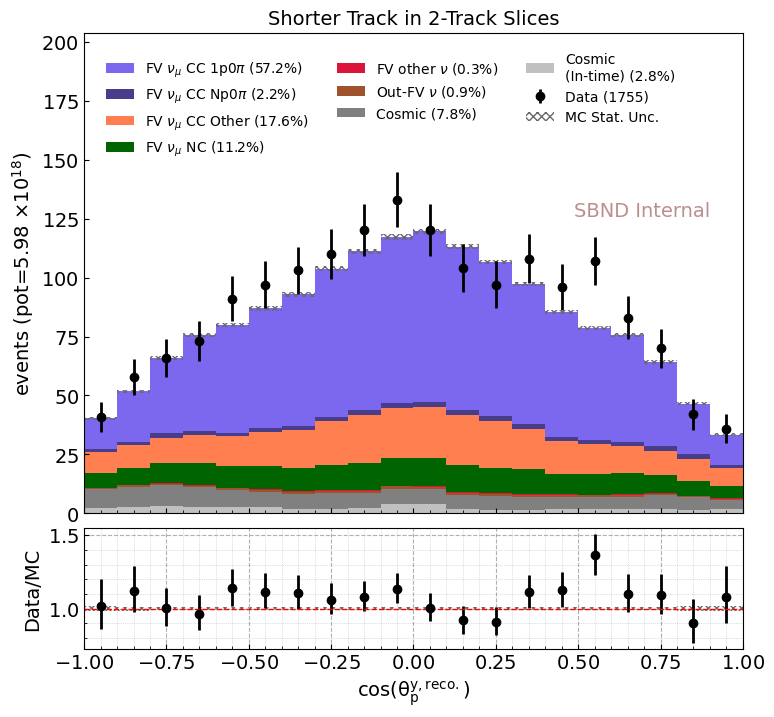

In [92]:
evtdf = mc_evt_df_mup
vardf = mc_p_df.pfp.trk.dir.y
vardf_data = data_p_df.pfp.trk.dir.y
vardf_intime = intime_p_df.pfp.trk.dir.y
bins = np.linspace(-1,1,21)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_p^{y, reco.})}$",
               "Events (POT={})".format(pot_str), "Proton Candidate"]

plot_type = "topology"
save_name = save_fig_dir + "/p_dir_y_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)


evtdf = mc_evt_df_mup
vardf = mc_evt_df_mup.t2.pfp.trk.dir.y
vardf_data = data_evt_df_mup.t2.pfp.trk.dir.y
vardf_intime = intime_evt_df_mup.t2.pfp.trk.dir.y
bins = np.linspace(-1,1,21)
eps = 1e-8
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_p^{y, reco.})}$",
               "events (pot={})".format(pot_str), "Shorter Track"]

plot_type = "topology"
save_name = save_fig_dir + "/p_dir_y_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)


evtdf = mc_evt_df_muX
vardf = mc_evt_df_muX.t2.pfp.trk.dir.y
vardf_data = data_evt_df_muX.t2.pfp.trk.dir.y
vardf_intime = intime_evt_df_muX.t2.pfp.trk.dir.y
bins = np.linspace(-1,1,21)
eps = 1e-8
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_p^{y, reco.})}$",
               "events (pot={})".format(pot_str), "Shorter Track in muX"]

plot_type = "topology"
save_name = save_fig_dir + "/p_dir_y_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)


evtdf = mc_evt_df_2prong
vardf = mc_evt_df_2prong.t2.pfp.trk.dir.y
vardf_data = data_evt_df_2prong.t2.pfp.trk.dir.y
vardf_intime = intime_evt_df_2prong.t2.pfp.trk.dir.y
bins = np.linspace(-1,1,21)
eps = 1e-8
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_p^{y, reco.})}$",
               "events (pot={})".format(pot_str), "Shorter Track in 2-Track Slices"]

plot_type = "topology"
save_name = save_fig_dir + "/p_dir_y_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)


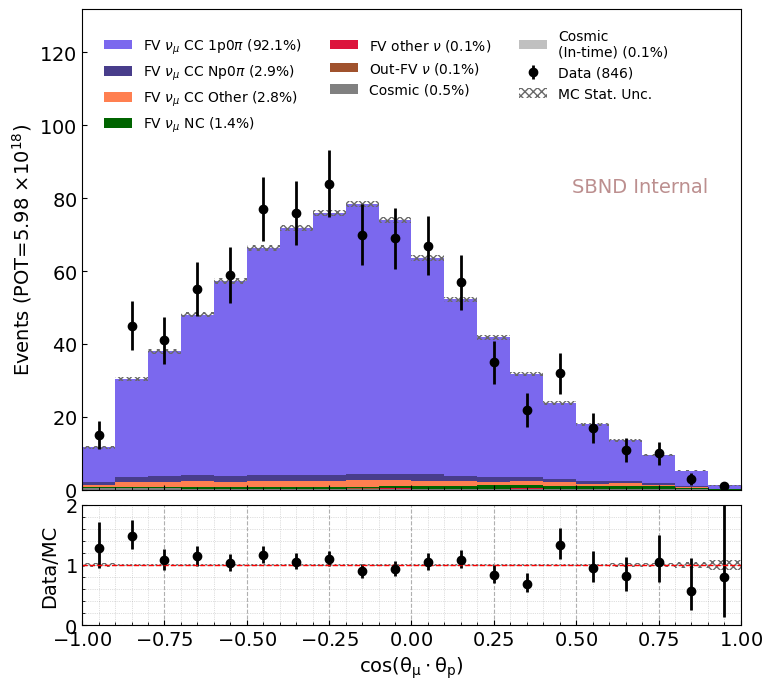

numu NC 1122


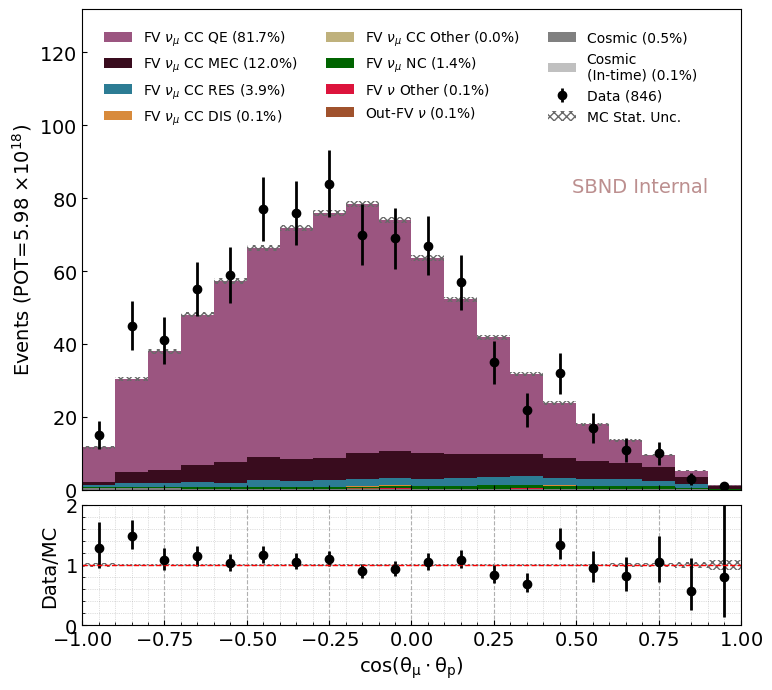

In [93]:
# opening angle
evtdf = mc_evt_df_mup
mcdf = mc_mu_df #.reset_index(level=[3])
pudf = mc_p_df #.reset_index(level=[3])
vardf = mcdf.pfp.trk.dir.x * pudf.pfp.trk.dir.x + mcdf.pfp.trk.dir.y * pudf.pfp.trk.dir.y + mcdf.pfp.trk.dir.z * pudf.pfp.trk.dir.z
data_mudf = data_mu_df #.reset_index(level=[3])
data_pdf = data_p_df #.reset_index(level=[3])
vardf_data = data_mudf.pfp.trk.dir.x * data_pdf.pfp.trk.dir.x + data_mudf.pfp.trk.dir.y * data_pdf.pfp.trk.dir.y + data_mudf.pfp.trk.dir.z * data_pdf.pfp.trk.dir.z
intime_mcdf = intime_mu_df #.reset_index(level=[3])
intime_pudf = intime_p_df #.reset_index(level=[3])
vardf_intime = intime_mcdf.pfp.trk.dir.x * intime_pudf.pfp.trk.dir.x + intime_mcdf.pfp.trk.dir.y * intime_pudf.pfp.trk.dir.y + intime_mcdf.pfp.trk.dir.z * intime_pudf.pfp.trk.dir.z
bins = np.linspace(-1,1,21)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_{\mu} \cdot \theta_p)}$", 
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/mu_p_opening_angle_{}.png".format(plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/mu_p_opening_angle_{}.png".format(plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

In [94]:
# opening angle
mcdf = mc_mu_df #.reset_index(level=[3])
pudf = mc_p_df #.reset_index(level=[3])
vardf = mcdf.pfp.trk.dir.x * pudf.pfp.trk.dir.x + mcdf.pfp.trk.dir.y * pudf.pfp.trk.dir.y + mcdf.pfp.trk.dir.z * pudf.pfp.trk.dir.z
data_mudf = data_mu_df #.reset_index(level=[3])
data_pdf = data_p_df #.reset_index(level=[3])
vardf_data = data_mudf.pfp.trk.dir.x * data_pdf.pfp.trk.dir.x + data_mudf.pfp.trk.dir.y * data_pdf.pfp.trk.dir.y + data_mudf.pfp.trk.dir.z * data_pdf.pfp.trk.dir.z
intime_mcdf = intime_mu_df #.reset_index(level=[3])
intime_pudf = intime_p_df #.reset_index(level=[3])
vardf_intime = intime_mcdf.pfp.trk.dir.x * intime_pudf.pfp.trk.dir.x + intime_mcdf.pfp.trk.dir.y * intime_pudf.pfp.trk.dir.y + intime_mcdf.pfp.trk.dir.z * intime_pudf.pfp.trk.dir.z
bins = np.linspace(-1,1,21)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\mathrm{cos(\theta_{\mu} \cdot \theta_p)}$", 
               "Events (POT={})".format(pot_str), ""]

z_bins = [-200, -100, 0, 100, 200]

for i in range(len(z_bins)-1):
    z_min = z_bins[i]
    z_max = z_bins[i+1]
    plot_labels[2] = "{} < Vertex X [cm] < {}".format(z_min, z_max)

    mc_mask = (mc_evt_df_mup.slc.vertex.x > z_min) & (mc_evt_df_mup.slc.vertex.x < z_max)
    this_evtdf = mc_evt_df_mup[mc_mask]
    this_vardf = vardf[mc_mask]
    data_mask = (data_evt_df_mup.slc.vertex.x > z_min) & (data_evt_df_mup.slc.vertex.x < z_max)
    this_vardf_data = vardf_data[data_mask]
    intime_mask = (intime_evt_df_mup.slc.vertex.x > z_min) & (intime_evt_df_mup.slc.vertex.x < z_max)
    this_vardf_intime = vardf_intime[intime_mask]

    plot_type = "topology"
    save_name = save_fig_dir + f"/mu_p_opening_angle_{}_vertex_x_{}to{}.png".format(plot_type, z_min, z_max)
    ret_hist_topo = hist_plot(plot_type,
                            this_evtdf, this_vardf, 
                            this_vardf_data, this_vardf_intime,
                            bins, 
                            plot_labels,
                            save_fig=save_fig, save_name=save_name)

SyntaxError: f-string: empty expression not allowed (2380815755.py, line 34)

In [ ]:
# delta p_x, delta p_y
evtdf = mc_evt_df_mup
tki_name = "del_Tp_x"
var_config = VariableConfig.tki_del_Tp_x()
vardf = mc_ret_tki[tki_name]
vardf_data = data_ret_tki[tki_name]
vardf_intime = intime_ret_tki[tki_name]
bins = var_config.bins
bins = [-0.7] + list(np.linspace(-0.5,0.5,15)) + [0.7]
bins = np.array(bins)
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\delta p_{T,x}$ [GeV/c]",
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

evtdf = mc_evt_df_mup
tki_name = "del_Tp_y"
var_config = VariableConfig.tki_del_Tp_y()
vardf = mc_ret_tki[tki_name]
vardf_data = data_ret_tki[tki_name]
vardf_intime = intime_ret_tki[tki_name]
# bins = var_config.bins
vardf = np.clip(vardf, bins[0], bins[-1] - eps)
vardf_data = np.clip(vardf_data, bins[0], bins[-1] - eps)
vardf_intime = np.clip(vardf_intime, bins[0], bins[-1] - eps)
plot_labels = [r"$\delta p_{T,y}$ [GeV/c]",
               "Events (POT={})".format(pot_str), ""]

plot_type = "topology"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_topo = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)

plot_type = "genie"
save_name = save_fig_dir + "/tki-{}_{}.png".format(tki_name, plot_type)
ret_hist_genie = hist_plot(plot_type,
                          evtdf, vardf, 
                          vardf_data, vardf_intime,
                          bins, 
                          plot_labels,
                          save_fig=save_fig, save_name=save_name)


In [ ]:
# Q2
# evtdf = mc_evt_df_mup

In [ ]:
# W

In [ ]:
# E_cal

## Kinematic Reconstruction

### Vertex Position

In [ ]:
# vertex reconstruction performance for neutrino slices
fig, axs = plt.subplots(1,3, figsize=(16,4))
for i, axis in enumerate(["x", "y", "z"]):
    var = mc_evt_df[IsNu(mc_evt_df)].slc.vertex[axis] - mc_evt_df[IsNu(mc_evt_df)].slc.truth.position[axis]
    bins = np.linspace(-2, 2, 101)
    # bins = 100
    axs[i].hist(var, bins=bins)
    axs[i].set_xlabel("(Reco-True) in {} Coordinate [cm]".format(axis))
    axs[i].set_ylabel("Slices")
    axs[i].text(0.05, 0.95, "SBND Simulation\nSBND Internal", fontsize=12, transform=axs[i].transAxes, 
                color="rosybrown", ha="left", va="top")

plt.suptitle("(Reconstructed Slice Vertex - True Interaction Position) of Neutrino Events", y=1.02)
save_name = save_fig_dir + "/vertex_reco_res_3d.png"
if save_fig:
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
plt.show()

### Momentum

In [ ]:
import matplotlib.colors as mcolors
from matplotlib.transforms import Bbox

In [ ]:
mc_mu_df[("pfp", "trk", "truth", "p", "totp", "")] = np.sqrt(mc_mu_df[("pfp", "trk", "truth", "p", "genp", "x")]**2 + mc_mu_df[("pfp", "trk", "truth", "p", "genp", "y")]**2 + mc_mu_df[("pfp", "trk", "truth", "p", "genp", "z")]**2)
mc_p_df[("pfp", "trk", "truth", "p", "totp", "")] = np.sqrt(mc_p_df[("pfp", "trk", "truth", "p", "genp", "x")]**2 + mc_p_df[("pfp", "trk", "truth", "p", "genp", "y")]**2 + mc_p_df[("pfp", "trk", "truth", "p", "genp", "z")]**2)
mc_mu_df[("pfp", "trk", "truth", "p", "dir", "z")] = mc_mu_df[("pfp", "trk", "truth", "p", "genp", "z")] / mc_mu_df[("pfp", "trk", "truth", "p", "totp")]
mc_p_df[("pfp", "trk", "truth", "p", "dir", "z")] = mc_p_df[("pfp", "trk", "truth", "p", "genp", "z")] / mc_p_df[("pfp", "trk", "truth", "p", "totp")]

In [ ]:
mc_mu_df.pfp.trk.truth.p

In [ ]:
var_true = mc_evt_df_mup[mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13].t1.pfp.trk.truth.p.totp
var_reco = mc_evt_df_mup[mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13].t1.pfp.trk.rangeP.p_muon
plot_labels = ["True $P_{\\mu}$ [GeV/c]", "Reconstructed $P_{\\mu}$ [GeV/c]", "Muons of Selected True Signal Events"]
plot_labels_frac = ["$(P_{\\mu}^{reco} - P_{\\mu}^{true}) / P_{\\mu}^{true}$"]
bins = np.linspace(0.15, 1.1, 41)
bins_frac = np.linspace(-0.1, 0.1, 41)

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_true, var_reco, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
ax[0].text(0.05, 0.95, "SBND Simulation\nSBND Internal", fontsize=12, transform=ax[0].transAxes, 
            color="rosybrown", ha="left", va="top")
plt.colorbar(im[3], ax=ax[0], label="Tracks")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_true > bins[i]) & (var_true < bins[i+1])
    # this_diff = (var_true[this_cut] - var_reco[this_cut])/var_reco[this_cut]
    this_diff = (var_reco[this_cut] - var_true[this_cut])/var_true[this_cut]
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -0.2, 0.2)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])
ax[1].set_ylim(-0.05, 0.05)

save_name = save_fig_dir + "/kin_true-P_res-mu_rangeP_mu_candidate.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_reco = mc_evt_df_mup[mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13].t1.pfp.trk.rangeP.p_muon
var_true = mc_evt_df_mup[mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13].t1.pfp.trk.truth.p.totp
bins = np.linspace(0.2, 1.1, 41)
bins_frac = np.linspace(-0.1, 0.1, 41)

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_true > bins[i]) & (var_true < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])/var_true[this_cut]
    plt.hist(this_diff, bins=bins_frac, alpha=0.5)
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -1, 1)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2

In [ ]:
# var_reco = mc_evt_df_mup[mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212].t2.pfp.trk.rangeP.p_proton
# var_true = mc_evt_df_mup[mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212].t2.pfp.trk.truth.p.totp
# plot_labels = ["Reconstructed $P_{p}$ [GeV/c]", "True $P_{p}$ [GeV/c]", "Protons of Selected True Signal Events"]
# plot_labels_frac = ["$(P_{p}^{reco} - P_{p}^{true}) / P_{p}^{true}$"]
# bins = np.linspace(0.15, 1.2, 41)

# fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

# im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
# ax[0].set_xlabel(plot_labels[0])
# ax[0].set_ylabel(plot_labels[1])
# ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
# ax[0].set_title(plot_labels[2])
# plt.colorbar(im[3], ax=ax[0], label="Tracks")

# mean_list = []
# sig_list = []
# for i in range(len(bins)-1):
#     this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
#     this_diff = (var_reco[this_cut] - var_true[this_cut])/var_true[this_cut]
#     this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
#     this_diff = np.clip(this_diff, -0.2, 0.2)
#     mean_list.append(np.median(this_diff))
#     sig_list.append(np.std(this_diff))
# bin_centers = (bins[:-1] + bins[1:])/2
# ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# # Match the size and position of the lower subplot to the upper subplot

# # Set x-limits to match
# ax[1].set_xlim(ax[0].get_xlim())

# # Match subplot width and position
# pos0 = ax[0].get_position()
# pos1 = ax[1].get_position()
# ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
# ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
# ax[1].set_xlabel(plot_labels[0])
# ax[1].set_ylabel(plot_labels_frac[0])

# save_name = save_fig_dir + "/kin_reco-P_res-p_rangeP.pdf"
# if save_fig:
#     plt.savefig(save_name, bbox_inches="tight")
# plt.show();

In [ ]:
var_true = mc_evt_df_mup[mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212].t2.pfp.trk.truth.p.totp
var_reco = mc_evt_df_mup[mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212].t2.pfp.trk.rangeP.p_proton
plot_labels = ["True $P_{p}$ [GeV/c]", "Reconstructed $P_{p}$ [GeV/c]", "Protons of Selected True Signal Events"]
plot_labels_frac = ["$(P_{p}^{reco} - P_{p}^{true}) / P_{p}^{true}$"]
bins = np.linspace(0.15, 1.2, 41)

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_true, var_reco, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
ax[0].text(0.05, 0.95, "SBND Simulation\nSBND Internal", fontsize=12, transform=ax[0].transAxes, 
            color="rosybrown", ha="left", va="top")
plt.colorbar(im[3], ax=ax[0], label="Tracks")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_true > bins[i]) & (var_true < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])/var_true[this_cut]
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -0.4, 0.4)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])
ax[1].set_ylim(-0.2, 0.2)

save_name = save_fig_dir + "/kin_true-P_res-p_rangeP.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_reco = mc_evt_df_mup[mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212].t2.pfp.trk.rangeP.p_proton
var_true = mc_evt_df_mup[mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212].t2.pfp.trk.truth.p.totp
bins = np.linspace(0.2, 1.1, 41)
bins_frac = np.linspace(-0.1, 0.1, 41)

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_true > bins[i]) & (var_true < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])/var_true[this_cut]
    plt.hist(this_diff, bins=bins_frac, alpha=0.5)
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -1, 1)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))

### Direction

In [ ]:
import statsmodels.api as sm

def eff_err(success,total):  # success/total
    err = [[],[]]
    eff = success/total
    for i in range(len(success)):
        this_success = success[i]
        this_tot = total[i]
        interval = sm.stats.proportion_confint(this_success,this_tot,method='wilson')
        err[0].append(abs(eff[i]-interval[0]))
        err[1].append(abs(eff[i]-interval[1]))
    return err

In [ ]:
var_reco = np.arccos(mc_evt_df_mup[mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13].t1.pfp.trk.dir.z) * 180/np.pi
var_true = np.arccos(mc_evt_df_mup[mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13].t1.pfp.trk.truth.p.dir.z) * 180/np.pi
plot_labels = ["True $\\theta_{\\mu}$ [deg]", "Reconstructed $\\theta_{\\mu}$ [deg]", "Muons of Selected True Signal Events"]
plot_labels_frac = ["$\\theta_{\\mu}^{reco} - \\theta_{\\mu}^{true}$"]
# bins = np.linspace(0, np.pi, 41)
bins = np.linspace(0, 180, 41)

fig, ax = plt.subplots(3,1, figsize=(7,10), height_ratios=[4,1.2,1.2])

im = ax[0].hist2d(var_true, var_reco, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
# ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
ax[0].text(0.5, 0.95, "SBND Simulation\nSBND Internal", fontsize=12, transform=ax[0].transAxes, 
            color="rosybrown", ha="center", va="top")
plt.colorbar(im[3], ax=ax[0], label="Tracks")

mean_list = []
sig_list = []
flipped_list = []
flipped_err = []
for i in range(len(bins)-1):
    this_cut = (var_true > bins[i]) & (var_true < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    # exclude flipped tracks: subtract 90, check signs
    is_flipped = ( np.abs(var_reco[this_cut] - var_true[this_cut]) > 45)
    flipped_perc = np.sum(is_flipped) / len(this_cut)
    flipped_list.append(flipped_perc)
    this_flipped_err = eff_err(np.array([np.sum(is_flipped)]), np.array([len(this_cut)]))
    flipped_err.append(this_flipped_err)
    this_diff = this_diff[~is_flipped]
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    # this_diff = np.clip(this_diff, -20, 20)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
# ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])
ax[1].set_ylim(-15, 15)

ax[2].errorbar(bin_centers, np.array(flipped_list)*100, yerr=np.array(flipped_err).reshape(2,40)*100, fmt="o", color="black")
# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[2].get_position()
ax[2].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[2].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[2].set_xlabel(plot_labels[0])
ax[2].set_ylabel("Outliers [%]")

save_name = save_fig_dir + "/kin_reco-thetaz_res-mu.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_reco = np.arccos(mc_evt_df_mup[mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13].t1.pfp.trk.dir.z) * 180/np.pi
var_true = np.arccos(mc_evt_df_mup[mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13].t1.pfp.trk.truth.p.dir.z) * 180/np.pi
bins = np.linspace(0, 180, 41)
bins_frac = np.linspace(-20, 20, 41)

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    plt.hist(this_diff, bins=bins_frac, alpha=0.5)
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -1, 1)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))

In [ ]:
save_fig_dir

In [ ]:
var_reco = np.arccos(mc_evt_df_mup[mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212].t1.pfp.trk.dir.z) * 180/np.pi
var_true = np.arccos(mc_evt_df_mup[mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212].t1.pfp.trk.truth.p.dir.z) * 180/np.pi
plot_labels = ["True $\\theta_{p}$ [deg]", "Reconstructed $\\theta_{p}$ [deg]", "Protons of Selected True Signal Events"]
plot_labels_frac = ["$\\theta_{p}^{reco} - \\theta_{p}^{true}$"]
bins = np.linspace(0, 180, 41)

fig, ax = plt.subplots(3,1, figsize=(7,10), height_ratios=[4,1.2,1.2])

im = ax[0].hist2d(var_true, var_reco, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
# ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
ax[0].text(0.5, 0.95, "SBND Simulation\nSBND Internal", fontsize=12, transform=ax[0].transAxes, 
            color="rosybrown", ha="center", va="top")
plt.colorbar(im[3], ax=ax[0], label="Tracks")

mean_list = []
sig_list = []
flipped_list = []
flipped_err = []
for i in range(len(bins)-1):
    this_cut = (var_true > bins[i]) & (var_true < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    is_flipped = ( np.abs(var_reco[this_cut] - var_true[this_cut]) > 45)
    flipped_perc = np.sum(is_flipped) / len(this_cut)
    flipped_list.append(flipped_perc)
    this_flipped_err = eff_err(np.array([np.sum(is_flipped)]), np.array([len(this_cut)]))
    flipped_err.append(this_flipped_err)
    this_diff = this_diff[~is_flipped]
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -15, 15)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
# ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

ax[2].errorbar(bin_centers, np.array(flipped_list)*100, yerr=np.array(flipped_err).reshape(2,40)[::-1]*100, fmt="o", color="black")
# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[2].get_position()
ax[2].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[2].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[2].set_xlabel(plot_labels[0])
ax[2].set_ylabel("Outliers [%]")

save_name = save_fig_dir + "/kin_reco-thetaz_res-p.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_reco = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].del_Tp
var_true = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].mc_del_Tp
plot_labels = ["Reconstructed $\\delta p_T$ [GeV/c]", "True $\\delta p_T$ [GeV/c]", "True Selected Signal Events"]
plot_labels_frac = ["$\\delta p_T^{reco} - \\delta p_T^{true}$"]
bins = np.linspace(0, 1.1, 41)

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
ax[0].text(0.05, 0.95, "SBND Simulation\nSBND Internal", fontsize=12, transform=ax[0].transAxes, 
            color="rosybrown", ha="left", va="top")
plt.colorbar(im[3], ax=ax[0], label="Events")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -0.3, 0.3)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

save_name = save_fig_dir + "/kin_reco-delTp_res.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_reco = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].del_alpha 
var_true = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].mc_del_alpha
plot_labels = ["Reconstructed $\\delta \\alpha_T$ [deg]", "True $\\delta \\alpha_T$ [deg]", "True Selected Signal Events"]
plot_labels_frac = ["$\\delta \\alpha^{reco}_T - \\delta \\alpha^{true}_T$"]
bins = np.linspace(0, 180, 41)

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
ax[0].text(0.05, 0.95, "SBND Simulation\nSBND Internal", fontsize=12, transform=ax[0].transAxes, 
            color="rosybrown", ha="left", va="top")
plt.colorbar(im[3], ax=ax[0], label="Events")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -30, 30)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

save_name = save_fig_dir + "/kin_reco-delalpha_res.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_reco = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].del_phi 
var_true = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].mc_del_phi
plot_labels = ["Reconstructed $\\delta \\phi_T$ [deg]", "True $\\delta \\phi_T$ [deg]", "True Selected Signal Events"]
plot_labels_frac = ["$\\delta \\phi^{reco}_T - \\delta \\phi^{true}_T$"]
bins = np.linspace(0, 180, 41)

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
ax[0].text(0.05, 0.95, "SBND Simulation\nSBND Internal", fontsize=12, transform=ax[0].transAxes, 
            color="rosybrown", ha="left", va="top")
plt.colorbar(im[3], ax=ax[0], label="Events")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -30, 30)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

save_name = save_fig_dir + "/kin_reco-delalpha_res.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_reco = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].del_phi
var_true = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].mc_del_phi 
plot_labels = ["Reconstructed $\\delta \\phi_T$ [deg]", "True $\\delta \\phi_T$ [deg]", "True Selected Signal Events"]
plot_labels_frac = ["$\\delta \\phi^{reco}_T - \\delta \\phi^{true}_T$"]
bins = np.linspace(0, 180, 41)
bins_frac = np.linspace(-20, 20, 41)

mean_list = []
sig_list = []
# for i in range(len(bins)-1):
for i in range(3):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    plt.hist(this_diff, bins=bins_frac, alpha=0.5)

    # this_diff = np.clip(this_diff, -1, 1)
    # mean_list.append(np.median(this_diff))
    # sig_list.append(np.std(this_diff))

### Resolution in Measurement Bins

In [ ]:
def percentage_in_diag(matrix):
    total = np.sum(matrix)
    diag = np.sum(np.diag(matrix))
    return diag/total

In [ ]:
var_config = VariableConfig.muon_momentum()
bins = var_config.bins
var_reco = mc_evt_df_mup[(mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13) & IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].t1.pfp.trk.rangeP.p_muon
var_true = mc_evt_df_mup[(mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13) & IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].t1.pfp.trk.truth.p.totp
var_reco = np.clip(var_reco, var_config.bins[0], var_config.bins[-1] - eps)
var_true = np.clip(var_true, var_config.bins[0], var_config.bins[-1] - eps)
plot_labels = ["Reconstructed $P_{\\mu}$ [GeV/c]", "True $P_{\\mu}$ [GeV/c]", "Muons of Selected True Signal Events"]
plot_labels_frac = ["$(P_{\\mu}^{reco} - P_{\\mu}^{true}) / P_{\\mu}^{true}$"]

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
plt.colorbar(im[3], ax=ax[0], label="Tracks")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])/var_true[this_cut]
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -0.3, 0.3)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

diag_frac = percentage_in_diag(im[0]) * 1e2
print(f"Fraction of events in the diagonal: {diag_frac:.2f}")

save_name = save_fig_dir + "/kin_reco-P_res-mu_rangeP_mu_candidate-measurement_bins.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_config = VariableConfig.proton_momentum()
bins = var_config.bins

var_reco = mc_evt_df_mup[(mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212) & IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].t2.pfp.trk.rangeP.p_proton
var_true = mc_evt_df_mup[(mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212) & IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].t2.pfp.trk.truth.p.totp
var_reco = np.clip(var_reco, var_config.bins[0], var_config.bins[-1] - eps)
var_true = np.clip(var_true, var_config.bins[0], var_config.bins[-1] - eps)
plot_labels = ["Reconstructed $P_{p}$ [GeV/c]", "True $P_{p}$ [GeV/c]", "Protons of Selected True Signal Events"]
plot_labels_frac = ["$(P_{p}^{reco} - P_{p}^{true}) / P_{p}^{true}$"]

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])
im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
plt.colorbar(im[3], ax=ax[0], label="Tracks")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])/var_true[this_cut]
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -0.3, 0.3)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

diag_frac = percentage_in_diag(im[0]) * 1e2
print(f"Fraction of events in the diagonal: {diag_frac:.2f}")

save_name = save_fig_dir + "/kin_reco-P_res-p_rangeP_p_candidate-measurement_bins.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

### Direction

In [ ]:
var_config = VariableConfig.muon_direction()
bins = var_config.bins

var_reco = mc_evt_df_mup[(mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13) & IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].t1.pfp.trk.dir.z
var_true = mc_evt_df_mup[(mc_evt_df_mup.t1.pfp.trk.truth.p.pdg == 13) & IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].t1.pfp.trk.truth.p.dir.z
var_reco = np.clip(var_reco, var_config.bins[0], var_config.bins[-1] - eps)
var_true = np.clip(var_true, var_config.bins[0], var_config.bins[-1] - eps)
plot_labels = ["Reconstructed $\\cos (\\theta_{\\mu})$", "True $\\cos (\\theta_{\\mu})$", "Muons of Selected True Signal Events"]
plot_labels_frac = ["$\\cos (\\theta_{\\mu}^{reco}) - \\cos (\\theta_{\\mu}^{true})$"]

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
plt.colorbar(im[3], ax=ax[0], label="Tracks")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -0.2, 0.2)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

diag_frac = percentage_in_diag(im[0]) * 1e2
print(f"Fraction of events in the diagonal: {diag_frac:.2f}")

save_name = save_fig_dir + "/kin_reco-thetaz_res-mu-measurement_bins.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_config = VariableConfig.proton_direction()
bins = var_config.bins

var_reco = mc_evt_df_mup[(mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212) & IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].t2.pfp.trk.dir.z
var_true = mc_evt_df_mup[(mc_evt_df_mup.t2.pfp.trk.truth.p.pdg == 2212) & IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].t2.pfp.trk.truth.p.dir.z
var_reco = np.clip(var_reco, var_config.bins[0], var_config.bins[-1] - eps)
var_true = np.clip(var_true, var_config.bins[0], var_config.bins[-1] - eps)
plot_labels = ["Reconstructed $\\cos (\\theta_{p})$", "True $\\cos (\\theta_{p})$", "Protons of Selected True Signal Events"]
plot_labels_frac = ["$\\cos (\\theta_{p}^{reco}) - \\cos (\\theta_{p}^{true})$"]

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
plt.colorbar(im[3], ax=ax[0], label="Tracks")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -0.2, 0.2)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

diag_frac = percentage_in_diag(im[0]) * 1e2
print(f"Fraction of events in the diagonal: {diag_frac:.2f}")

save_name = save_fig_dir + "/kin_reco-thetaz_res-p-measurement_bins.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_config = VariableConfig.tki_del_Tp()
bins = var_config.bins

var_reco = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].del_Tp
var_true = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].mc_del_Tp
var_reco = np.clip(var_reco, var_config.bins[0], var_config.bins[-1] - eps)
var_true = np.clip(var_true, var_config.bins[0], var_config.bins[-1] - eps)
plot_labels = ["Reconstructed $\\delta p_T$ [GeV/c]", "True $\\delta p_T$ [GeV/c]", "True Selected Signal Events"]
plot_labels_frac = ["$\\delta p_T^{reco} - \\delta p_T^{true}$"]

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
plt.colorbar(im[3], ax=ax[0], label="Events")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -0.3, 0.3)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

diag_frac = percentage_in_diag(im[0]) * 1e2
print(f"Fraction of events in the diagonal: {diag_frac:.2f}")

save_name = save_fig_dir + "/kin_reco-delTp_res-measurement_bins.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_config = VariableConfig.tki_del_alpha()
bins = var_config.bins

var_reco = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].del_alpha
var_true = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].mc_del_alpha
plot_labels = ["Reconstructed $\\delta \\alpha_T$ [deg]", "True $\\delta \\alpha_T$ [deg]", "True Selected Signal Events"]
plot_labels_frac = ["$\\delta \\alpha^{reco}_T - \\delta \\alpha^{true}_T$"]

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
plt.colorbar(im[3], ax=ax[0], label="Events")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -30, 30)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

diag_frac = percentage_in_diag(im[0]) * 1e2
print(f"Fraction of events in the diagonal: {diag_frac:.2f}")

save_name = save_fig_dir + "/kin_reco-delalpha_res-measurement_bins.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_config = VariableConfig.tki_del_phi()
bins = var_config.bins

var_reco = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].del_phi
var_true = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].mc_del_phi
plot_labels = ["Reconstructed $\\delta \\phi_T$ [deg]", "True $\\delta \\phi_T$ [deg]", "True Selected Signal Events"]
plot_labels_frac = ["$\\delta \\phi^{reco}_T - \\delta \\phi^{true}_T$"]

fig, ax = plt.subplots(2,1, figsize=(7,8), height_ratios=[4,1.2])

im = ax[0].hist2d(var_reco, var_true, bins=bins, norm=mcolors.LogNorm(), cmap="viridis")
ax[0].set_xlabel(plot_labels[0])
ax[0].set_ylabel(plot_labels[1])
ax[0].plot(bins, bins, color="red", linestyle="--", alpha=0.5)
ax[0].set_title(plot_labels[2])
plt.colorbar(im[3], ax=ax[0], label="Events")

mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -30, 30)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))
bin_centers = (bins[:-1] + bins[1:])/2
ax[1].errorbar(bin_centers, mean_list, yerr=sig_list, fmt="o", color="black")
# Match the size and position of the lower subplot to the upper subplot

diag_frac = percentage_in_diag(im[0]) * 1e2
print(f"Fraction of events in the diagonal: {diag_frac:.2f}")

# Set x-limits to match
ax[1].set_xlim(ax[0].get_xlim())

# Match subplot width and position
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
ax[1].set_position([pos0.x0, pos1.y0, pos0.width, pos1.height])
ax[1].axhline(0, color="red", linestyle="--", alpha=0.5)
ax[1].set_xlabel(plot_labels[0])
ax[1].set_ylabel(plot_labels_frac[0])

save_name = save_fig_dir + "/kin_reco-delphi_res-measurement_bins.pdf"
if save_fig:
    plt.savefig(save_name, bbox_inches="tight")
plt.show();

In [ ]:
var_config = VariableConfig.tki_del_phi()
bins = var_config.bins
bins_frac = np.linspace(-30, 30, 41)

var_reco = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].del_phi
var_true = mc_evt_df_mup[IsNuInFV_NumuCC_1p0pi(mc_evt_df_mup)].mc_del_phi * 180/np.pi
mean_list = []
sig_list = []
for i in range(len(bins)-1):
    this_cut = (var_reco > bins[i]) & (var_reco < bins[i+1])
    this_diff = (var_reco[this_cut] - var_true[this_cut])
    plt.hist(this_diff, bins=bins_frac, alpha=0.5)
    this_diff = this_diff[~np.isnan(this_diff) & ~np.isinf(this_diff)]
    this_diff = np.clip(this_diff, -30, 30)
    mean_list.append(np.median(this_diff))
    sig_list.append(np.std(this_diff))

# Save fully selected df

In [ ]:
from pyanalib.pandas_helpers import *

In [ ]:
save_df = False

In [ ]:
mc_evt_df_mup
mc_mu_df
len(data_evt_df_mup) * 20 * 10

In [ ]:
mc_mu_df.columns = pd.MultiIndex.from_tuples([tuple(["mu"] + list(c)) for c in mc_mu_df.columns])
mc_evt_df_mup = multicol_merge(mc_evt_df_mup, mc_mu_df, left_index=True, right_index=True, how="left", validate="one_to_one")

mc_p_df.columns = pd.MultiIndex.from_tuples([tuple(["p"] + list(c)) for c in mc_p_df.columns])
mc_evt_df_mup = multicol_merge(mc_evt_df_mup, mc_p_df, left_index=True, right_index=True, how="left", validate="one_to_one")

In [ ]:
mc_evt_df_mup.mu

In [ ]:
# if save_df:
#     mc_evt_df_mup.to_hdf("/exp/sbnd/data/users/munjung/xsec/2025B/MC_bnb_cosmics-final.df", key="evt_0")
#     mc_hdr_df.to_hdf("/exp/sbnd/data/users/munjung/xsec/2025B/MC_bnb_cosmics-final.df", key="hdr_0")

# Get selected event metadata for hand scanning

## Get kinematics of some events

In [ ]:
topo_categ = get_int_category(mc_evt_df_mup)
topo_categ.value_counts()
# mc_evt_df_mup[topo_categ == 3][mult_colnames]

In [ ]:
mult_colnames = ["nmu", "np", "npi", "npi0", "nmu_220MeVc", "np_300MeVc", "npi_70MeVc"]

In [ ]:
badkin_df = mc_evt_df_mup[(topo_categ == 3) & (mc_evt_df_mup.nmu_220MeVc == 1) & (mc_evt_df_mup.np_300MeVc == 1) & (mc_evt_df_mup.npi_70MeVc == 0)]
# ((badkin_df.mu.totp < 0.220) | (badkin_df.mu.totp > 1)).sum()
# ((badkin_df.p.totp < 0.30) | (badkin_df.p.totp > 1)).sum()
(badkin_df.npi0 > 0).sum()

In [ ]:
mc_evt_df_mup[(topo_categ == 3) & (mc_evt_df_mup.npi_70MeVc > 0)]
mc_evt_df_mup[(topo_categ == 3) & (mc_evt_df_mup.npi0 > 1)].npi0

In [ ]:
has_pic = mc_evt_df_mup[(topo_categ == 3) & (mc_evt_df_mup.npi_70MeVc > 0) & (mc_evt_df_mup.genie_mode == 2)]
# has_pi0 = mc_evt_df_mup[mc_evt_df_mup.npi0 > 1]
mc_hdr_df.loc[has_pic.reset_index(level=[2]).index]
# mc_evt_df_mup.loc[has_pic.index].genie_mode.value_counts()

In [ ]:
meta = (3998, 67, 14)
this_evt = mc_hdr_df[(mc_hdr_df.run == meta[0]) & (mc_hdr_df.subrun == meta[1]) & (mc_hdr_df.evt == meta[2])]
this_evt

In [ ]:
print(mc_evt_df.reset_index(level=[2]).loc[this_evt.index].mu.length)
print(mc_evt_df.reset_index(level=[2]).loc[this_evt.index].p.length)
print(mc_evt_df.reset_index(level=[2]).loc[this_evt.index].genie_mode)
print(mc_evt_df.reset_index(level=[2]).loc[this_evt.index].pdg)
print(mc_evt_df.reset_index(level=[2]).loc[this_evt.index].iscc)
# print(mc_evt_df.reset_index(level=[2]).loc[this_evt.index][["nmu", "np", "npi", "npi0"]])
print(mc_evt_df.reset_index(level=[2]).loc[this_evt.index][mult_colnames])
mc_evt_df.reset_index(level=[2]).loc[this_evt.index] #.t1.pfp.trk.len

In [ ]:
colnames = ["run", "subrun", "evt"]

## MC

In [ ]:
topo_categ = get_int_category(mc_evt_df_mup)
topo_categ.value_counts()

# genie_categ = get_genie_category(mc_evt_df_mup)
# genie_categ.value_counts()

In [ ]:
save_meta = False

In [ ]:
if save_meta:
    # signal
    signal_meta = mc_hdr_df.loc[topo_categ[topo_categ == 1].reset_index(level=[2]).index][colnames]
    signal_meta.to_csv("signal_meta.csv", index=False)

    # cosmic
    cosmic_meta = mc_hdr_df.loc[topo_categ[topo_categ == -1].reset_index(level=[2]).index][colnames]
    cosmic_meta.to_csv("cosmic_meta.csv", index=False)

    # nu out of FV
    nu_outfv_meta = mc_hdr_df.loc[topo_categ[topo_categ == 0].reset_index(level=[2]).index][colnames]
    nu_outfv_meta.to_csv("nu_outfv_meta.csv", index=False)

    # numu cc np0pi
    numucc_np0pi_meta = mc_hdr_df.loc[topo_categ[topo_categ == 2].reset_index(level=[2]).index][colnames]
    numucc_np0pi_meta.to_csv("numucc_np0pi_meta.csv", index=False)

    # numu cc other
    numucc_other_meta = mc_hdr_df.loc[topo_categ[topo_categ == 3].reset_index(level=[2]).index][colnames]
    numucc_other_meta.to_csv("numucc_other_meta.csv", index=False)

    # numu nc
    numucc_nc_meta = mc_hdr_df.loc[topo_categ[topo_categ == 4].reset_index(level=[2]).index][colnames]
    numucc_nc_meta.to_csv("numucc_nc_meta.csv", index=False)

    # nu other
    nu_other_meta = mc_hdr_df.loc[topo_categ[topo_categ == 5].reset_index(level=[2]).index][colnames]
    nu_other_meta.to_csv("nu_other_meta.csv", index=False)

## Data

In [ ]:
data_meta = data_hdr_df.loc[data_evt_df_mup.reset_index(level=[2]).index][colnames]
data_meta.to_csv("data_meta.csv", index=False)

# Event Breakdown

In [ ]:
# final state topology detailed breakdown
this_df = mc_evt_df_mup[IsNuInFV_NumuCC_Np0pi(mc_evt_df_mup)]
this_df = mc_evt_df_mup[IsNuInFV_NumuCC_Other(mc_evt_df_mup)]
print(len(this_df))
this_df[["nmu_220MeVc", "np_300MeVc", "npi_70MeVc", "npi0"]]
# get unique combinations of nmu_27MeV, np_50MeV, npi_30MeV, npi0 and count how many events have each combination
unique_combinations = this_df[["nmu_220MeVc", "np_300MeVc", "npi_70MeVc", "npi0"]].drop_duplicates()
unique_combinations_list = []
for i in unique_combinations.index:
    nmu_27MeV_val = unique_combinations.loc[i].nmu_220MeVc
    np_50MeV_val = unique_combinations.loc[i].np_300MeVc
    npi_30MeV_val = unique_combinations.loc[i].npi_70MeVc
    npi0_val = unique_combinations.loc[i].npi0
    unique_combinations_list.append((int(nmu_27MeV_val), int(np_50MeV_val), int(npi_30MeV_val), int(npi0_val)))
print(len(unique_combinations_list), "unique combinations")

# count how many events have each combination
perc_list = []
for uc in unique_combinations_list:
    n_this_type = len(this_df[(this_df.nmu_220MeVc == uc[0]) & (this_df.np_300MeVc == uc[1]) & (this_df.npi_70MeVc == uc[2]) & (this_df.npi0 == uc[3])])
    perc = n_this_type/len(mc_evt_df_mup)
    print(uc, perc*100, n_this_type)
    perc_list.append(perc)
print(perc_list)
print(sum(perc_list))

In [ ]:
import pickle
with open("df_dict_2prong.pkl", "wb") as f:
    pickle.dump(df_dict, f)

In [ ]:
!pwd

In [ ]:
df_dict['2prong'].mc_del_Tp

In [ ]:
for k in df_dict_data.keys():
    print(len(df_dict_data[k]))